In [1]:
import os
import sys

dir2 = os.path.abspath("")
dir1 = os.path.dirname(dir2)
if not dir1 in sys.path:
    sys.path.append(dir1)
os.chdir("../..")

In [2]:
%matplotlib inline

from itertools import combinations
import logging
from pathlib import Path
import pickle
from typing import (
    List,
    Optional,
)
import warnings
warnings.filterwarnings("ignore")

from tqdm.auto import tqdm

import numpy as np
import pandas as pd
from scipy import mean
from scipy import stats

import matplotlib.pyplot as plt
from hydra import compose, initialize

plt.style.use("ggplot")

from scipy.stats import kurtosis, skew
from tqdm import tqdm
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import pairwise_distances_argmin_min
from sklearn.metrics import silhouette_score
import umap.umap_ as umap

from src.utils.aggregation import filter_data, aggregate_methods
from src.compare_methods import run_CD, run_dolan_more, bayes_scores
from src.compare_methods.votenrank import run_printtable_votenrank

%load_ext autoreload
%autoreload 2

2024-02-19 15:28:00.102806: I external/local_tsl/tsl/cuda/cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.
2024-02-19 15:28:00.130866: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-02-19 15:28:00.130891: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-02-19 15:28:00.131669: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-02-19 15:28:00.136352: I external/local_tsl/tsl/cuda/cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.
2024-02-19 15:28:00.137065: I tensorflow/core/platform/cpu_feature_guard.cc:1

Extension horovod.torch has not been built: /home/user/conda/lib/python3.9/site-packages/horovod/torch/mpi_lib_v2.cpython-39-x86_64-linux-gnu.so not found
If this is not expected, reinstall Horovod with HOROVOD_WITH_PYTORCH=1 to debug the build error.
Warning! MPI libs are missing, but python applications are still available.
loading region bounding boxes for computing carbon emissions region, this may take a moment...
 100.00% 454/454... rate=3567.29 Hz, eta=0:00:00, total=0:00:01
Done!


# Feature extraction

In [6]:
config_path = Path("config", "dataset")
config_files = list(config_path.glob('*yaml'))

In [29]:
files_to_filter = ['tmall', 'twitch', 'xwines', 'yahoo', 'yoochoose', 'otto', 'lfm', 'hotelrec', 'movielens_100k', 'amazon_books', 'sber_bank']
# files_to_use = ['douban_music', 'epinions', 'food', 'fourthsquare', 'goodreads', 'kuairec_small']
filtered_config_files = [file for file in config_files if file.stem not in files_to_filter]

In [9]:
def get_dataset_features(
    ratings: pd.DataFrame,
    user_id: str = "userId",
    item_id: str = "itemId",
    rating_col: str = "rating",
) -> dict:
    """
    Calculate various features from the ratings DataFrame.

    Parameters:
        ratings (pd.DataFrame): DataFrame containing user-item ratings.
        user_id (str): Name of the column representing user IDs.
        item_id (str): Name of the column representing item IDs.
        rating_col (str): Name of the column representing ratings.

    Returns:
        dict: A dictionary containing calculated features.
    """
    # 1-3 Basic features
    U = ratings[user_id].nunique()
    I = ratings[item_id].nunique()
    R = ratings.shape[0]

    # 4 SpaceSize
    SpaceSize = U * I

    # 5 Shape
    Shape = U / I

    # 6  Density
    Density = R / SpaceSize

    # 7, 8 Rating per user and Rating per item
    Rpu = R / U
    Rpi = R / I

    # 9, 10 Ginii and Giniu
    Ri_counts = ratings[item_id].value_counts().values[::-1]
    Ru_counts = ratings[user_id].value_counts().values[::-1]
    Ginii = 1 - 2 * np.sum((I + 1 - np.arange(1, I + 1)) * Ri_counts) / ((I + 1) * R)
    Giniu = 1 - 2 * np.sum((U + 1 - np.arange(1, U + 1)) * Ru_counts) / ((U + 1) * R)

    # 11-14 Polularity biases
    avg_item_popularity = ratings.groupby(item_id)[user_id].nunique() / U
    ratings = ratings.join(avg_item_popularity.rename("item_popularity", inplace=False), on=item_id)
    popularity_bias = ratings.groupby(user_id)["item_popularity"].mean()
    APB = popularity_bias.mean()
    StPB = popularity_bias.std()
    SkPB = skew(popularity_bias)
    KuPB = kurtosis(popularity_bias)

    # 15-18 Long tail items
    item_popularity = ratings[item_id].value_counts()
    item_popularity_cumsum = item_popularity.cumsum()
    LT_index = np.argmax(item_popularity_cumsum / R > 0.8)
    LT_items = set(item_popularity.iloc[LT_index:].index)
    LT_items_percentage = ratings.groupby(user_id)[item_id].apply(
        lambda x: len(set(x) & LT_items) / len(set(x)) if len(set(x)) > 0 else 0
    )
    LTavg = LT_items_percentage.mean()
    LTstd = LT_items_percentage.std()
    LTsk = skew(LT_items_percentage)
    LTku = kurtosis(LT_items_percentage)

    return {
        "Nu": U,
        "Ni": I,
        "Nr": R,
        "SpaceSize": SpaceSize,
        "Shape": Shape,
        "Density": Density,
        "Rpu": Rpu,
        "Rpi": Rpi,
        "Ginii": Ginii,
        "Giniu": Giniu,
        "APB": APB,
        "StPB": StPB,
        "SkPB": SkPB,
        "KuPB": KuPB,
        "LTavg": LTavg,
        "LTstd": LTstd,
        "LTsk": LTsk,
        "LTku": LTku,
    }

In [10]:
statistics_raw = dict()
statistics_filtered = dict()
statistics_wo_cold_iu = dict()
for config_file in tqdm(filtered_config_files, desc="Processing config files"):
    with initialize(config_path=str(Path("../..") / config_path), version_base=None):
        cfg_data = compose(config_name=str(config_file.name))
    # init some constants
    user_id = "userId"
    item_id = "itemId"
    rating_col = "rating"
    date_col = "timestamp"
    
    train_set = Path("preproc_data", cfg_data["name"], "train.parquet")
    test_set = Path("preproc_data", cfg_data["name"], "test.parquet")

    if not train_set.exists() or not test_set.exists():
        dataset = ClassicDataset()
        dataset.prepare(cfg_data)
        data_train, data_test = train_test_split(
            dataset.prepared_data,
            test_size=.1,
            splitting_type="temporal",
        )
        data_train.to_parquet(train_set)
        data_test.to_parquet(test_set)
        
        

    # get raw data
    train_set = pd.read_parquet(train_set)

    test_set = pd.read_parquet(test_set)

    # get splitted and filtered dataset features
    data_splitted = pd.concat([train_set, test_set])
    data_splitted.reset_index(drop=True, inplace=True)
    
    statistics_wo_cold_iu[cfg_data["name"]] = get_dataset_features(
        data_splitted,
    )
    
    # some additional features
    statistics_wo_cold_iu[cfg_data["name"]]["FracInteractionsTest"] = len(test_set) / (
        len(data_splitted)
    )
    
    statistics_wo_cold_iu[cfg_data["name"]]["FracPassiveUsersTest"] = test_set[user_id].nunique() / (
        data_splitted[user_id].nunique()
    )
    
    statistics_wo_cold_iu[cfg_data["name"]]["FracPassiveItemsTest"] = test_set[item_id].nunique() / (
        data_splitted[item_id].nunique()
    )
    
    # timestamps 
    # full data
    if len(str(int(data_splitted[date_col][0]))) > 11:
        unit = 'ns'
    elif len(str(int(data_splitted[date_col][0]))) > 6:
        unit = 's'
    else:
        unit = 'W'

    date_col = "timestamp"
        
    data_splitted[date_col] = pd.to_datetime(data_splitted[date_col], unit=unit)
    statistics_wo_cold_iu[cfg_data["name"]]["MinDate"] = data_splitted[date_col].min().to_pydatetime()
    statistics_wo_cold_iu[cfg_data["name"]]["MaxDate"] = data_splitted[date_col].max().to_pydatetime()

    # test Set
    test_set[date_col] = pd.to_datetime(test_set[date_col], unit=unit)
    statistics_wo_cold_iu[cfg_data["name"]]["TestDate"] =  test_set[date_col].min().to_pydatetime()
    statistics_wo_cold_iu[cfg_data["name"]]["DeltaTest"] = (test_set[date_col].max() - test_set[date_col].min()).days

Processing config files:   0%|          | 0/30 [00:00<?, ?it/s]

config/dataset/epinions.yaml


Processing config files:   3%|▎         | 1/30 [00:00<00:24,  1.20it/s]

config/dataset/goodreads.yaml


Processing config files:  10%|█         | 3/30 [00:03<00:31,  1.15s/it]

config/dataset/douban_music.yaml
config/dataset/netflix.yaml


Processing config files:  10%|█         | 3/30 [00:27<04:09,  9.23s/it]


KeyboardInterrupt: 

In [38]:
with open(Path("results", "datasets_statistics", "statistics_wo_cold_iu.pcl"), "wb") as f:
    pickle.dump(statistics_wo_cold_iu, f)

# DOE

In [21]:
def get_all_score(datasets, data_1, data_2, data_3, metric, k, methods, save_image=False,):
    return (
        get_score(data_1.reset_index(), datasets, metric, k, methods=methods, save_image=save_image,),
        get_score(data_2.reset_index(), datasets, metric, k, methods=methods, save_image=save_image,),
        get_score(data_3.reset_index(), datasets, metric, k, methods=methods, save_image=save_image,)
    )

In [3]:
with open(os.path.join("results", "datasets_statistics", "statistics_wo_cold_iu.pcl"), "rb") as f:
    statistics_wo_cold_iu = pickle.load(f)

In [18]:
k_datasets = 6

In [4]:
df_data = pd.DataFrame(statistics_wo_cold_iu).T

In [22]:
df_data = df_data[['Nu', 'Ni', 'Nr', 'SpaceSize', 'Shape', 'Density', 'Rpu', 'Rpi',
       'Ginii', 'Giniu', 'APB', 'StPB', 'SkPB', 'KuPB', 'LTavg', 'LTstd',
       'LTsk', 'LTku']]

In [23]:
# Standart Scaler
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_data)
df_data = pd.DataFrame(df_scaled, columns=df_data.columns, index=df_data.index)

In [30]:
datasets = {
    "default": df_data,
    "standard": df_scaled_standard,
    "minmax": df_scaled_min_max
}

,Nu,Ni,Nr,SpaceSize,Shape,Density,Rpu,Rpi,Ginii,Giniu,APB,StPB,SkPB,KuPB,LTavg,LTstd,LTsk,LTku
amazon_mi,-0.536861,-0.254327,-0.431839,-0.503627,-0.454428,-0.264160,-0.331504,-0.429552,-1.555244,0.544012,-0.457604,-0.926590,1.970834,3.345128,1.225600,0.130547,-0.500380,-0.601785
movielens_1m,-0.579975,-0.781189,-0.400999,-0.540523,-0.118521,-0.061800,-0.173797,-0.139479,0.466930,0.122071,0.297629,1.307247,-0.734122,-0.909805,-0.764558,-0.761361,0.036872,0.052960
rekko,-0.428630,-0.756581,-0.429400,-0.531433,0.428245,-0.250952,-0.348152,-0.356684,0.824056,-0.807709,-0.317353,-0.114875,-0.405574,-0.787721,-0.767885,0.366740,0.269718,-0.107124
amazon_cds,0.136790,1.525403,-0.351499,0.581058,-0.399064,-0.267700,-0.336413,-0.423599,-0.564167,0.197318,-0.457857,-0.893058,1.167008,1.201014,0.748889,0.181838,-0.450807,-0.650106
douban_music,-0.635463,-0.744329,-0.443262,-0.542394,-0.480701,-0.205557,-0.276365,-0.424052,-1.476176,0.820659,-0.363126,-0.603625,0.064161,-0.049618,-0.144473,-0.570583,-0.445697,0.680668
yelp,1.377782,1.367426,-0.246244,2.166508,-0.173713,-0.267828,-0.343003,-0.402661,0.589335,-0.113429,-0.458452,-0.906834,0.997605,0.825672,0.307764,0.838138,0.001285,-0.706152
dianping,0.036458,-0.656702,-0.345523,-0.465276,0.874119,-0.253484,-0.328716,-0.216177,0.549203,-0.043725,-0.397340,-0.663596,-0.467890,-0.605491,-0.035895,0.201824,0.352338,0.577328
goodreads,0.269285,1.348067,-0.273840,0.672672,-0.365459,-0.267031,-0.317037,-0.407550,0.182398,0.465966,-0.442549,-0.754785,0.236443,-0.285290,-0.042830,0.711509,0.390852,-0.154493
food,-0.462217,0.108350,-0.404824,-0.436340,-0.451704,-0.264070,-0.305560,-0.421903,-0.559116,1.300285,-0.438026,-0.752202,0.615756,0.447181,-0.766686,-0.190884,-0.056501,-0.129337
amazon_tv,-0.366541,0.491223,-0.346309,-0.316141,-0.445564,-0.263516,-0.267902,-0.409018,-1.111641,0.619359,-0.448398,-0.856906,0.500097,0.189574,0.604444,-0.784483,-0.036519,0.531350


In [8]:
df_data.shape[0]

30

# Random subsample case

In [11]:
from itertools import (
    combinations,
    permutations,
)

def get_random_indices(n: int, k: int, seed: int = 42, sampling: int = 100) -> np.ndarray:
    """Get random subsample of indices."""
    # freeze seed
    np.random.seed(seed)
    drop_list = list(combinations(np.arange(n), k))
    if sampling is not None:
        data_idx = np.random.choice(np.arange(len(drop_list)), size=sampling, replace=False)
        drop_case = [list(drop_list[x]) for x in data_idx]
    else:
        drop_case = drop_list
    return drop_case

a = get_random_indices(df_data.shape[0], k_datasets, sampling=1)
a

[[1, 12, 14, 15, 16, 17]]

# D optimal case

In [12]:
def get_d_optimal_value(data: pd.DataFrame, alpha: float = 0.0001, slog: bool = False) -> float:
    """Calculate D optimal function.

    Args:
        data (pd.DataFrame): Aggregated metrics dataframe.
        alpha (float): Regularization coeff.
    Returns:
        float: D optimal value.
    """
    if slog:
        return np.linalg.slogdet(data.T.dot(data) + alpha * np.eye(data.shape[1]))[1]
    return np.linalg.det(data.T.dot(data) + alpha * np.eye(data.shape[1]))

In [13]:
from copy import deepcopy
def run_d_optimal(data: pd.DataFrame, k_size: int, n_max: int = 1000, seed: int = 42, alpha: float = 0.0001, slog: bool = False, sampling: int = 1,) -> tuple[List[int], float]:
    """Run A optimal optimization.

    Args:
        data (pd.DataFrame): Aggregated metrics dataframe.
        k_size (int): Number of datasets to select.
        n_max (int): Maximum number of iterations.
        seed (int): Seed param.
        alpha (float): Regularization coeff.
    Returns:
        tuple[List[int], float]: - List of selected datasets indices.
                                 - Best D optimal score.
    """
    # freeze seed
    np.random.seed(seed)
    # get start point
    start_indices = get_random_indices(data.shape[0], k_size, seed=seed, sampling=sampling)[0]
    #print(start_indices)
    data_start = data.loc[list(start_indices)]
    cur_best_score = get_d_optimal_value(data_start.drop(columns='dataset'), slog = slog,)

    k = 0
    cur_best_indices = deepcopy(start_indices)
    for i in range(k_size):

        for j in range(data.shape[0]):
            k += 1
            if j not in cur_best_indices:
                tmp_indices = deepcopy(cur_best_indices)
                tmp_indices[i] = j
                if cur_best_score < get_d_optimal_value(data.loc[tmp_indices].drop(columns='dataset'), slog = slog,):
                    cur_best_score = get_d_optimal_value(data.loc[tmp_indices].drop(columns='dataset'), slog = slog,)
                    cur_best_indices = deepcopy(tmp_indices)
            if k == n_max:
                print("Maximum no. of iterations has exceeded")
                return cur_best_indices, cur_best_score

    return cur_best_indices, cur_best_score


# A optimal case

In [14]:
def get_a_optimal_value(data: pd.DataFrame, alpha: float = 0.0001) -> float:
    """Calculate A optimal function.

    Args:
        data (pd.DataFrame): Aggregated metrics dataframe.
        alpha (float): Regularization coeff.
    Returns:
        float: A optimal value.
    """
    return - np.trace(np.linalg.inv(data.T.dot(data) + alpha + np.eye(data.shape[1])))

In [15]:
from copy import deepcopy
def run_a_optimal(data: pd.DataFrame, k_size: int, n_max: int = 1000, seed: int = 42, alpha: float = 0.0001, start_point: Optional[List[int]] = None,) -> tuple[List[int], float]:
    """Run A optimal optimization.

    Args:
        data (pd.DataFrame): Aggregated metrics dataframe.
        k_size (int): Number of datasets to select.
        n_max (int): Maximum number of iterations.
        seed (int): Seed param.
        alpha (float): Regularization coeff.
    Returns:
        tuple[List[int], float]: - List of selected datasets indices.
                                 - Best A optimal score.
    """
    # freeze seed
    np.random.seed(seed)
    # get start point
    if start_point is None:
        start_indices = get_random_indices(data.shape[0], k_size, seed=seed, sampling=1)[0]
    else:
        start_indices = start_point
    data_start = data[start_indices]
    cur_best_score = get_a_optimal_value(data_start, alpha = alpha)

    k = 0
    cur_best_indices = deepcopy(start_indices)
    for i in range(k_size):
        
        for j in range(data.shape[0]):
            k += 1
            if j not in cur_best_indices:
                tmp_indices = deepcopy(cur_best_indices)
                tmp_indices[i] = j
                if cur_best_score < get_a_optimal_value(data[tmp_indices], alpha = alpha):
                    cur_best_score = get_a_optimal_value(data[tmp_indices], alpha = alpha)
                    cur_best_indices = tmp_indices
            if k == n_max:
                print("Maximum no. of iterations has exceeded")
                return cur_best_indices, cur_best_score

    return cur_best_indices, cur_best_score


# Score calculation

In [16]:
def calculate_metrics(data: pd.DataFrame, votenrank_list: Optional[List[str]] = None, drop_cd: bool = False, save_image: bool = False,) -> pd.DataFrame:
    """Calculate tables of ranks for selected aggregating methods.

    Args:
        data (pd.DataFrame): Aggregated metrics dataframe, unpivoted via pd.melt method.
        votenrank_list (Optional[List[str]]): List of aggregating methods using votenrank approach.
        drop_cd (bool): Using to drop CD approach in calculating.

    Returns:
        pd.DataFrame: Table of ranks for different aggregating approaches.
    """

    results_DM = run_dolan_more(data, image_path=Path('.'), save_image=save_image,)
    results_DM.rename(columns={"score": "dm_score", "ranks": "dm_value"}, inplace=True)
    if not drop_cd:
        results_CD = run_CD(data)
        results_CD.rename(columns={"score": "cd_score", "ranks": "cd_ranks"}, inplace=True)
        q = pd.merge(results_DM, results_CD, on=['Model_name'])
    else:
        q = results_DM

    results_new_DM = run_dolan_more(data, image_path=Path('.'), mode="leave_best_out", save_image=save_image,)
    results_new_DM_df = pd.DataFrame(results_new_DM.items(), columns=['Model_name', 'dm_lbo_value'])
    results_new_DM_df.set_index("Model_name", inplace=True)

    q = pd.merge(q, results_new_DM_df, on=['Model_name'])
    

    q.set_index("Model_name", inplace=True)
    metrics_MR = data.copy()



    metrics_MR['gm_score'] = metrics_MR.groupby("Method")['Value'].transform(stats.gmean)
    metrics_MR['mr_score'] = metrics_MR.groupby("Method")['Value'].transform(mean)
    metrics_MR['hm_score'] = metrics_MR.groupby("Method")['Value'].transform(stats.hmean)
    
    metrics_MR = metrics_MR.drop(columns=['Dataset', 'Value']).drop_duplicates()
    
    metrics_MR['gm_value'] = metrics_MR['gm_score'].rank(method='average', ascending=False)
    metrics_MR['mr_value'] = metrics_MR['mr_score'].rank(method='average', ascending=False)
    metrics_MR['hm_value'] = metrics_MR['hm_score'].rank(method='average', ascending=False)
    metrics_MR.set_index('Method', inplace=True)
    q = pd.merge(q, metrics_MR, right_index=True, left_index=True)

    if votenrank_list is not None:
        metrics_votenrank = run_printtable_votenrank(data)
        for x in votenrank_list:
            metrics_method = metrics_votenrank[x].reset_index().rename(columns={'Ranking position': f'{x}_value'})
            metrics_method['Model_name'] = metrics_method.apply(lambda y: str(y[x]).split(': ')[1].split('\n')[0], axis=1)
            metrics_method[x + '_score'] = metrics_method.apply(lambda y: float(str(y[x]).split(': ')[0]), axis=1)
            metrics_method.set_index("Model_name", inplace=True)
            q = pd.merge(q, metrics_method, right_index=True, left_index=True)
    return q

In [17]:
def get_score(data: pd.DataFrame, optimal_datasets: List[str], metric: str, k: int, methods: List[str] = ['gm_value'], save_image: bool = False,) -> float:
    """Get score of comparing ranks between chosen optimal datasets and all datasets.

    Args:
        data (pd.DataFrame): Aggregated metrics dataframe.
        optimal_datasets (List[str]): List of datasets to select from data.
        metric (str): Chosen metric to use.
        k (int): Value for the maximum predicted items.
        methods (List(str)): List of aggregating methods to use in resulting ranks.

    Returns:
        float: Spearman's score between two cases.
    """
    filtered_metrics = data
    optimal_filtered_metrics = data[data['Dataset'].isin(optimal_datasets)]
    #filtered_metrics = filter_data(data, metric, k, drop_minor_datasets=True)

    #optimal_filtered_metrics = filter_data(data[data['Dataset'].isin(optimal_datasets)], metric, k, drop_minor_datasets=True)

    metrics_df = calculate_metrics(filtered_metrics, votenrank_list = ['Copeland', 'Minimax'], save_image=save_image,)
    optimal_metrics_df = calculate_metrics(optimal_filtered_metrics, votenrank_list = ['Copeland', 'Minimax'], save_image=save_image,)

    ranks = []
    for method in methods:
        ranks.append(stats.spearmanr(metrics_df[method], optimal_metrics_df[method])[0])
    return np.mean(ranks)



# Generate results

In [23]:
df_results = df_data.reset_index(names="dataset", drop=True)

In [24]:
res = pd.read_csv("results/aggregation/agg_metrics.csv", index_col=0)

In [25]:
res['Metric'].unique()

array(['precision', 'recall', 'map', 'ndcg', 'mrr', 'hitrate', 'coverage',
       'novelty', 'diversity', 'time_fit', 'time_predict'], dtype=object)

In [26]:
new_res = res[res['k'] == 10]
new_res[new_res['Metric'] == 'ndcg']

,Dataset,Metric,k,Value
Method,,,,
recbole_EASE,movielens_20m,ndcg,10,0.162001
recbole_EASE,movielens_1m,ndcg,10,0.183565
recbole_EASE,foursquare,ndcg,10,0.184811
recbole_EASE,douban_movies,ndcg,10,0.022195
recbole_EASE,douban_music,ndcg,10,0.015962
...,...,...,...,...
random,gowalla,ndcg,10,0.000046
random,sber_smm,ndcg,10,0.000117
random,sber_zvuk,ndcg,10,0.000333


In [27]:
ndcg_res = new_res[new_res['Metric'] == 'ndcg']
hitrate_res = new_res[new_res['Metric'] == 'hitrate']
coverage_res = new_res[new_res['Metric'] == 'coverage']

In [28]:
len(res['Dataset'].unique())

30

In [29]:
methods = ['gm_value']

## Random

  0%|                                                                                                                                      | 0/2 [00:00<?, ?it/s]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 50%|███████████████████████████████████████████████████████████████                                                               | 1/2 [00:05<00:05,  5.80s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:11<00:00,  5.59s/it]
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Aria

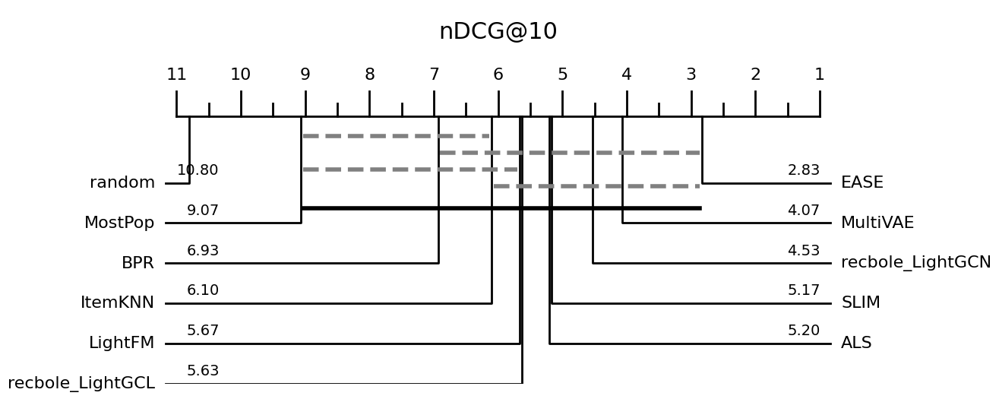

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

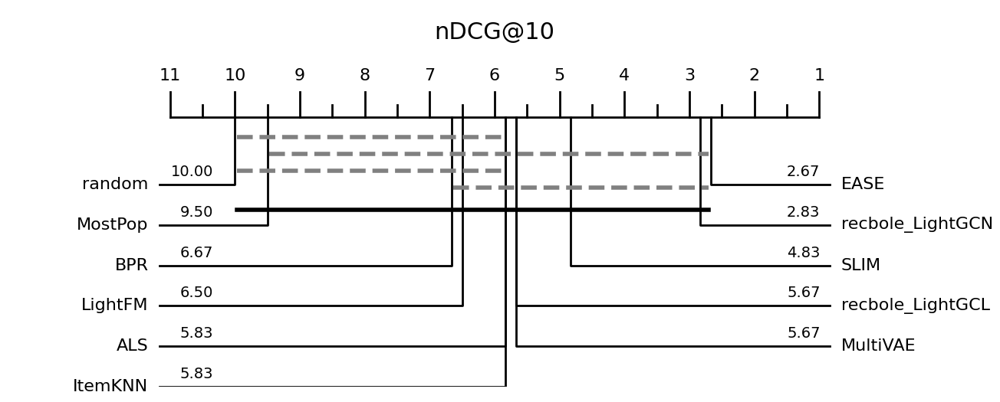

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

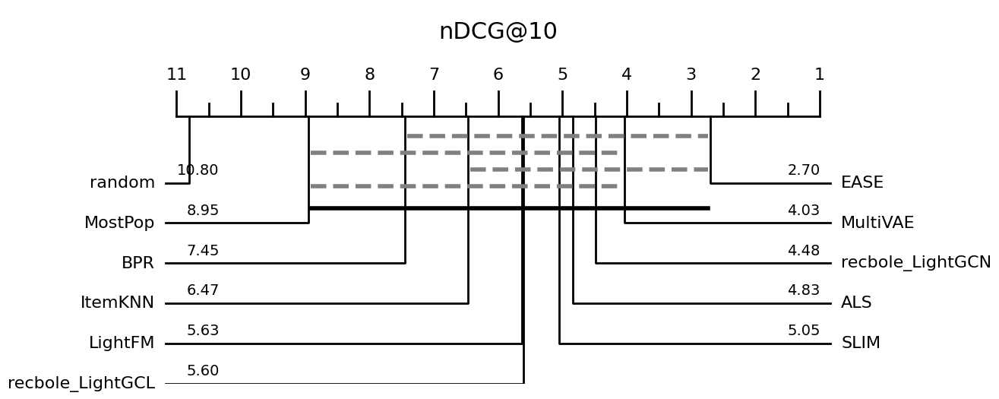

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

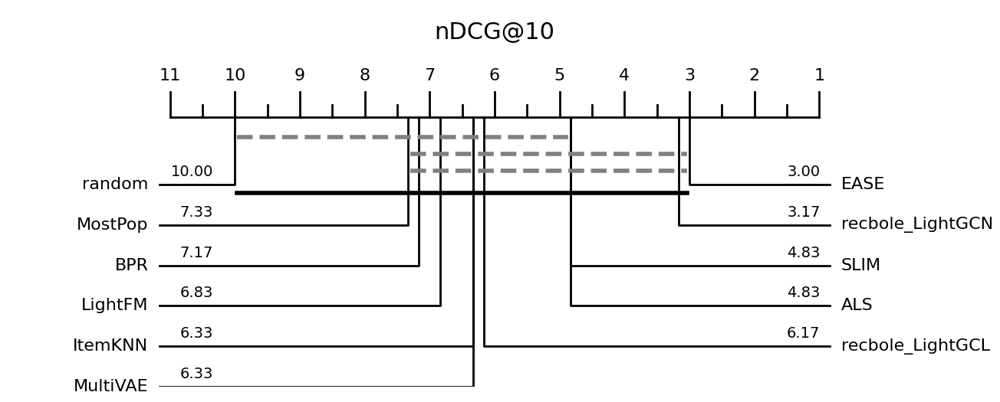

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

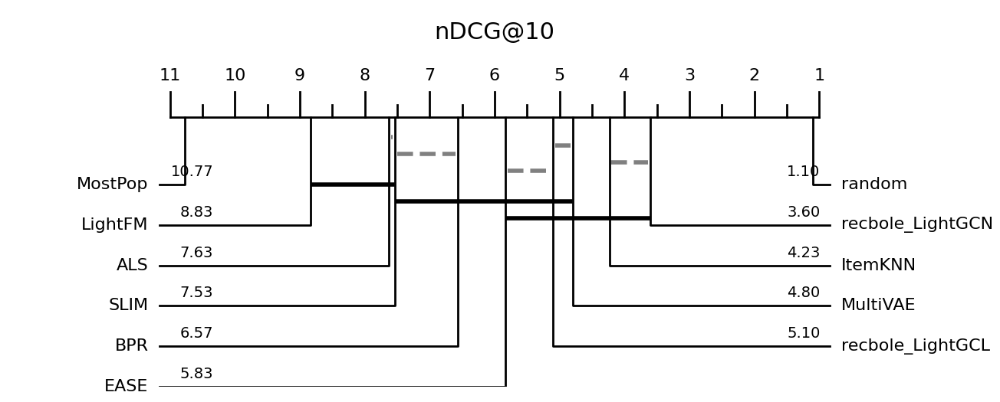

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

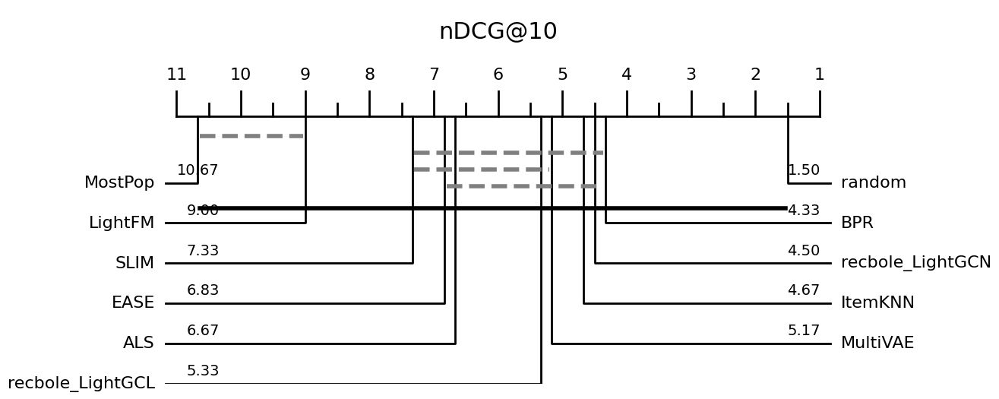

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

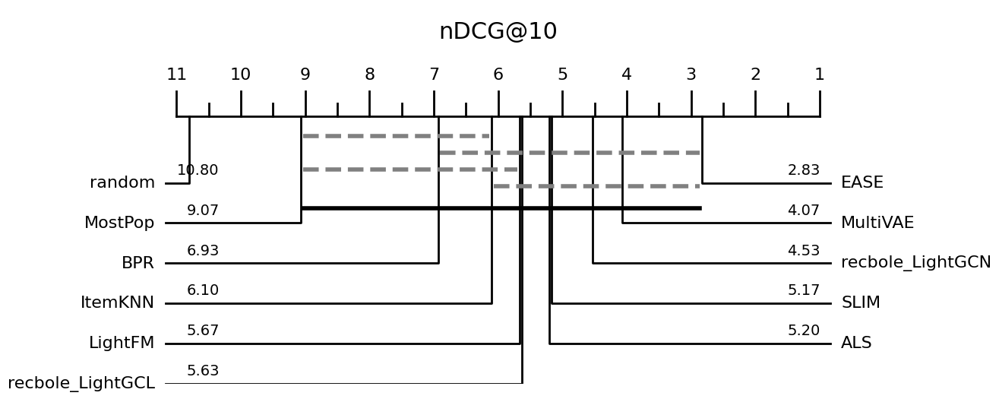

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

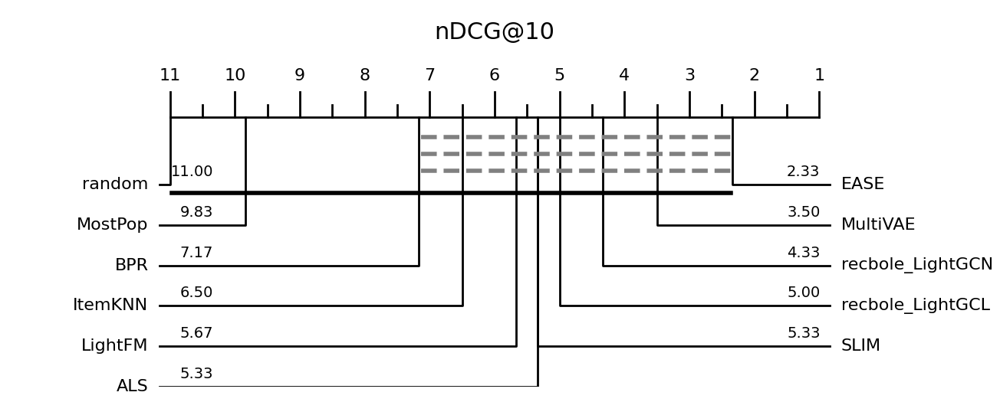

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

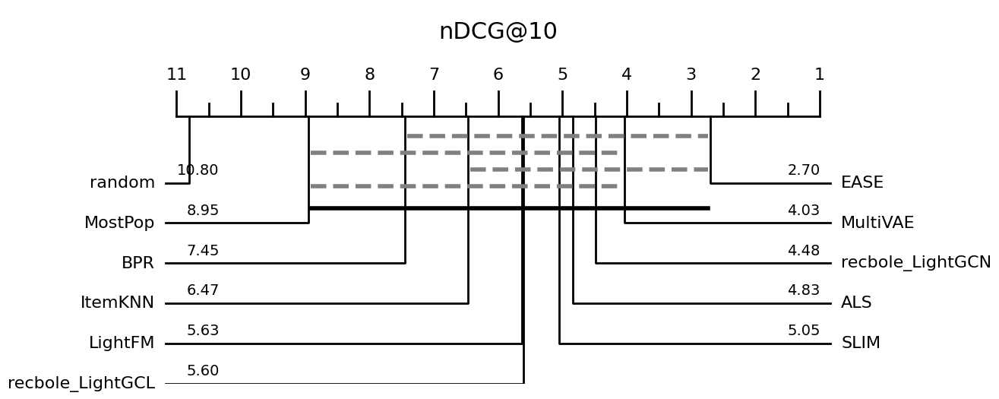

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

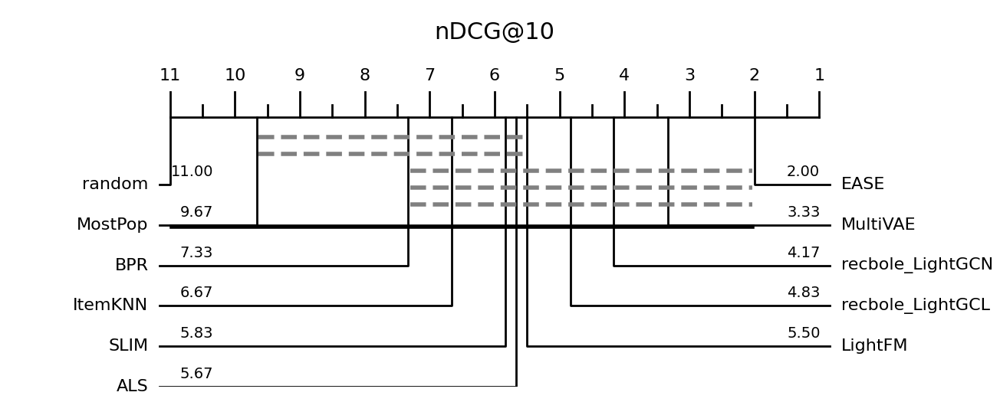

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

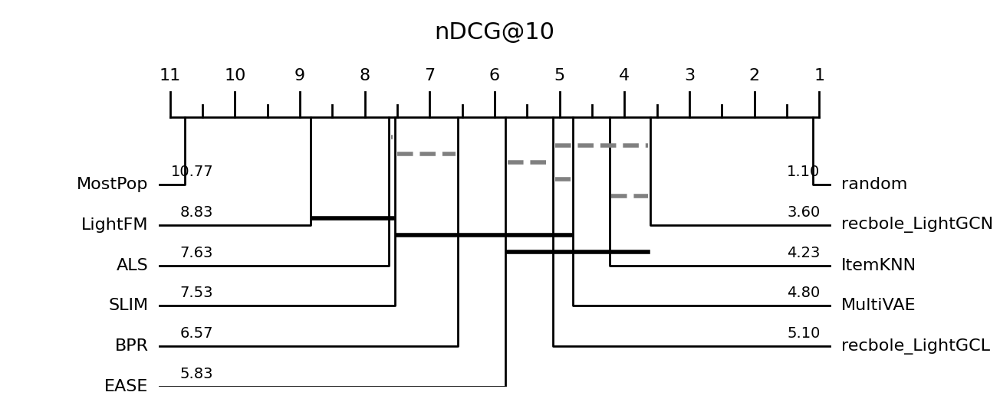

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

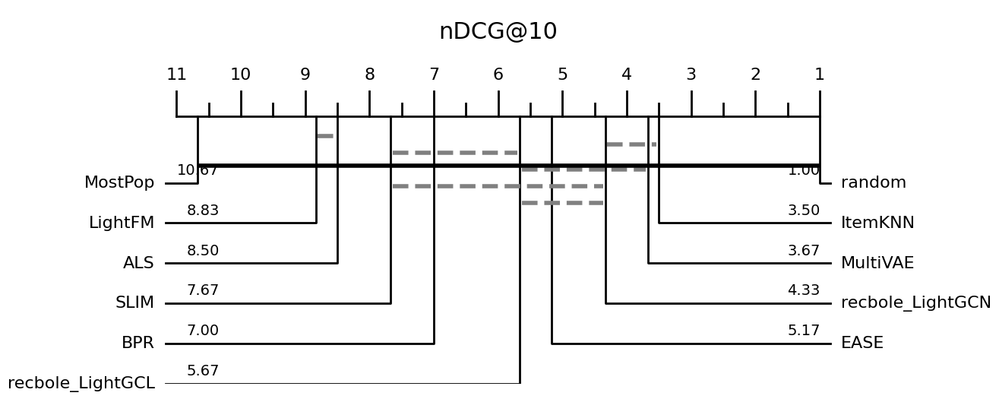

In [36]:
random_score_list = []
a = get_random_indices(df_data.shape[0], k_datasets, seed=0, sampling=200)
for x in tqdm(a):
    random_datasets = df_data.reset_index(names="dataset").loc[list(x)]['dataset']
    random_score_list.append([*get_all_score(random_datasets, ndcg_res, hitrate_res, coverage_res, "ndcg", 10, methods)])

## KMeans

In [19]:
# Clustering using KMeans
n_clusters = 4
for rs in range(10):

    umap_reducer = umap.UMAP(n_neighbors=3, min_dist=0.1, random_state=rs)
    umap_results = umap_reducer.fit_transform(df_data.reset_index(names="dataset", drop=True))
    kmeans = KMeans(n_clusters=n_clusters, random_state=rs)
    kmeans_labels = kmeans.fit_predict(umap_results)
    clustered_datasets = {}
    for cluster_num in range(n_clusters):
        indexes = np.where(kmeans_labels == cluster_num)[0]
        clustered_datasets[f"Cluster {cluster_num + 1}"] = df_data.index[indexes].tolist()
        
    for cluster, datasets in clustered_datasets.items():
        print(f"{cluster}:")
        print(f"number of datasets: {len(datasets)}")
        print(datasets)
    print('#' * 100)
    
    closest, _ = pairwise_distances_argmin_min(kmeans.cluster_centers_, umap_results)
    print(df_data.index[closest].tolist())

Cluster 1:
number of datasets: 9
['movielens_1m', 'movielens_20m', 'beeradvocate', 'netflix', 'movielens_10m', 'kuairec_small', 'douban_movies', 'ratebeer', 'foursquare']
Cluster 2:
number of datasets: 8
['amazon_mi', 'douban_music', 'food', 'amazon_tv', 'tafeng', 'brightkite', 'mts_library', 'douban_books']
Cluster 3:
number of datasets: 7
['rekko', 'dianping', 'reddit', 'amazon_finefoods', 'kuairec_full', 'retail', 'epinions']
Cluster 4:
number of datasets: 6
['amazon_cds', 'yelp', 'goodreads', 'gowalla', 'sber_zvuk', 'sber_smm']
####################################################################################################
['movielens_1m', 'douban_books', 'dianping', 'yelp']
Cluster 1:
number of datasets: 10
['movielens_1m', 'movielens_20m', 'beeradvocate', 'netflix', 'kuairec_full', 'movielens_10m', 'kuairec_small', 'douban_movies', 'ratebeer', 'foursquare']
Cluster 2:
number of datasets: 8
['rekko', 'dianping', 'reddit', 'amazon_finefoods', 'brightkite', 'retail', 'mts_librar

In [ ]:
n_clusters = 4 #k_datasets
kmeans_score_list = []
for rs in range(10):

    kmeans = KMeans(n_clusters=n_clusters, random_state=rs)
    kmeans_labels = kmeans.fit_predict(umap_results)
    
    closest, _ = pairwise_distances_argmin_min(kmeans.cluster_centers_, umap_results)
    kmeans_score_list.append([*get_all_score(df_data.index[closest].tolist(), ndcg_res, hitrate_res, coverage_res, "ndcg", 10, methods)])

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

In [40]:
# Used found clusters
kmeans_data = ['amazon_cds', 'rekko', 'movielens_20m', 'tafeng', 'foursquare', 'sber_zvuk']

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

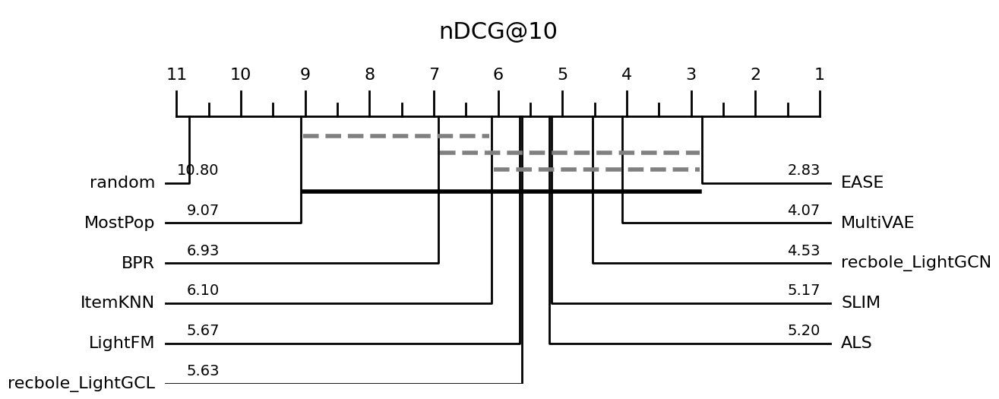

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

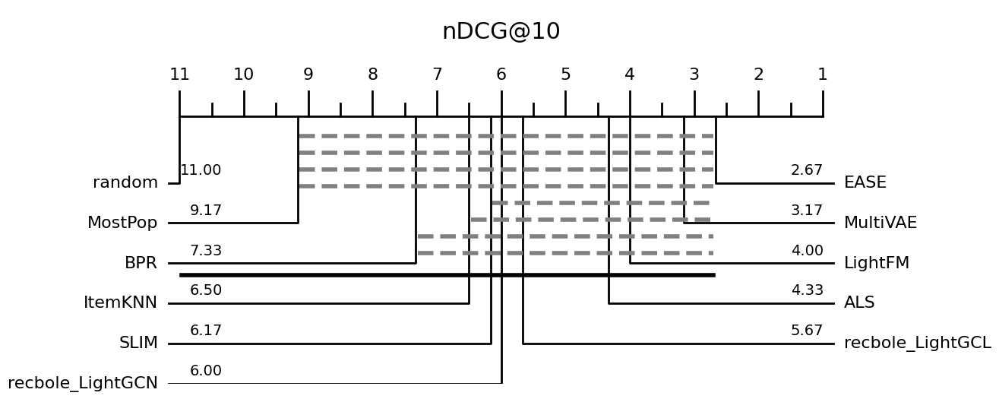

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

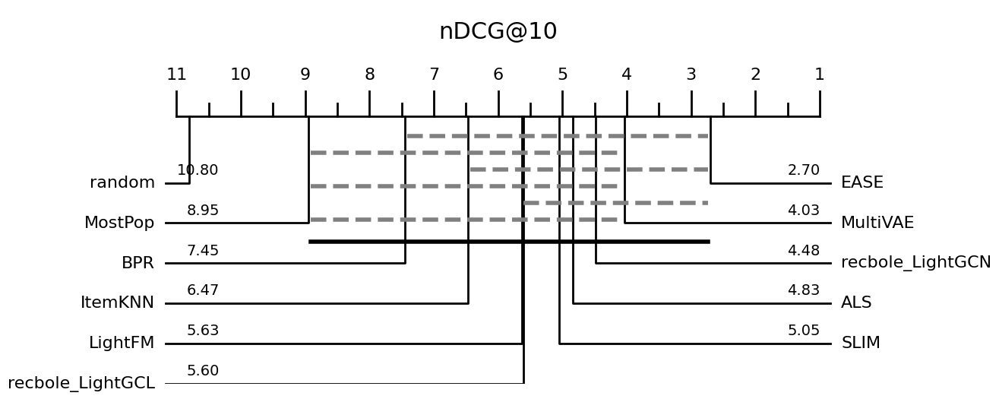

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

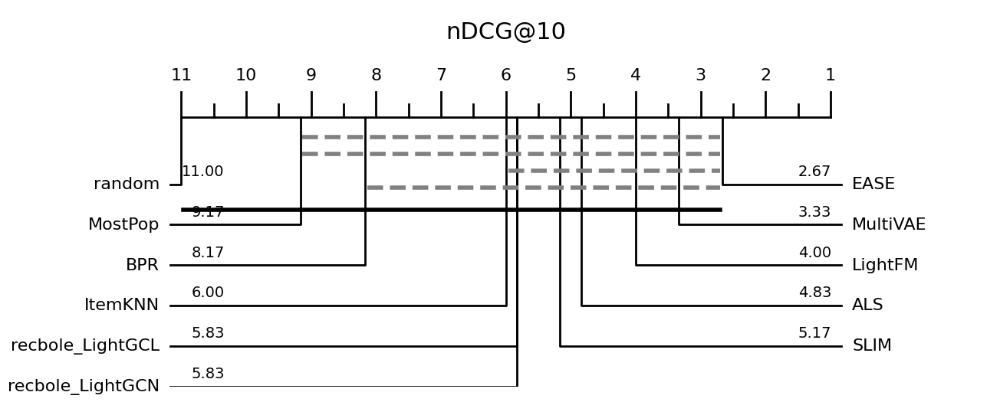

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

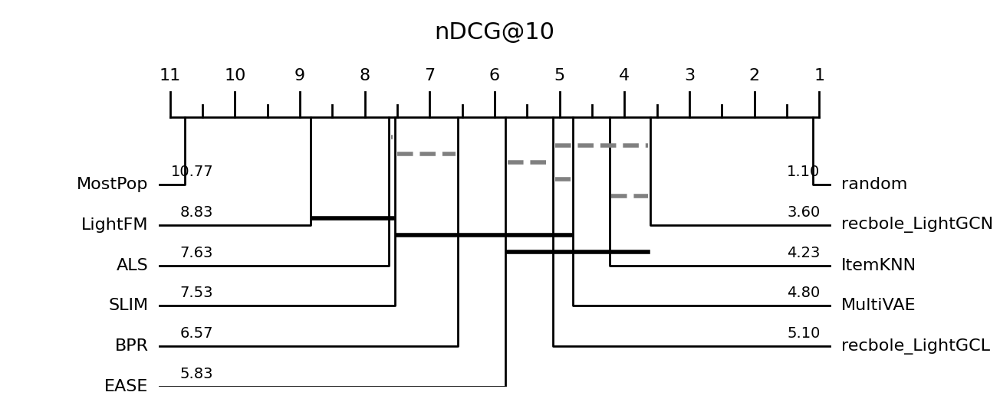

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

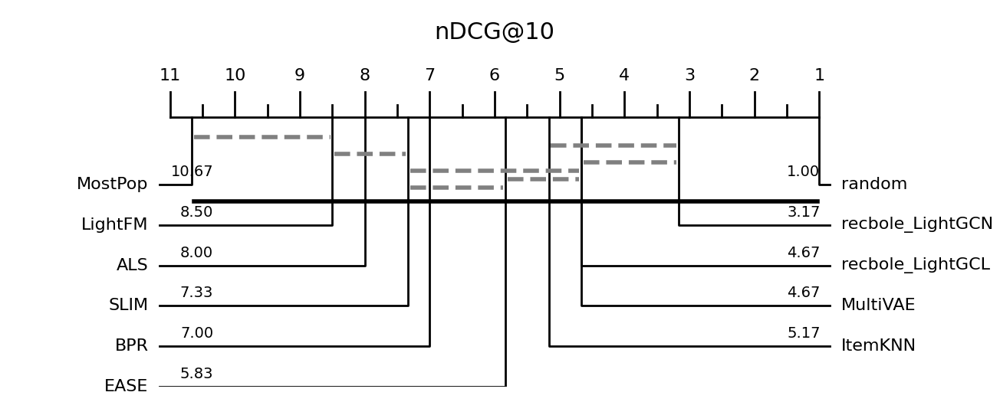

In [41]:
kmeans_score_list = []
kmeans_score_list.append([*get_all_score(kmeans_data, ndcg_res, hitrate_res, coverage_res, "ndcg", 10, methods)])

## D optimal

In [51]:
from copy import deepcopy
def run_d_optimal(data: pd.DataFrame, k_size: int, n_max: int = 1000, seed: int = 42, alpha: float = 0.0001, slog: bool = False, sampling: int = 1,) -> tuple[List[int], float]:
    """Run A optimal optimization.

    Args:
        data (pd.DataFrame): Aggregated metrics dataframe.
        k_size (int): Number of datasets to select.
        n_max (int): Maximum number of iterations.
        seed (int): Seed param.
        alpha (float): Regularization coeff.
    Returns:
        tuple[List[int], float]: - List of selected datasets indices.
                                 - Best D optimal score.
    """
    # freeze seed
    np.random.seed(seed)
    # get start point
    start_indices = get_random_indices(data.shape[0], k_size, seed=seed, sampling=sampling)[0]
    data_start = data[list(start_indices)]
    cur_best_score = get_d_optimal_value(data_start, slog = slog,)

    k = 0
    cur_best_indices = deepcopy(start_indices)
    for i in range(k_size):

        for j in range(data.shape[0]):
            k += 1
            if j not in cur_best_indices:
                tmp_indices = deepcopy(cur_best_indices)
                tmp_indices[i] = j
                if cur_best_score < get_d_optimal_value(data[tmp_indices], slog = slog,):
                    cur_best_score = get_d_optimal_value(data[tmp_indices], slog = slog,)
                    cur_best_indices = deepcopy(tmp_indices)
            if k == n_max:
                print("Maximum no. of iterations has exceeded")
                return cur_best_indices, cur_best_score

    return cur_best_indices, cur_best_score


  0%|                                                                                                                                    | 0/100 [00:00<?, ?it/s]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


  1%|█▏                                                                                                                          | 1/100 [00:05<08:57,  5.43s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


  2%|██▍                                                                                                                         | 2/100 [00:10<08:57,  5.48s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


  3%|███▋                                                                                                                        | 3/100 [00:16<08:53,  5.50s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


  4%|████▉                                                                                                                       | 4/100 [00:21<08:47,  5.50s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


  5%|██████▏                                                                                                                     | 5/100 [00:27<08:40,  5.48s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


  6%|███████▍                                                                                                                    | 6/100 [00:33<08:49,  5.63s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


  7%|████████▋                                                                                                                   | 7/100 [00:38<08:39,  5.59s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


  8%|█████████▉                                                                                                                  | 8/100 [00:44<08:30,  5.55s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


  9%|███████████▏                                                                                                                | 9/100 [00:49<08:22,  5.52s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 10%|████████████▎                                                                                                              | 10/100 [00:55<08:15,  5.51s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 11%|█████████████▌                                                                                                             | 11/100 [01:00<08:09,  5.50s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 12%|██████████████▊                                                                                                            | 12/100 [01:06<08:03,  5.50s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 13%|███████████████▉                                                                                                           | 13/100 [01:12<08:14,  5.68s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 14%|█████████████████▏                                                                                                         | 14/100 [01:17<08:04,  5.63s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 15%|██████████████████▍                                                                                                        | 15/100 [01:23<07:56,  5.61s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 16%|███████████████████▋                                                                                                       | 16/100 [01:28<07:48,  5.58s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 17%|████████████████████▉                                                                                                      | 17/100 [01:34<07:40,  5.55s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 18%|██████████████████████▏                                                                                                    | 18/100 [01:39<07:33,  5.53s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 19%|███████████████████████▎                                                                                                   | 19/100 [01:45<07:26,  5.51s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 20%|████████████████████████▌                                                                                                  | 20/100 [01:50<07:19,  5.49s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 21%|█████████████████████████▊                                                                                                 | 21/100 [01:56<07:12,  5.47s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 22%|███████████████████████████                                                                                                | 22/100 [02:02<07:21,  5.66s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 23%|████████████████████████████▎                                                                                              | 23/100 [02:07<07:10,  5.59s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 24%|█████████████████████████████▌                                                                                             | 24/100 [02:13<07:00,  5.54s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 25%|██████████████████████████████▊                                                                                            | 25/100 [02:18<06:53,  5.51s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 26%|███████████████████████████████▉                                                                                           | 26/100 [02:23<06:45,  5.48s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 27%|█████████████████████████████████▏                                                                                         | 27/100 [02:29<06:38,  5.46s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 28%|██████████████████████████████████▍                                                                                        | 28/100 [02:34<06:32,  5.45s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 29%|███████████████████████████████████▋                                                                                       | 29/100 [02:40<06:27,  5.45s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 30%|████████████████████████████████████▉                                                                                      | 30/100 [02:45<06:21,  5.45s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 31%|██████████████████████████████████████▏                                                                                    | 31/100 [02:51<06:15,  5.45s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 32%|███████████████████████████████████████▎                                                                                   | 32/100 [02:56<06:09,  5.44s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 33%|████████████████████████████████████████▌                                                                                  | 33/100 [03:02<06:21,  5.69s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 34%|█████████████████████████████████████████▊                                                                                 | 34/100 [03:08<06:10,  5.61s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 35%|███████████████████████████████████████████                                                                                | 35/100 [03:13<06:01,  5.57s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 36%|████████████████████████████████████████████▎                                                                              | 36/100 [03:19<05:53,  5.53s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 37%|█████████████████████████████████████████████▌                                                                             | 37/100 [03:24<05:46,  5.51s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 38%|██████████████████████████████████████████████▋                                                                            | 38/100 [03:30<05:40,  5.50s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 39%|███████████████████████████████████████████████▉                                                                           | 39/100 [03:35<05:35,  5.49s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 40%|█████████████████████████████████████████████████▏                                                                         | 40/100 [03:41<05:28,  5.48s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 41%|██████████████████████████████████████████████████▍                                                                        | 41/100 [03:46<05:22,  5.47s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 42%|███████████████████████████████████████████████████▋                                                                       | 42/100 [03:51<05:16,  5.46s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 43%|████████████████████████████████████████████████████▉                                                                      | 43/100 [03:57<05:11,  5.46s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 44%|██████████████████████████████████████████████████████                                                                     | 44/100 [04:02<05:05,  5.46s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 45%|███████████████████████████████████████████████████████▎                                                                   | 45/100 [04:08<05:02,  5.49s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 46%|████████████████████████████████████████████████████████▌                                                                  | 46/100 [04:13<04:56,  5.49s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 47%|█████████████████████████████████████████████████████████▊                                                                 | 47/100 [04:20<05:08,  5.82s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 48%|███████████████████████████████████████████████████████████                                                                | 48/100 [04:26<04:57,  5.72s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 49%|████████████████████████████████████████████████████████████▎                                                              | 49/100 [04:31<04:48,  5.66s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 50%|█████████████████████████████████████████████████████████████▌                                                             | 50/100 [04:37<04:40,  5.61s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 51%|██████████████████████████████████████████████████████████████▋                                                            | 51/100 [04:42<04:33,  5.58s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 52%|███████████████████████████████████████████████████████████████▉                                                           | 52/100 [04:48<04:26,  5.55s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 53%|█████████████████████████████████████████████████████████████████▏                                                         | 53/100 [04:53<04:19,  5.53s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 54%|██████████████████████████████████████████████████████████████████▍                                                        | 54/100 [04:58<04:13,  5.52s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 55%|███████████████████████████████████████████████████████████████████▋                                                       | 55/100 [05:04<04:08,  5.52s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 56%|████████████████████████████████████████████████████████████████████▉                                                      | 56/100 [05:10<04:02,  5.52s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 57%|██████████████████████████████████████████████████████████████████████                                                     | 57/100 [05:15<03:56,  5.51s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 58%|███████████████████████████████████████████████████████████████████████▎                                                   | 58/100 [05:21<03:51,  5.50s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 59%|████████████████████████████████████████████████████████████████████████▌                                                  | 59/100 [05:26<03:45,  5.49s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 60%|█████████████████████████████████████████████████████████████████████████▊                                                 | 60/100 [05:31<03:39,  5.49s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 61%|███████████████████████████████████████████████████████████████████████████                                                | 61/100 [05:37<03:34,  5.50s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 62%|████████████████████████████████████████████████████████████████████████████▎                                              | 62/100 [05:42<03:29,  5.50s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 63%|█████████████████████████████████████████████████████████████████████████████▍                                             | 63/100 [05:48<03:23,  5.51s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 64%|██████████████████████████████████████████████████████████████████████████████▋                                            | 64/100 [05:55<03:33,  5.92s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 65%|███████████████████████████████████████████████████████████████████████████████▉                                           | 65/100 [06:00<03:23,  5.81s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 66%|█████████████████████████████████████████████████████████████████████████████████▏                                         | 66/100 [06:06<03:14,  5.72s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 67%|██████████████████████████████████████████████████████████████████████████████████▍                                        | 67/100 [06:11<03:06,  5.66s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 68%|███████████████████████████████████████████████████████████████████████████████████▋                                       | 68/100 [06:17<02:59,  5.61s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 69%|████████████████████████████████████████████████████████████████████████████████████▊                                      | 69/100 [06:23<02:53,  5.59s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 70%|██████████████████████████████████████████████████████████████████████████████████████                                     | 70/100 [06:28<02:46,  5.56s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 71%|███████████████████████████████████████████████████████████████████████████████████████▎                                   | 71/100 [06:33<02:40,  5.54s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 72%|████████████████████████████████████████████████████████████████████████████████████████▌                                  | 72/100 [06:39<02:34,  5.52s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 73%|█████████████████████████████████████████████████████████████████████████████████████████▊                                 | 73/100 [06:44<02:28,  5.51s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 74%|███████████████████████████████████████████████████████████████████████████████████████████                                | 74/100 [06:50<02:22,  5.50s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 75%|████████████████████████████████████████████████████████████████████████████████████████████▎                              | 75/100 [06:55<02:17,  5.49s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 76%|█████████████████████████████████████████████████████████████████████████████████████████████▍                             | 76/100 [07:01<02:11,  5.48s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 77%|██████████████████████████████████████████████████████████████████████████████████████████████▋                            | 77/100 [07:06<02:06,  5.49s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 78%|███████████████████████████████████████████████████████████████████████████████████████████████▉                           | 78/100 [07:12<02:00,  5.48s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 79%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 79/100 [07:17<01:54,  5.47s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 80%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 80/100 [07:23<01:49,  5.45s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 81%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 81/100 [07:28<01:43,  5.44s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 82%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 82/100 [07:34<01:37,  5.43s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████                     | 83/100 [07:39<01:32,  5.44s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 84/100 [07:44<01:27,  5.45s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 85/100 [07:52<01:29,  5.95s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 86/100 [07:57<01:21,  5.80s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                | 87/100 [08:03<01:14,  5.71s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 88/100 [08:08<01:07,  5.62s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 89/100 [08:13<01:01,  5.55s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 90/100 [08:19<00:55,  5.51s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 91/100 [08:24<00:49,  5.49s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 92/100 [08:30<00:43,  5.47s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 93/100 [08:35<00:38,  5.47s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 94/100 [08:41<00:32,  5.47s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 95/100 [08:46<00:27,  5.48s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 96/100 [08:52<00:21,  5.49s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 97/100 [08:57<00:16,  5.48s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 98/100 [09:02<00:10,  5.48s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 99/100 [09:08<00:05,  5.48s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [09:13<00:00,  5.54s/it]
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Aria

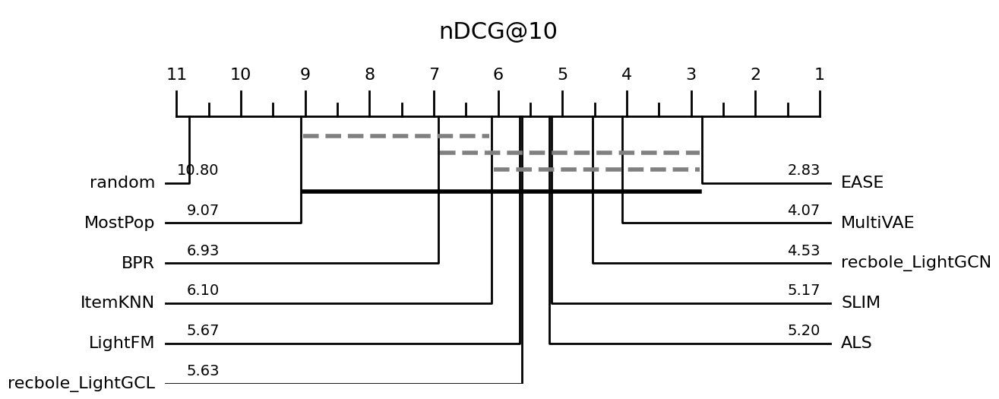

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

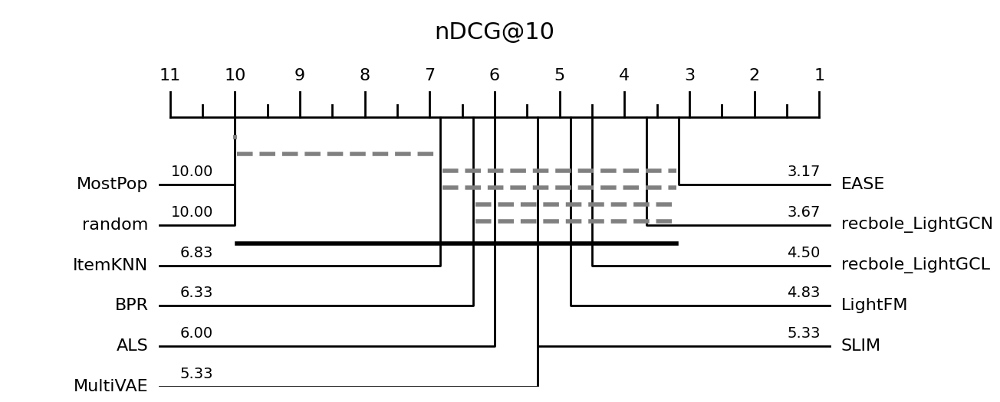

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

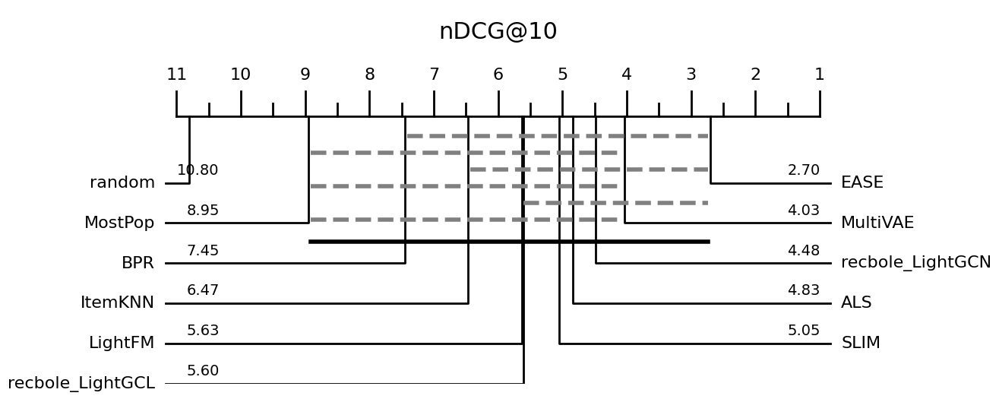

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

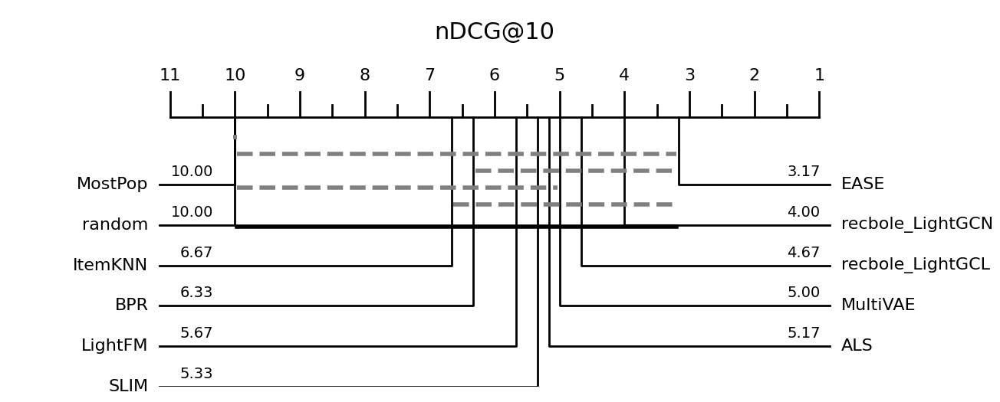

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

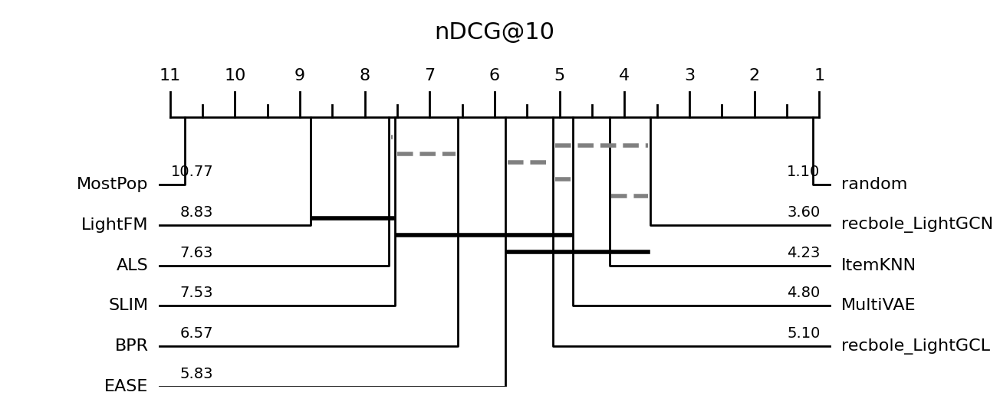

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

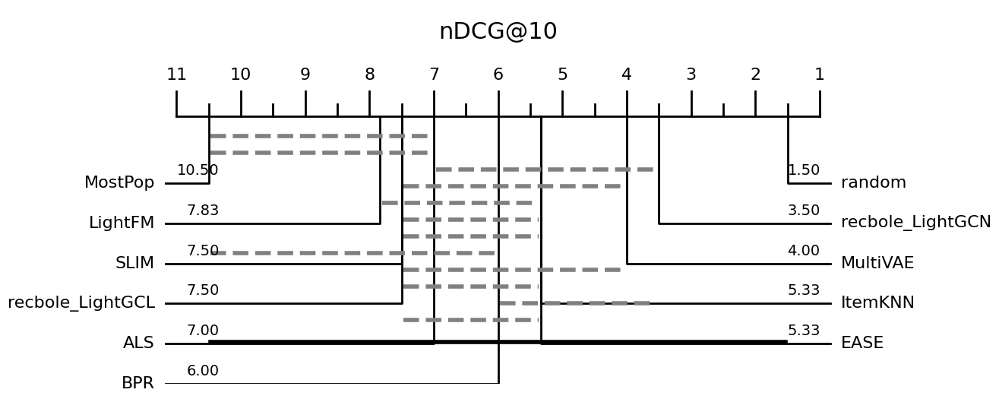

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

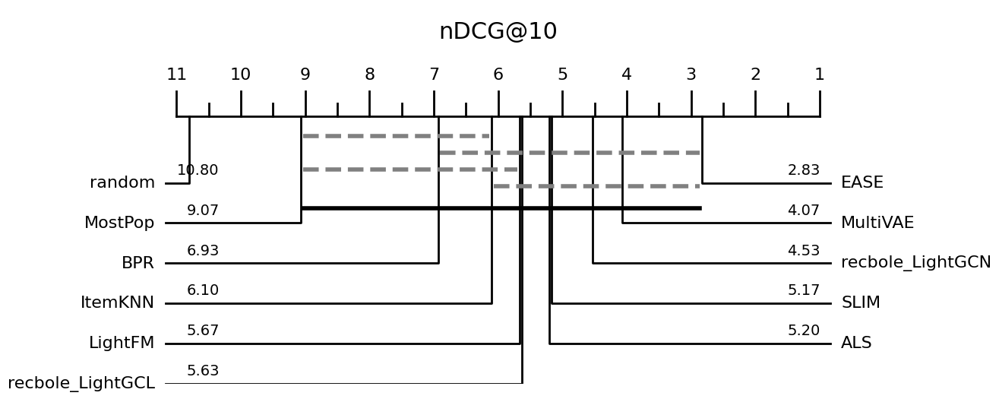

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

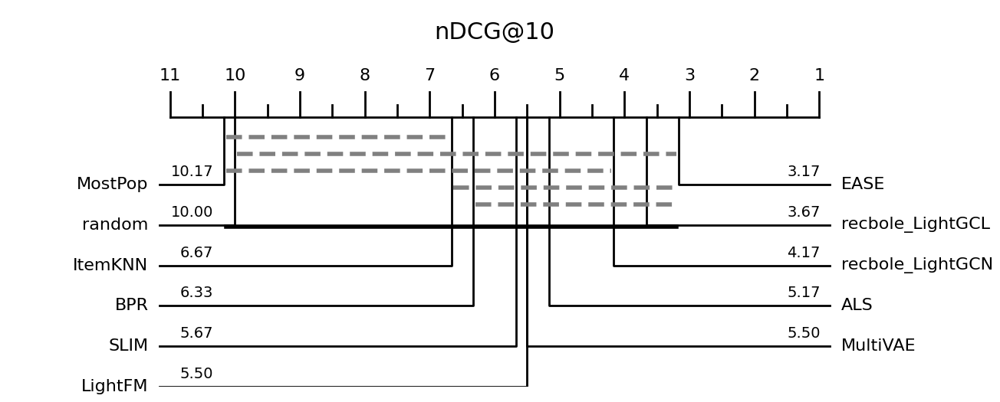

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

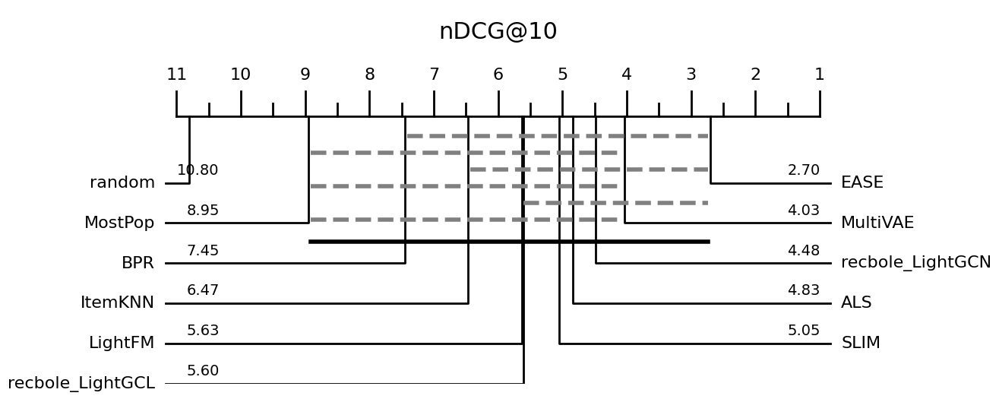

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

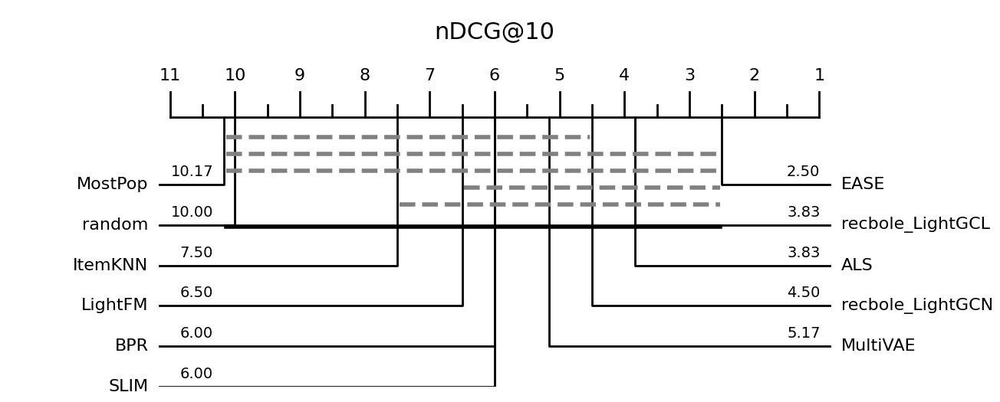

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

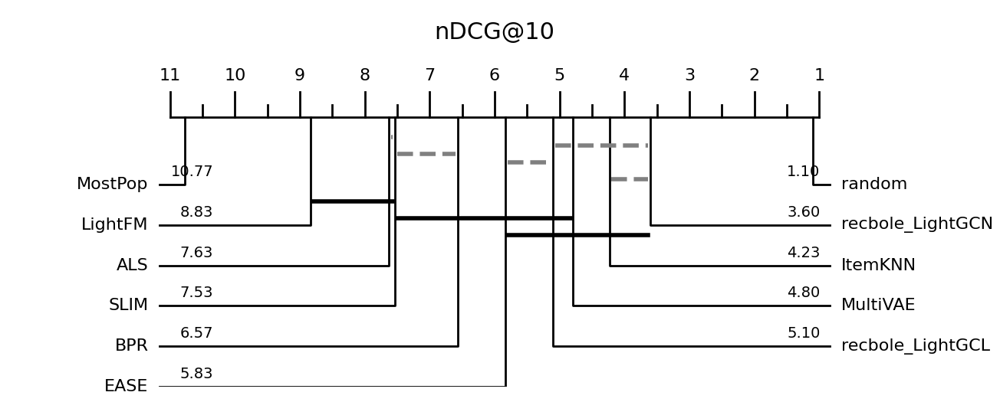

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

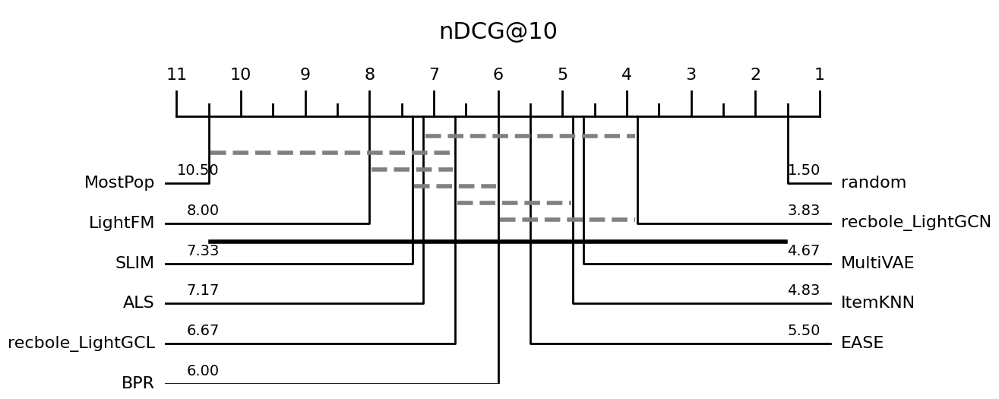

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

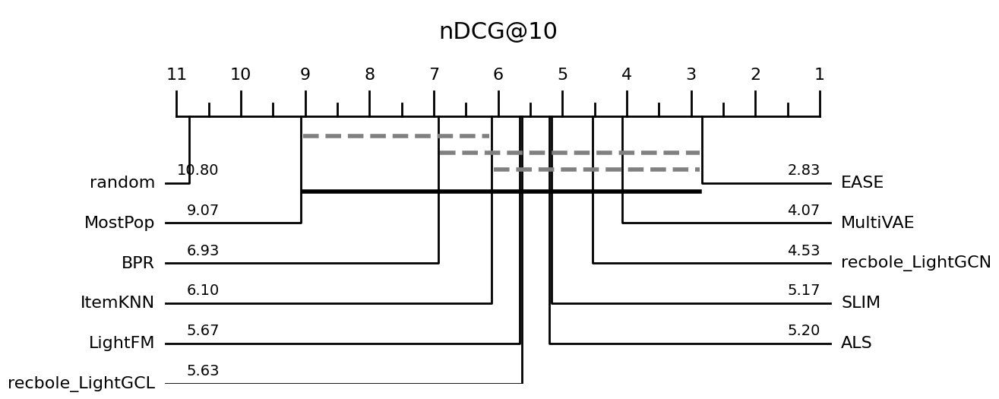

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

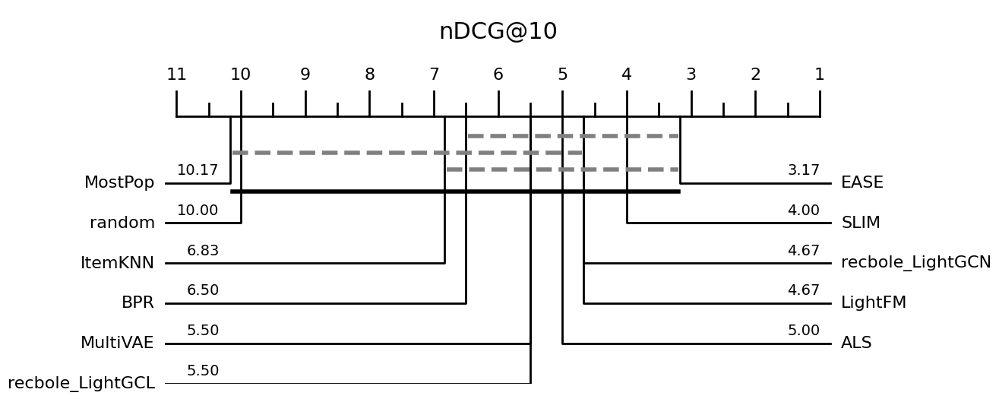

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

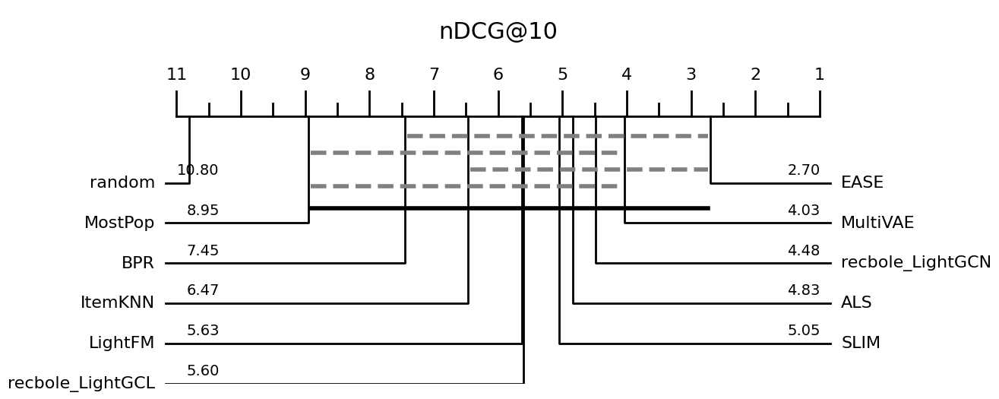

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

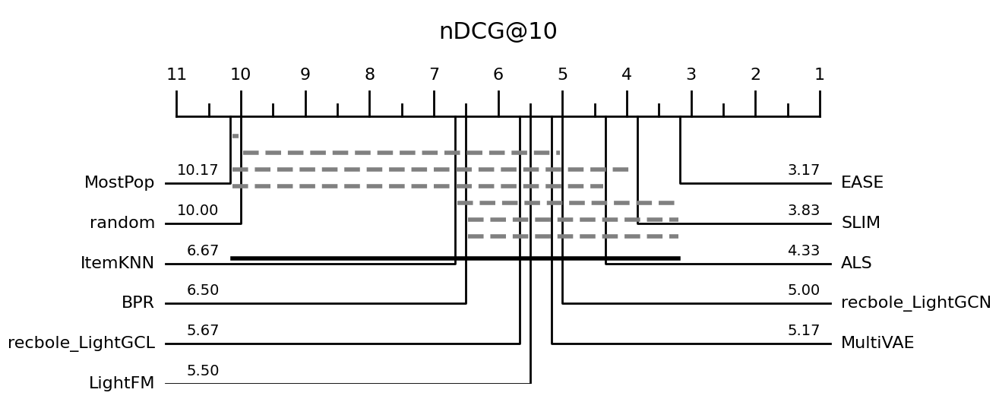

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

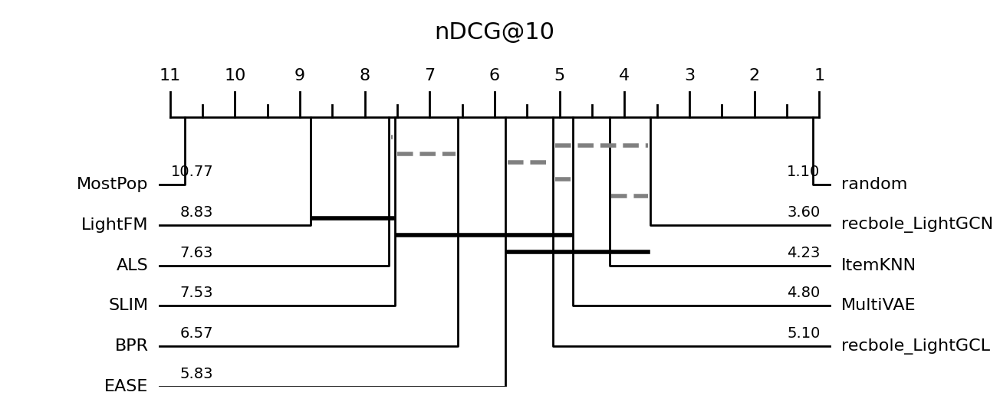

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

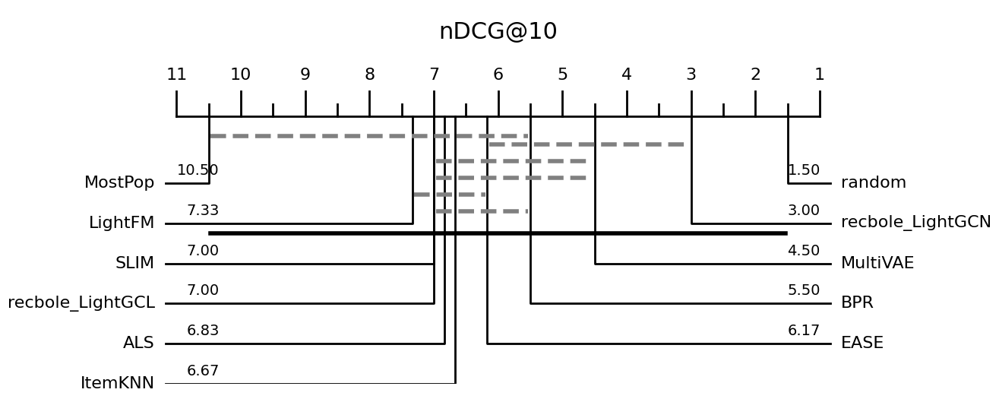

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

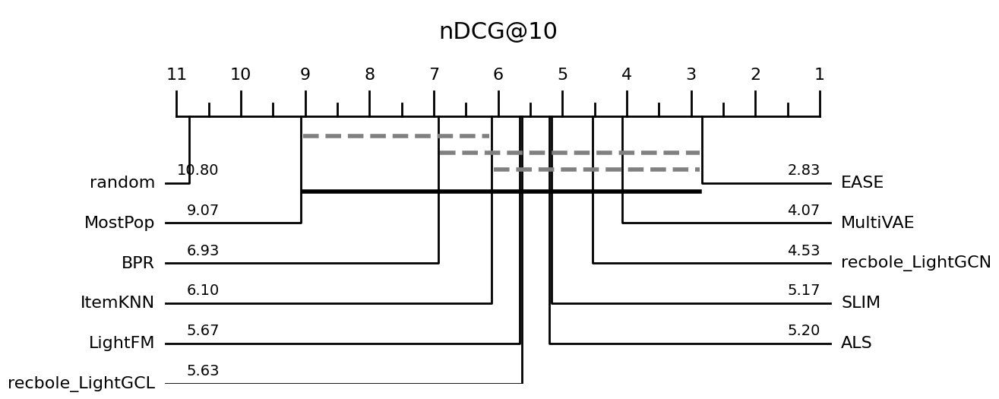

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

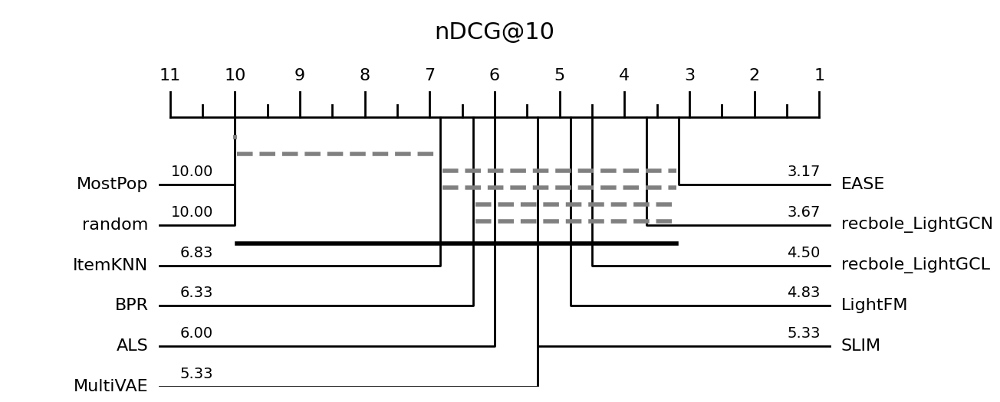

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

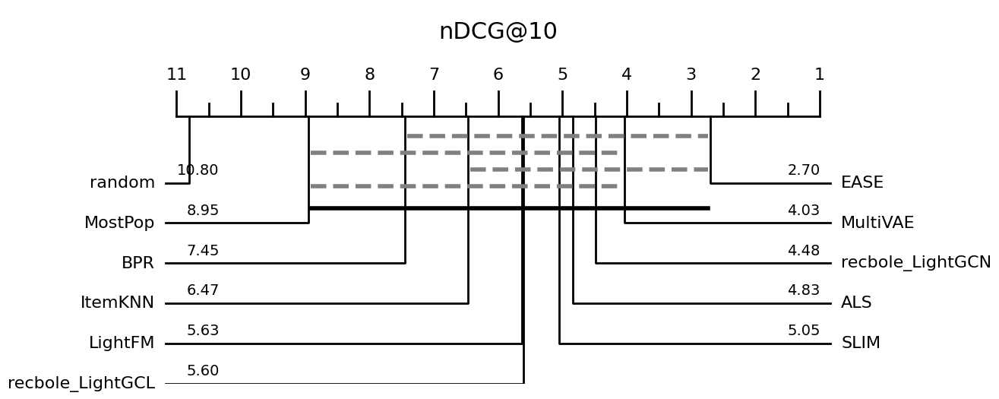

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

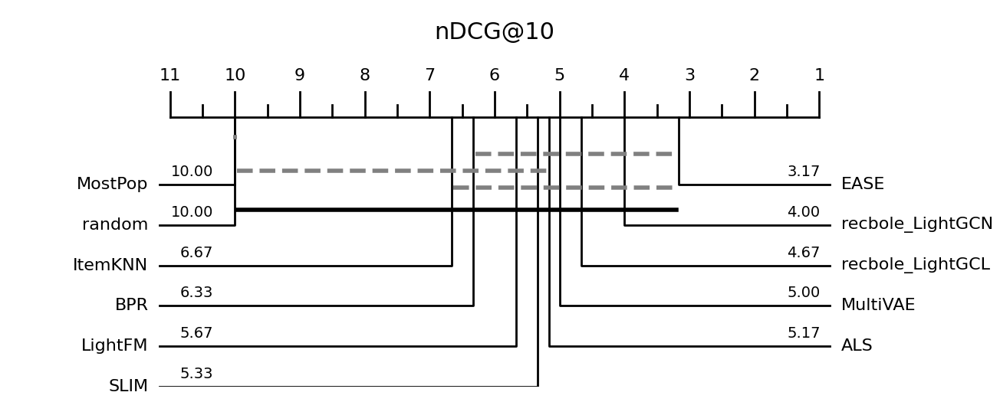

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

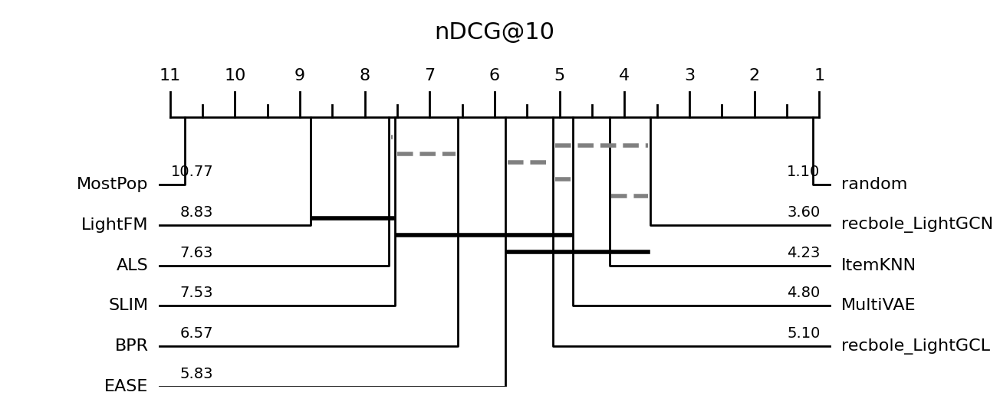

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

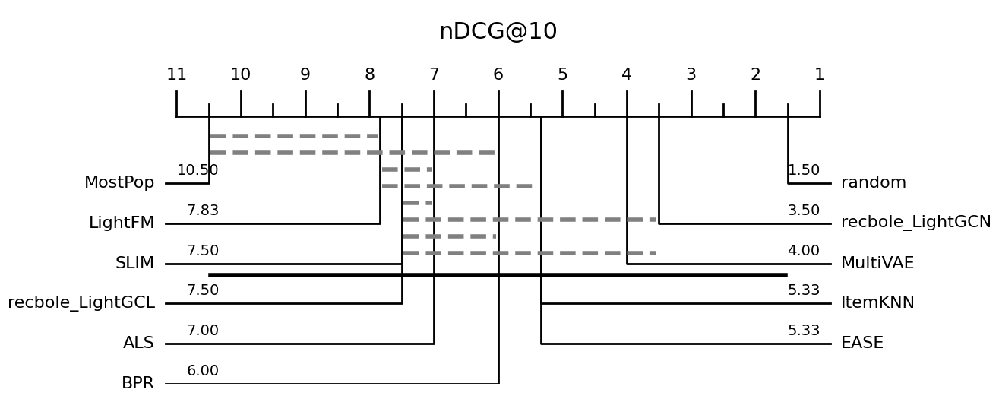

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

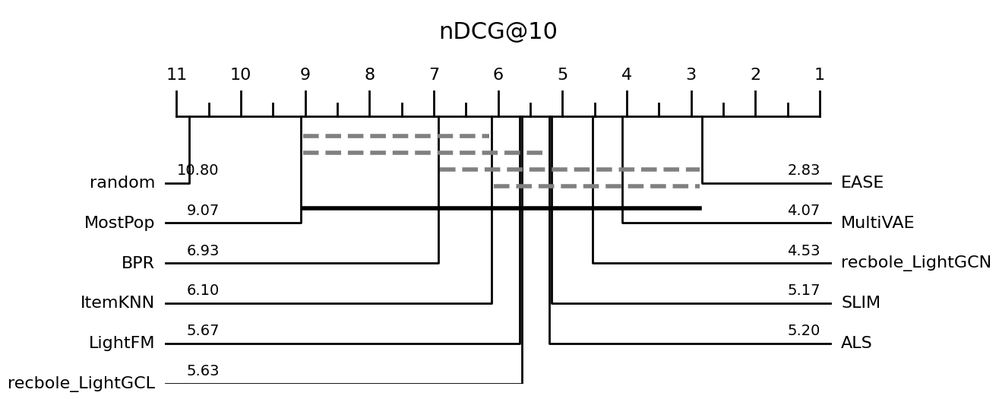

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

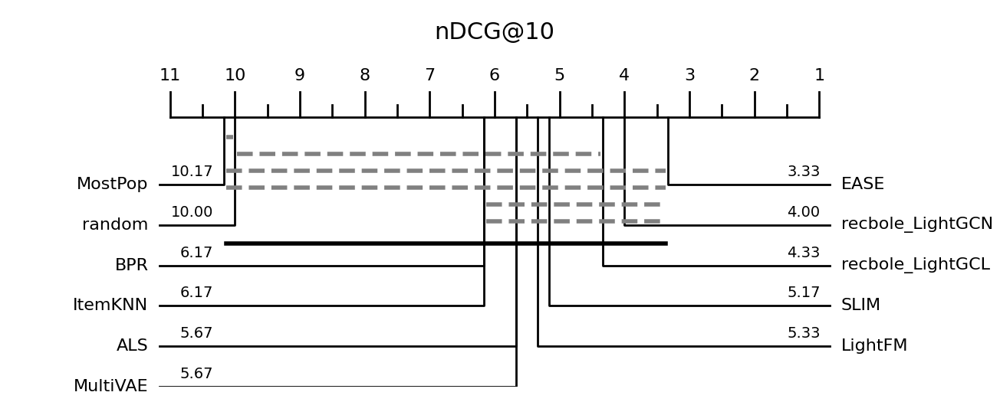

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

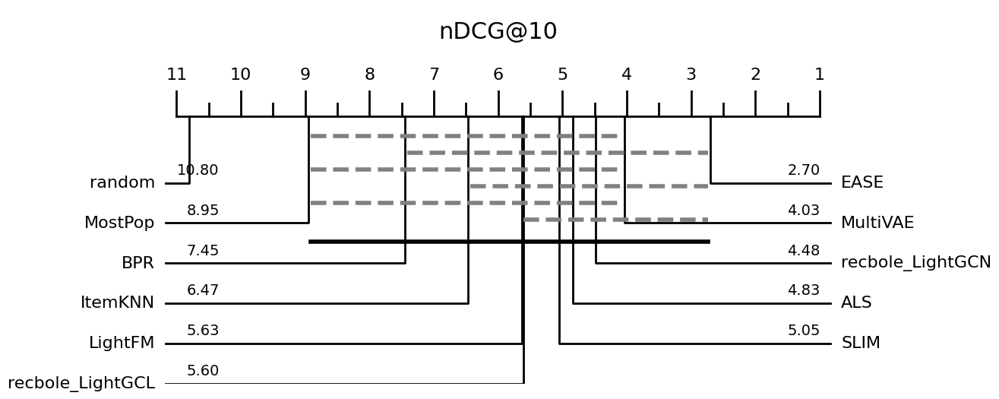

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

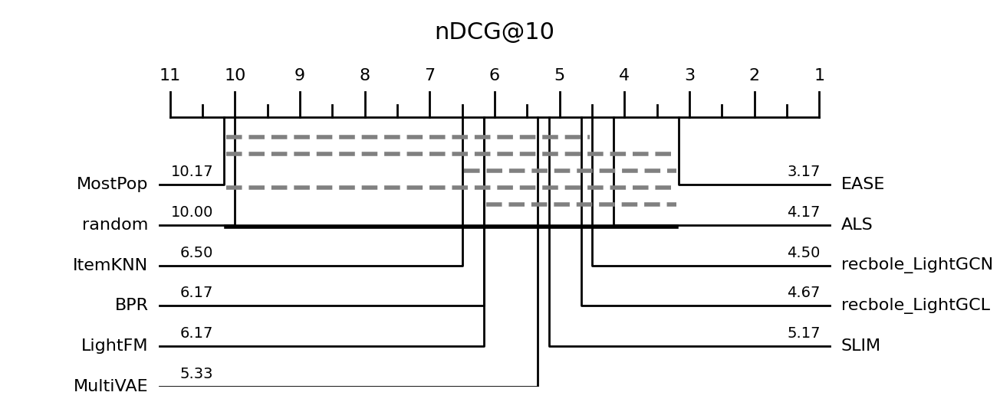

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

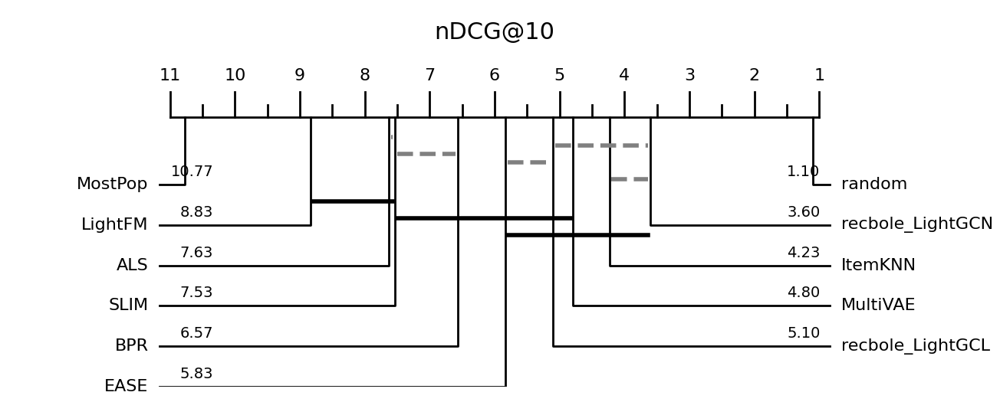

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

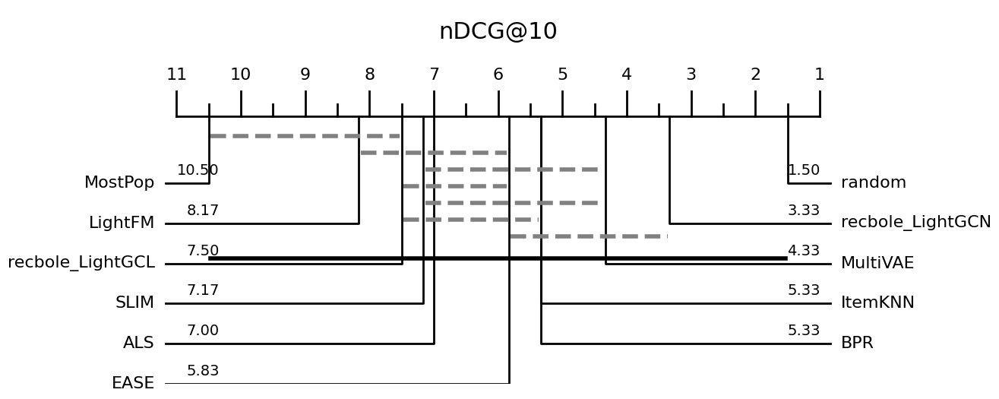

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

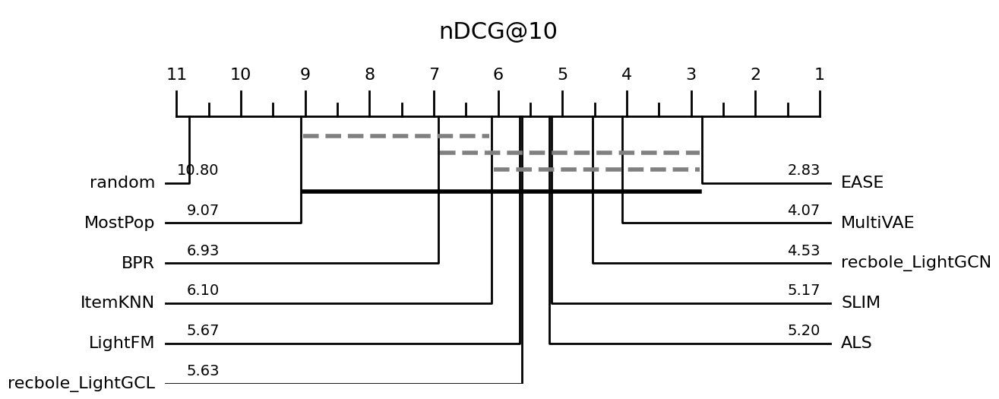

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

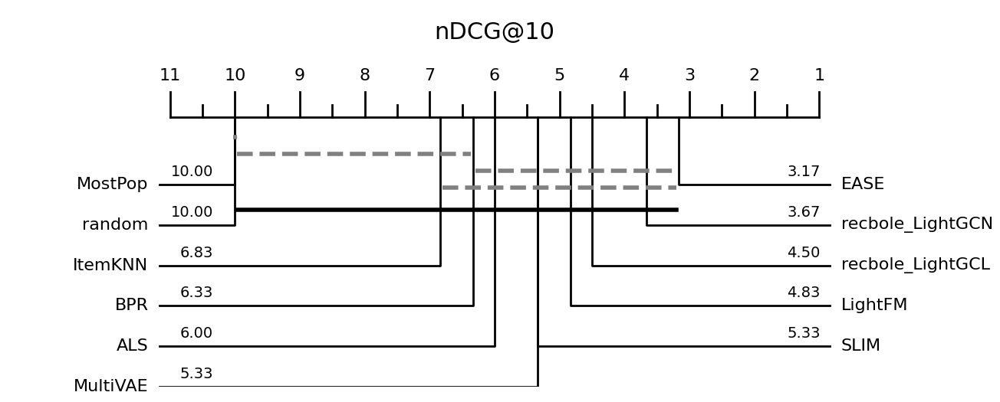

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

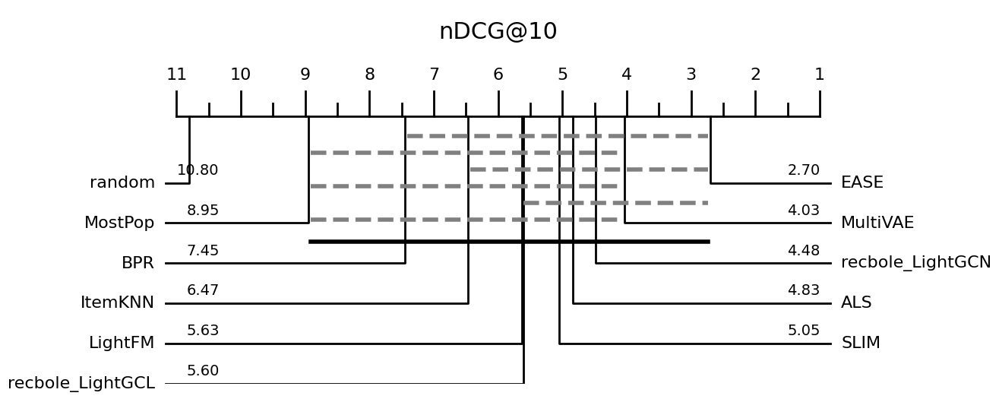

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

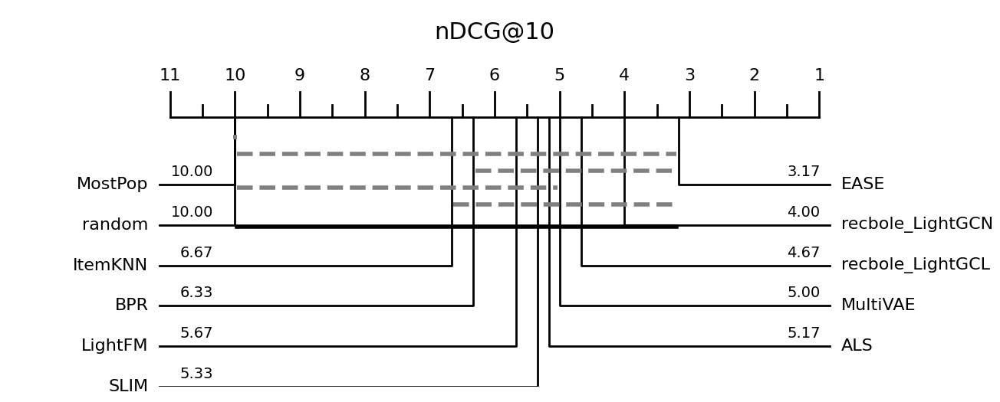

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

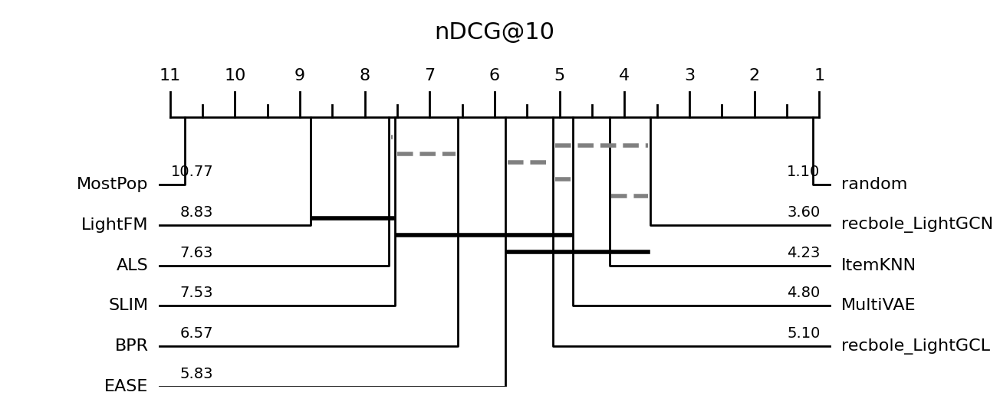

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

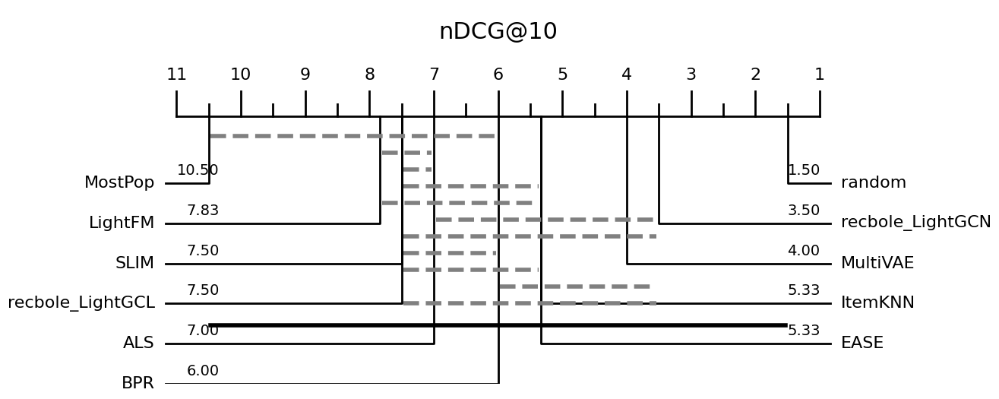

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

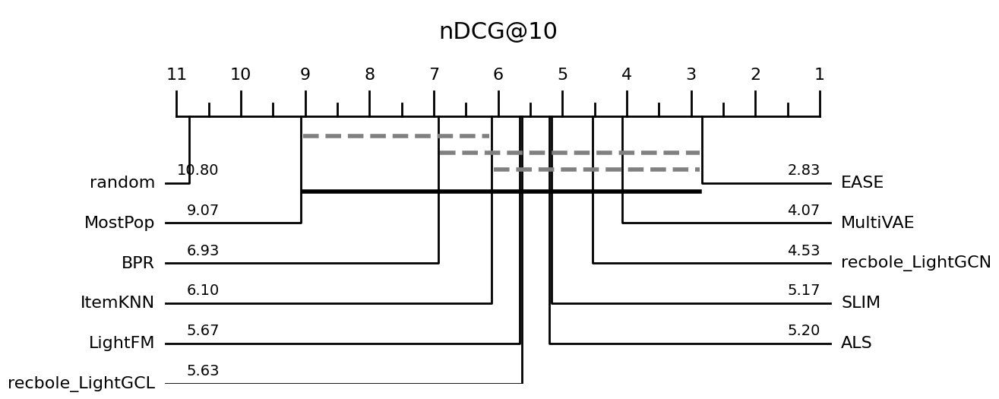

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

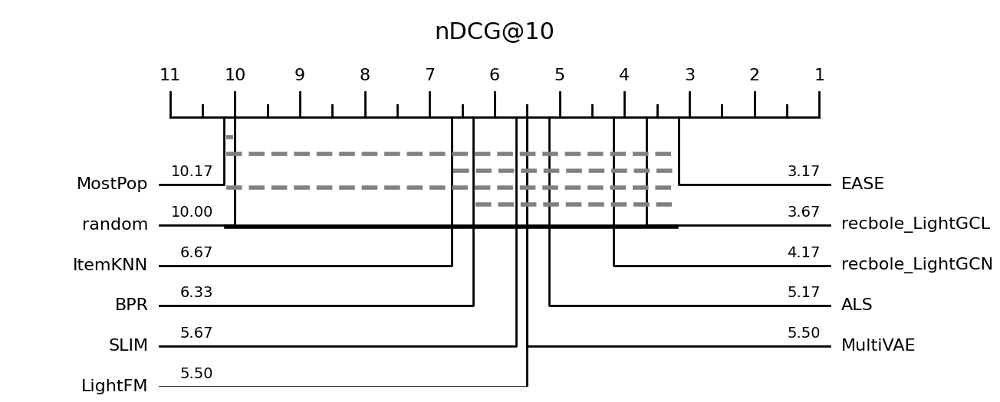

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

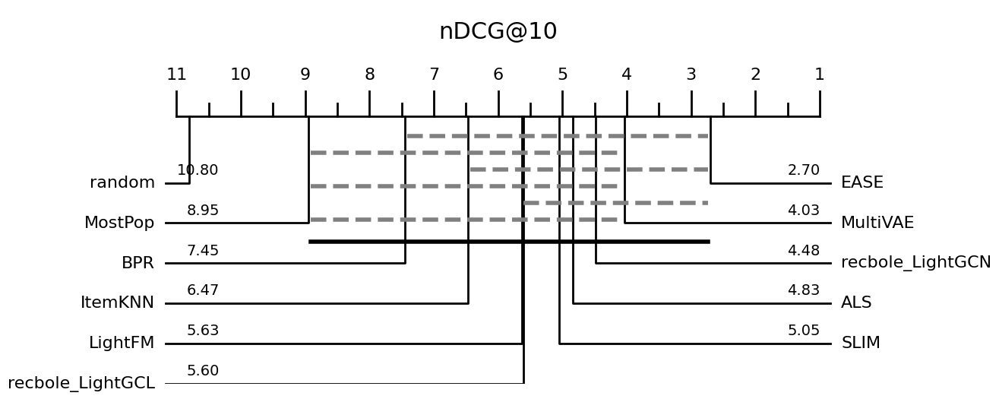

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

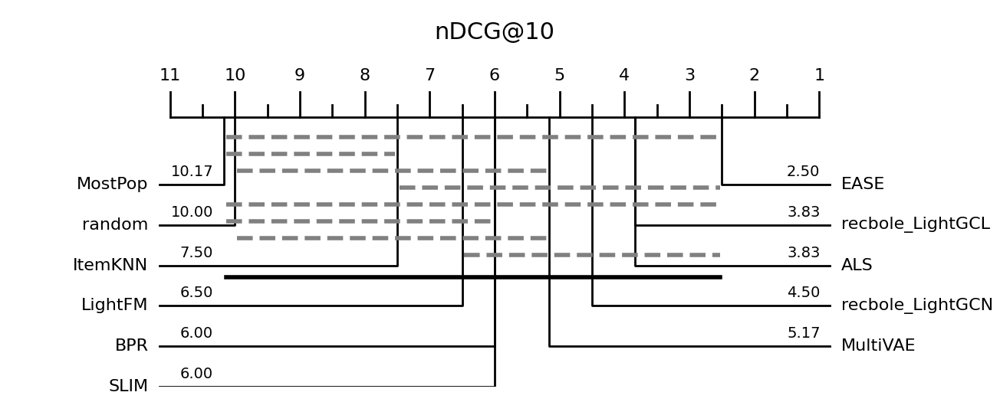

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

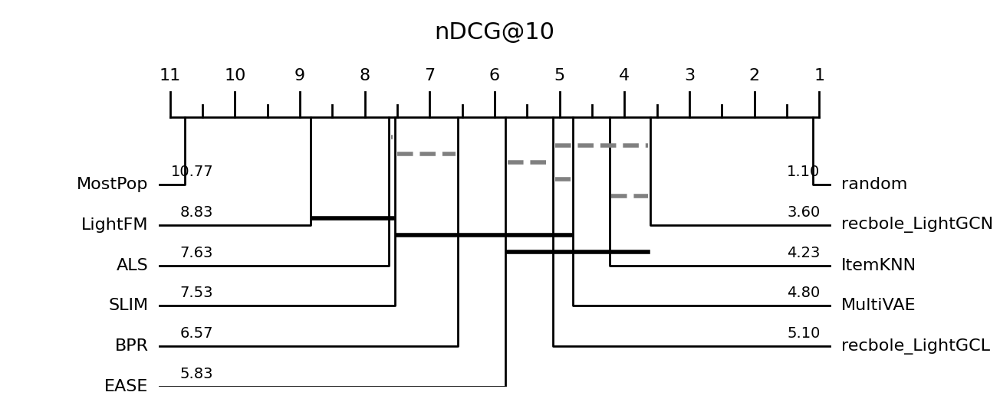

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

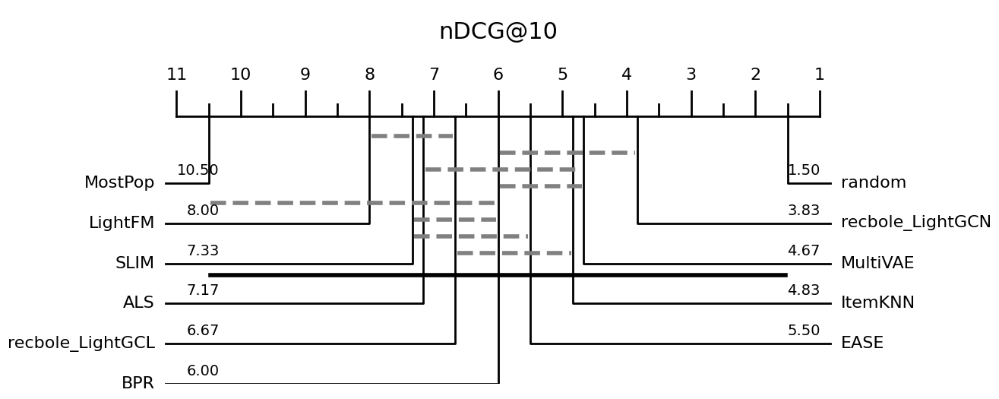

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

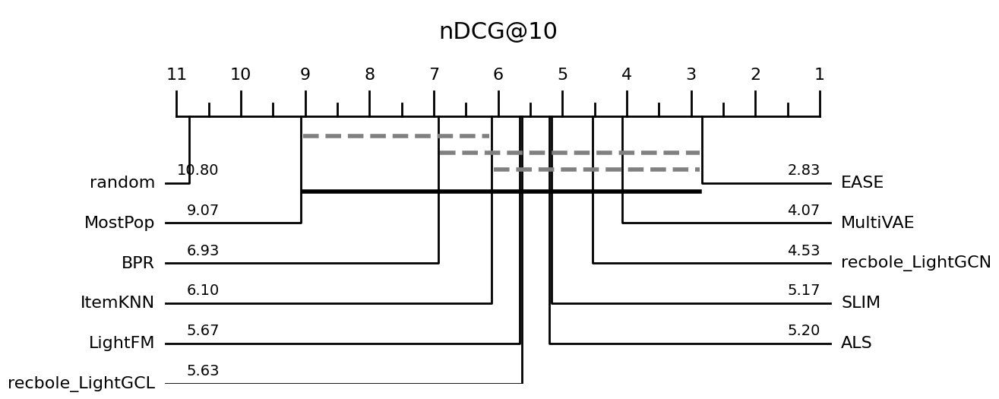

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

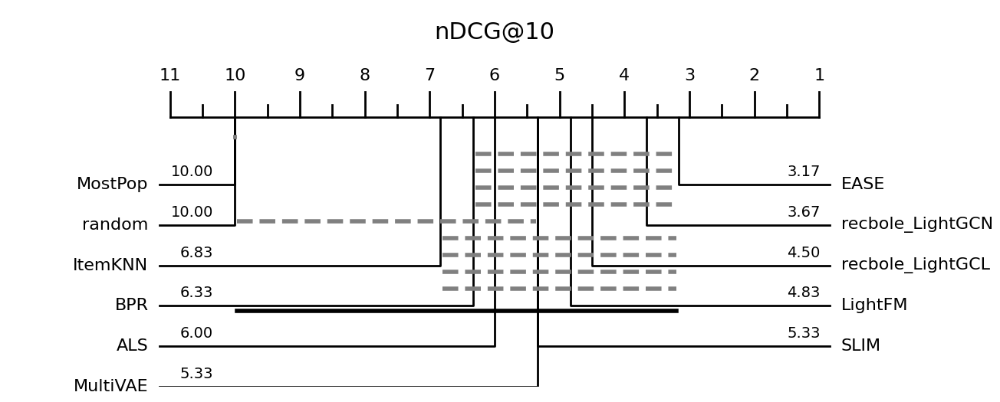

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

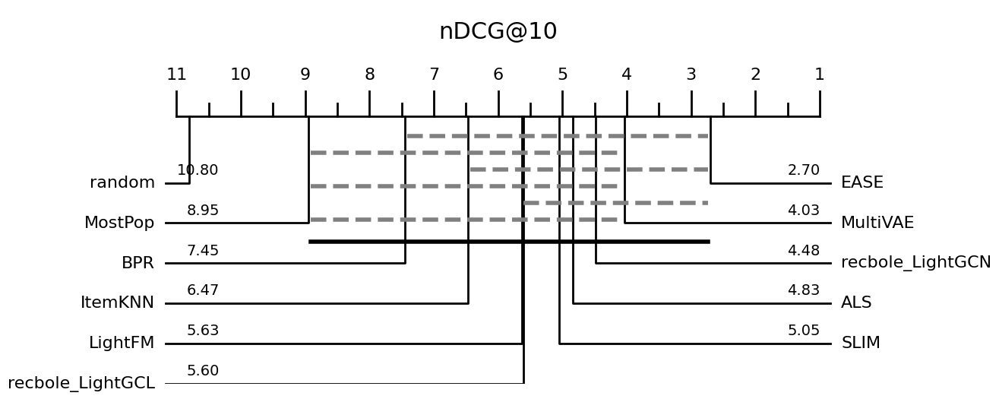

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

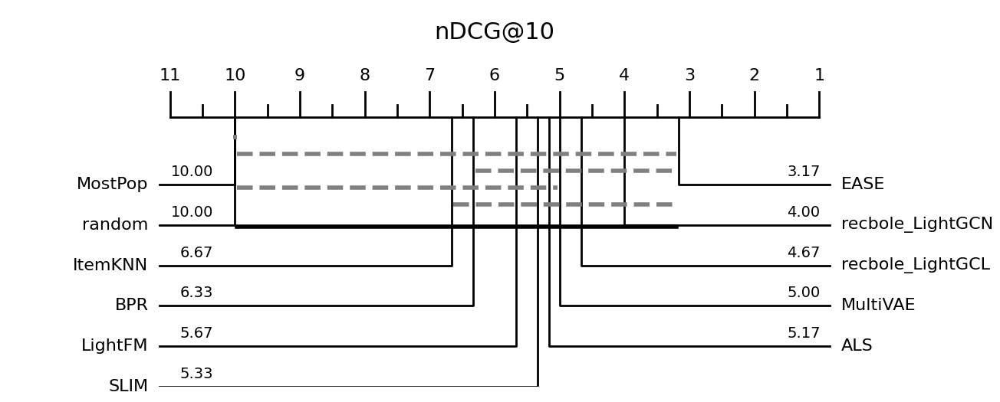

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

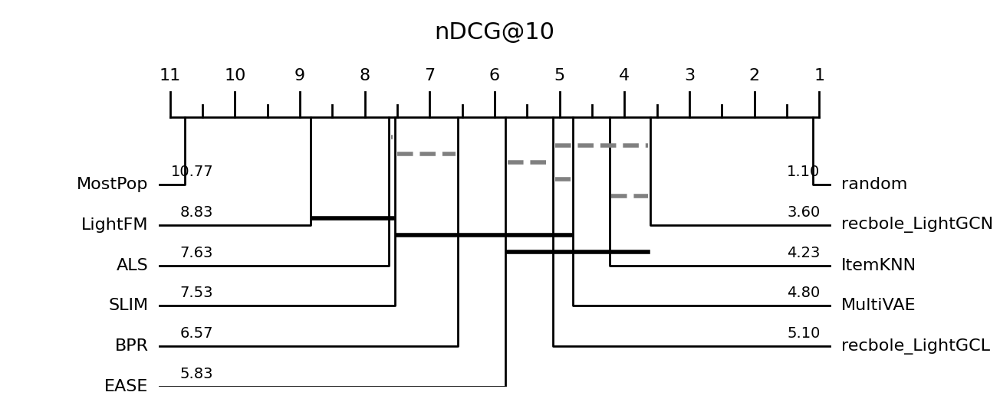

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

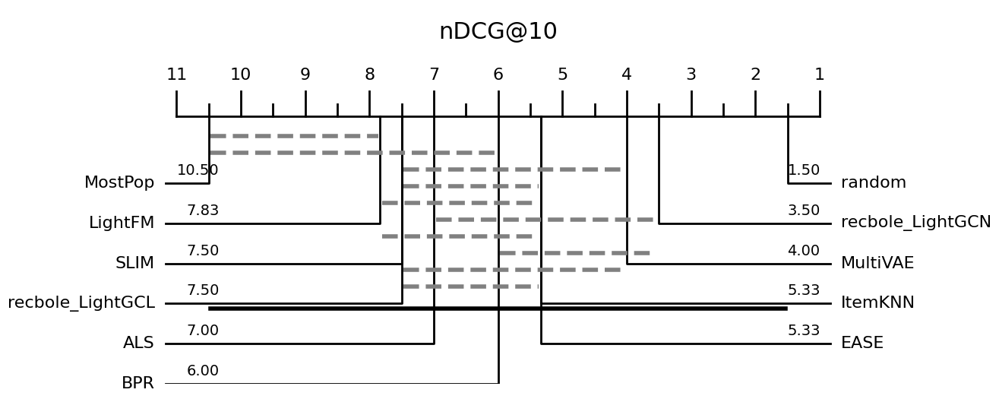

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

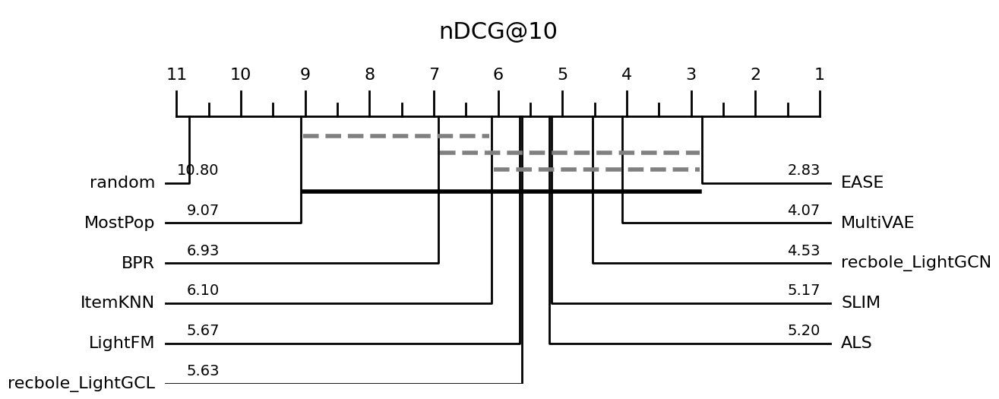

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

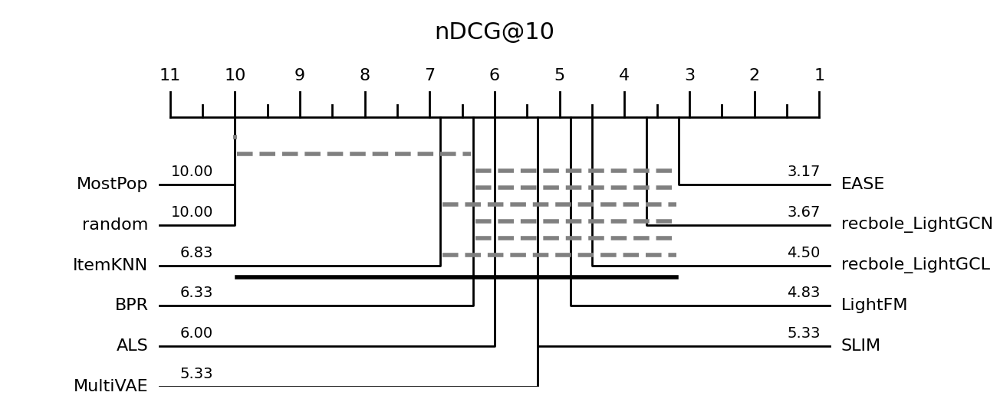

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

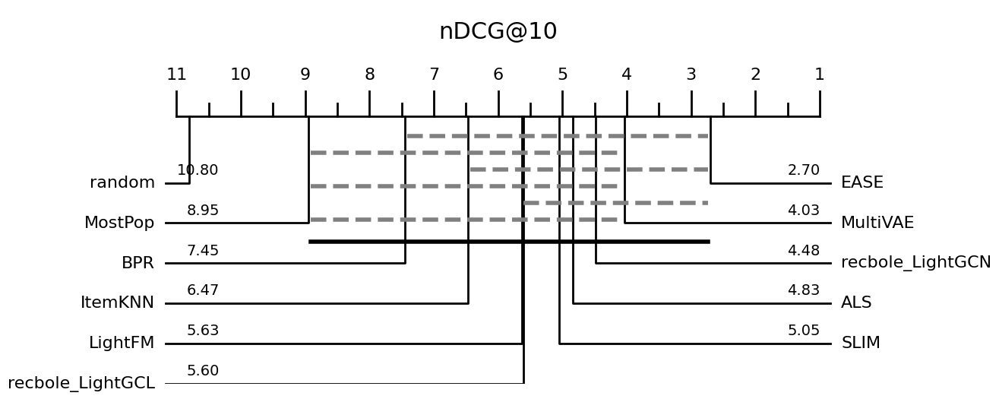

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

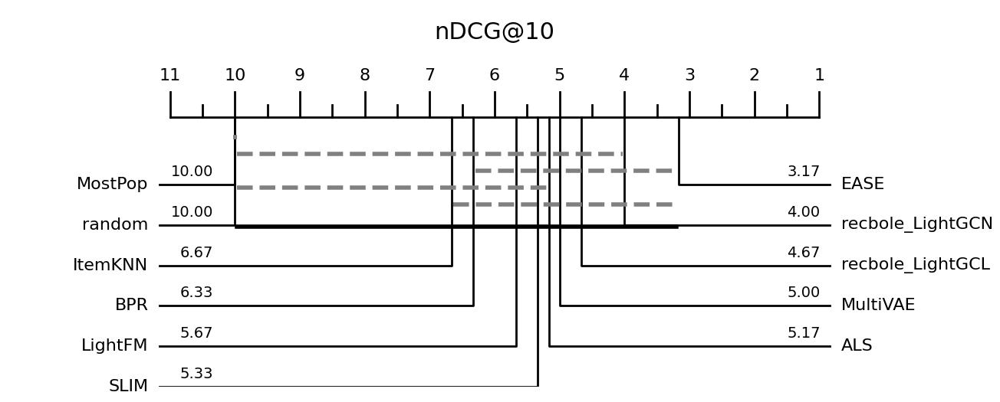

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

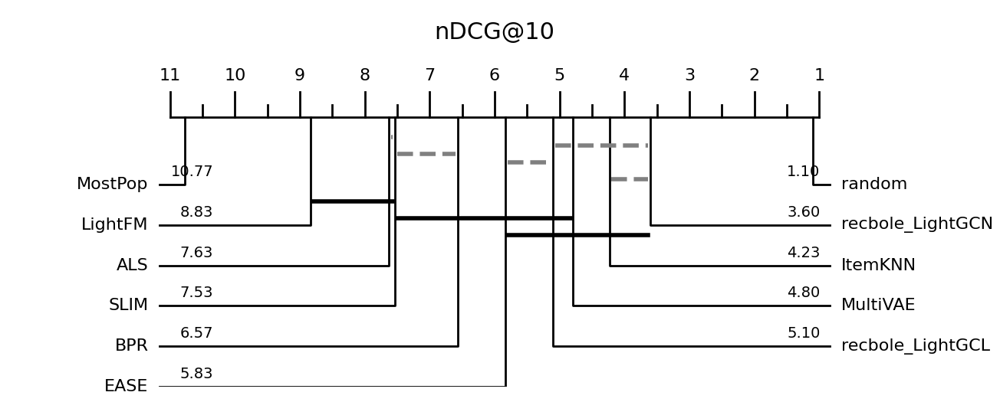

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

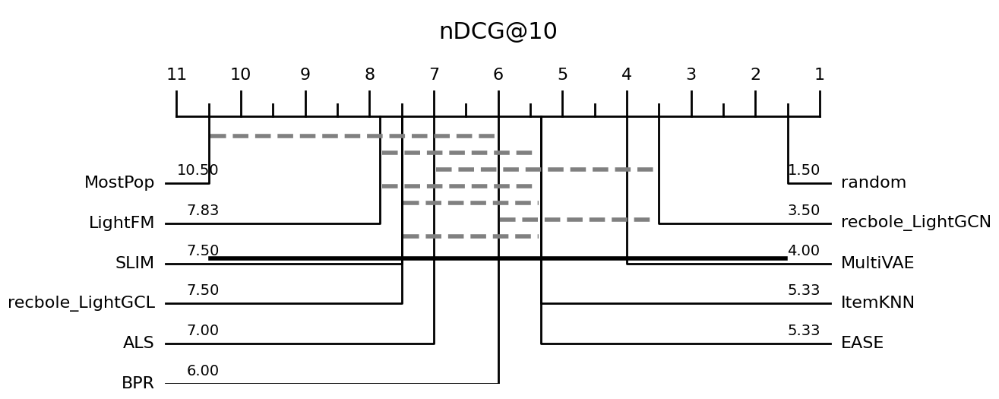

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

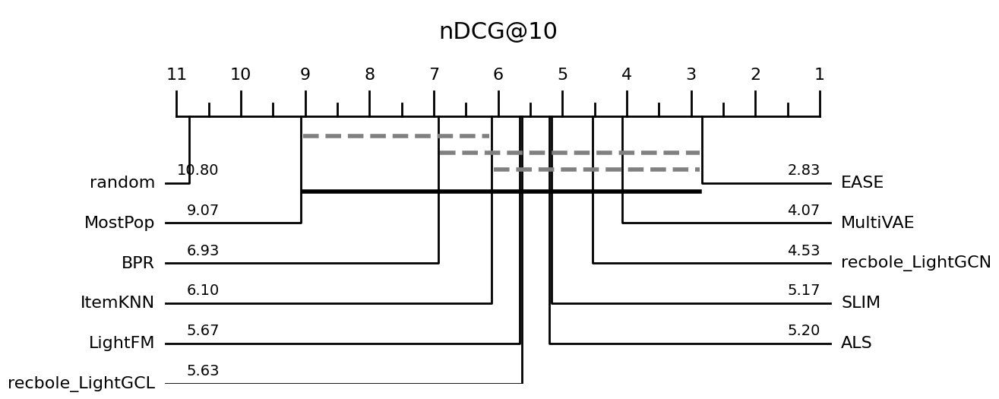

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

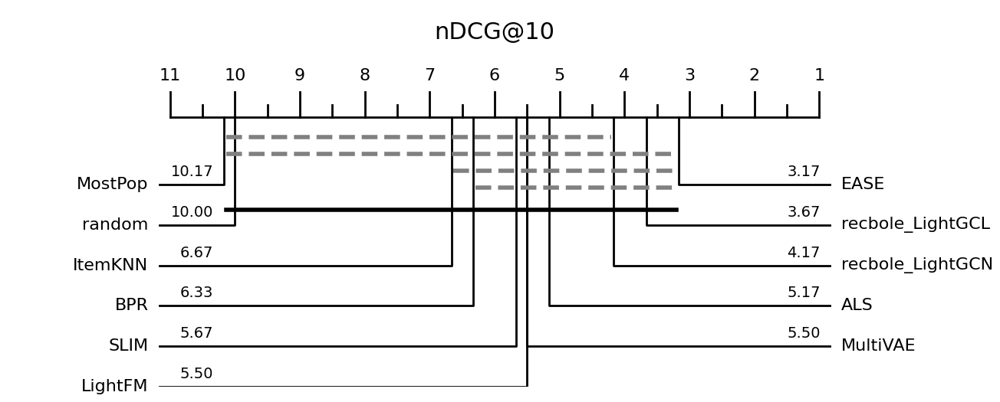

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

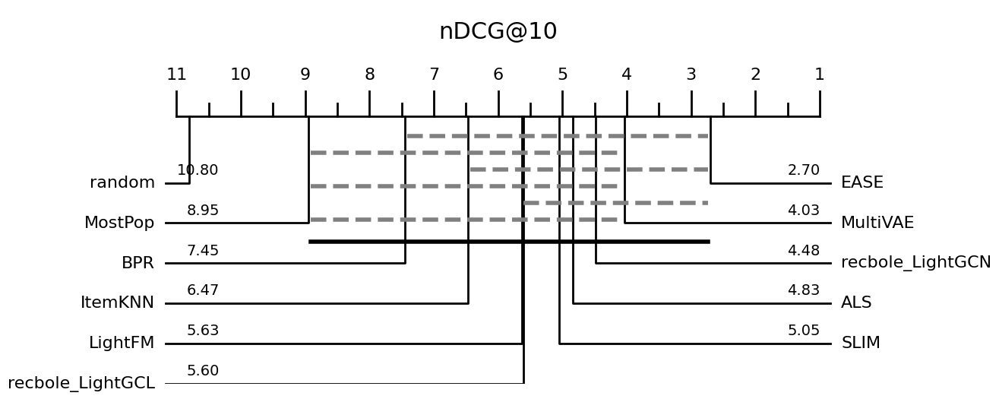

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

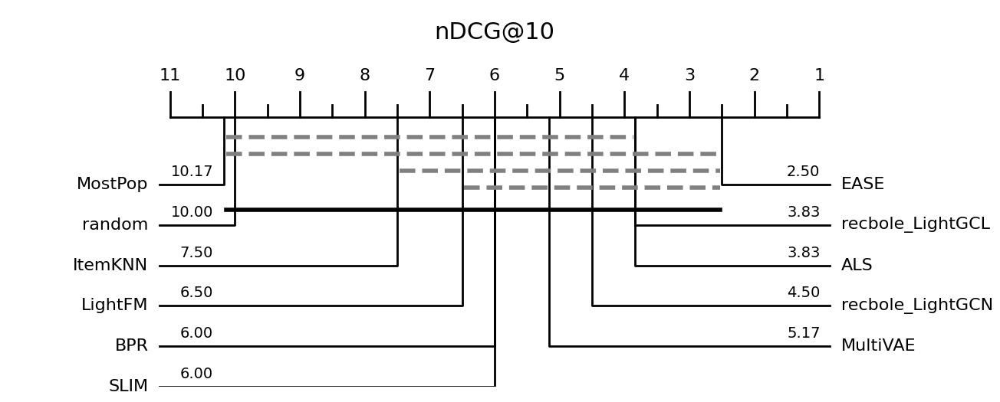

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

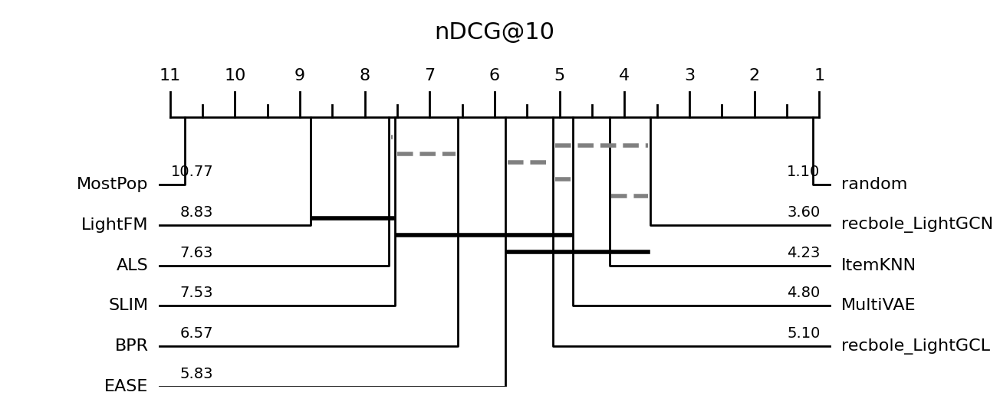

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

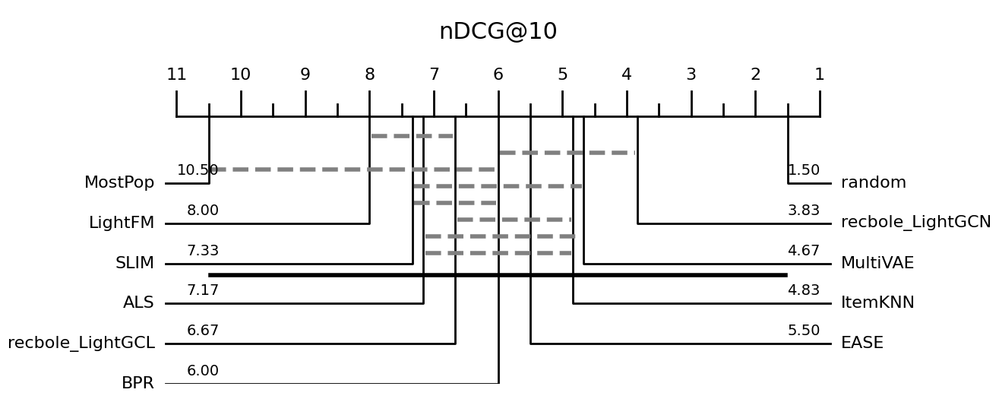

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

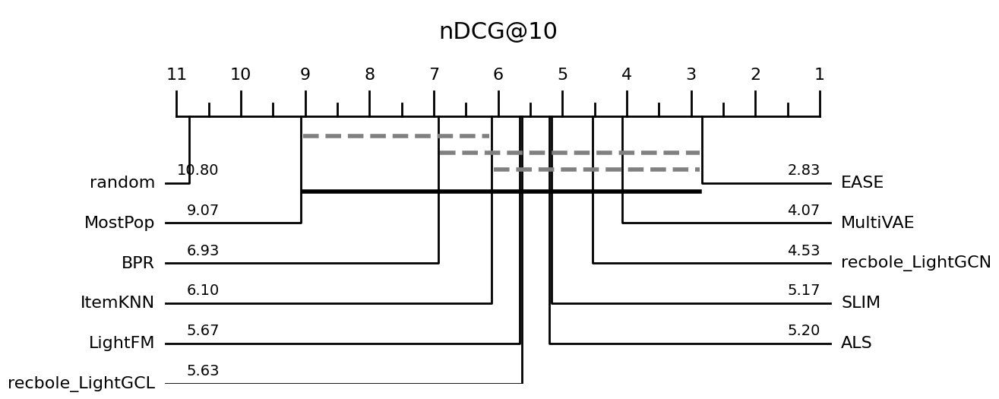

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

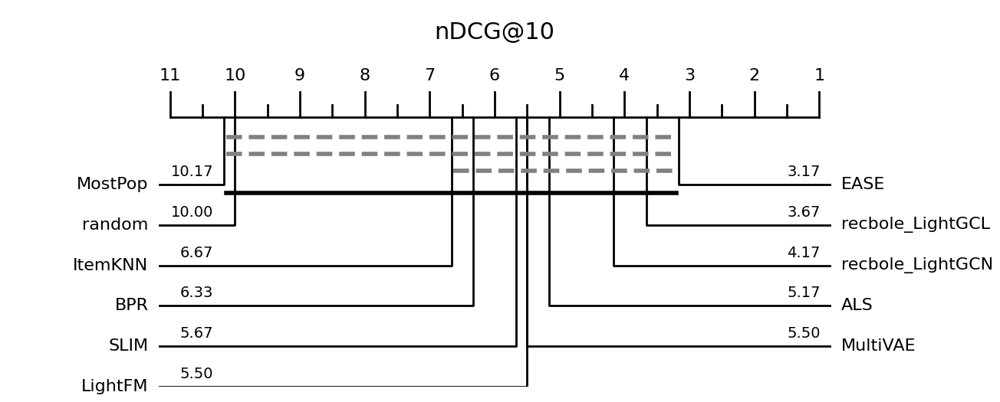

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

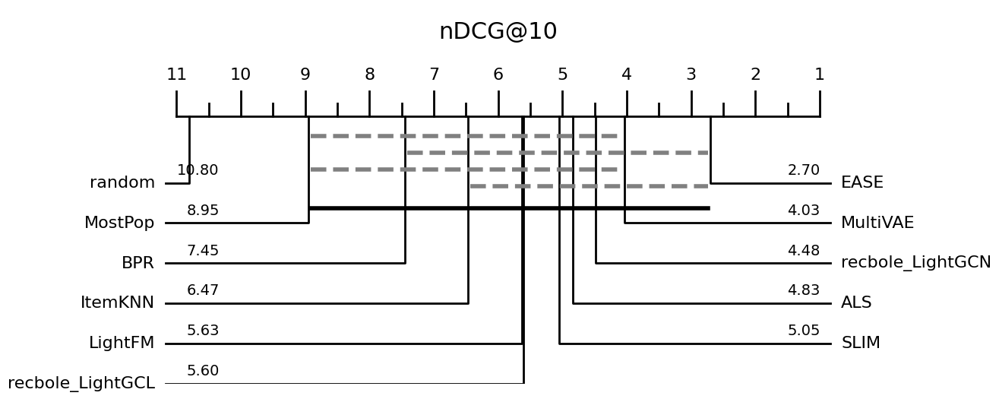

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

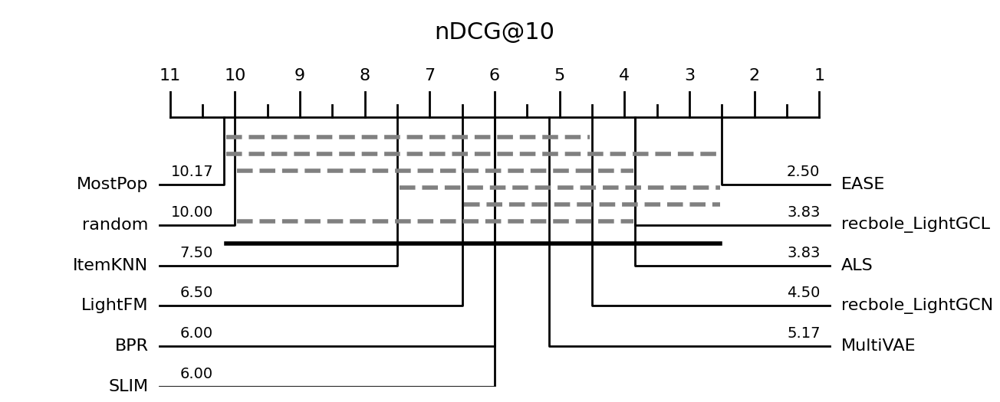

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

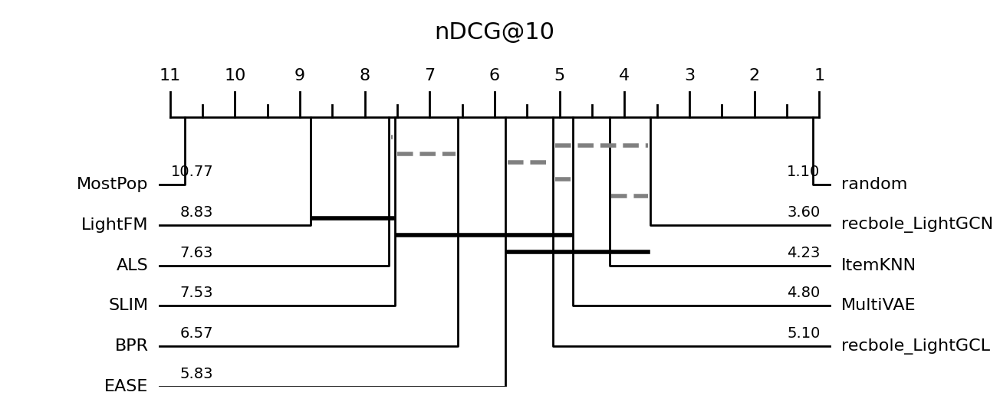

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

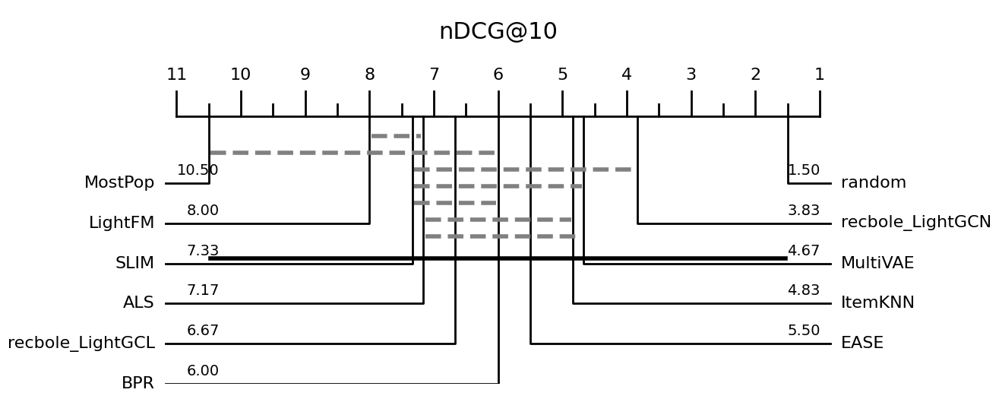

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

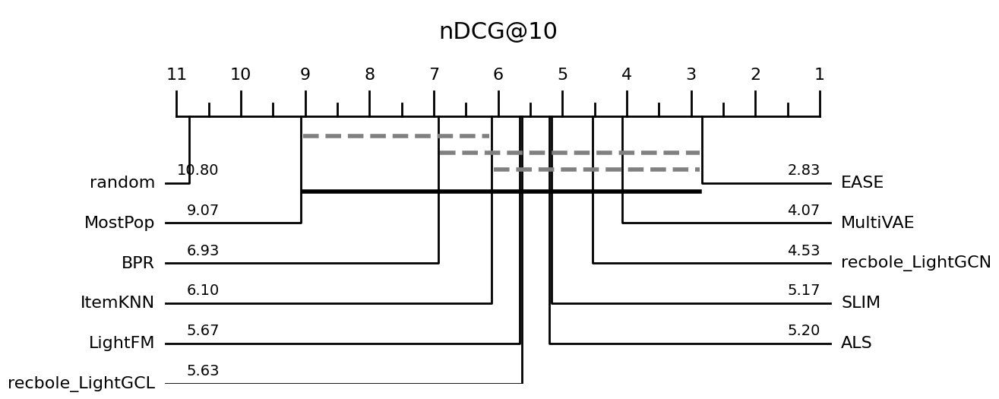

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

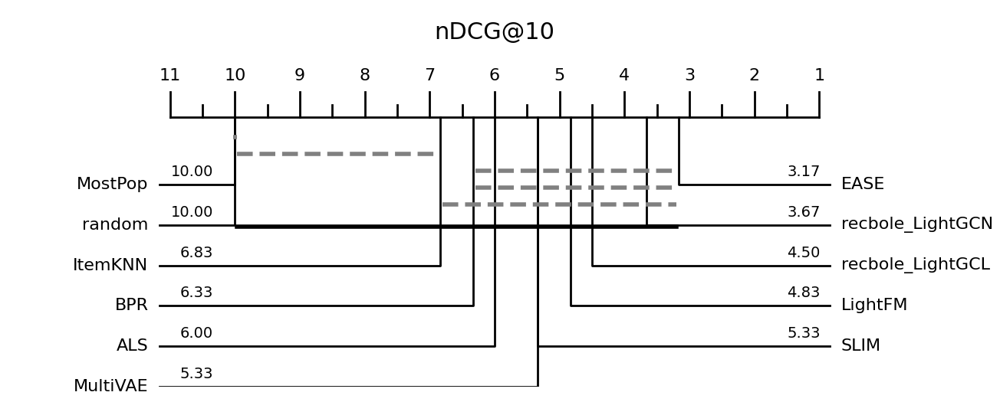

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

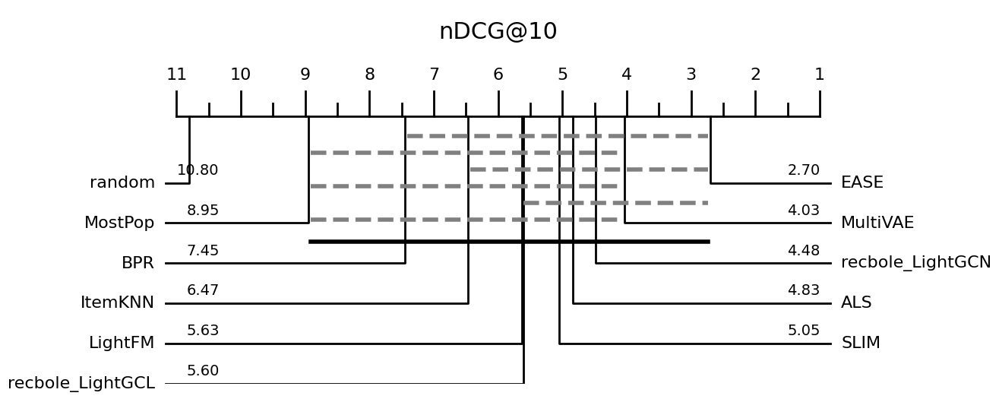

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

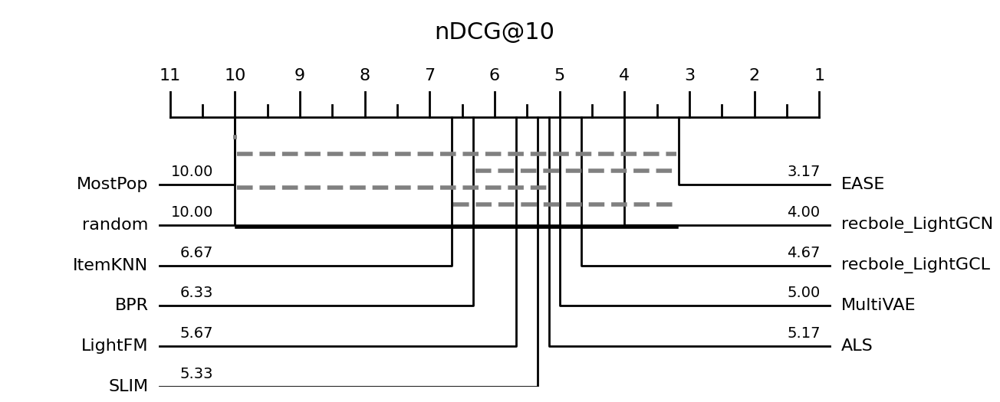

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

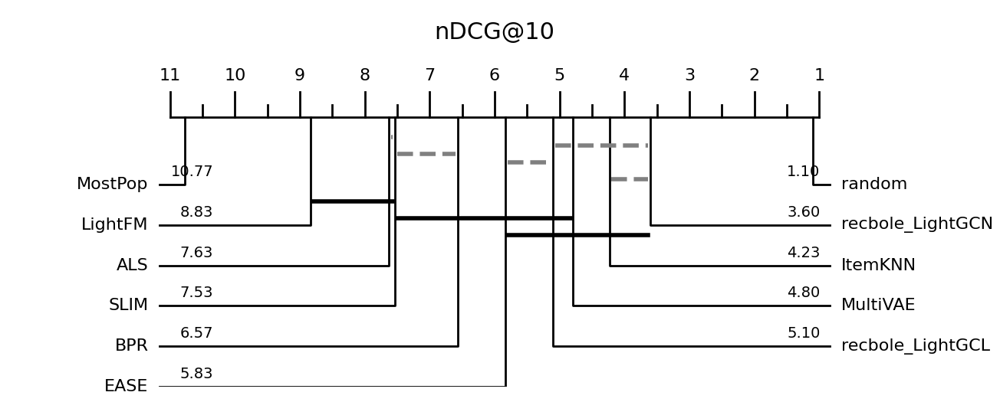

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

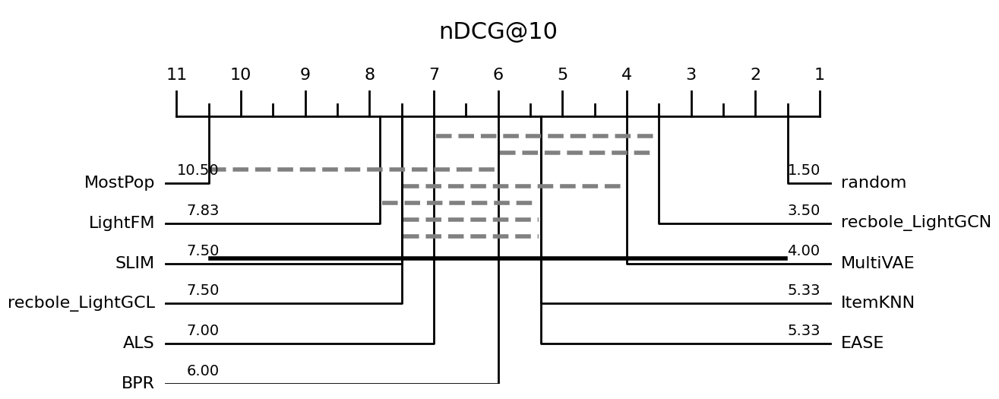

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

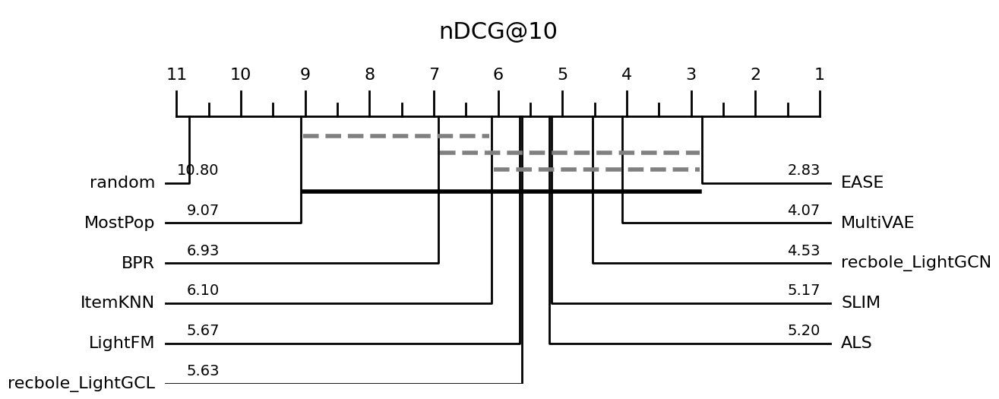

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

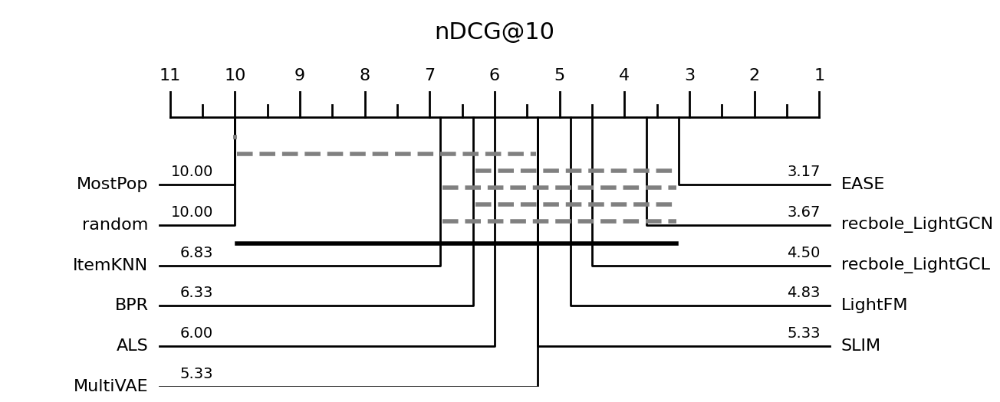

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

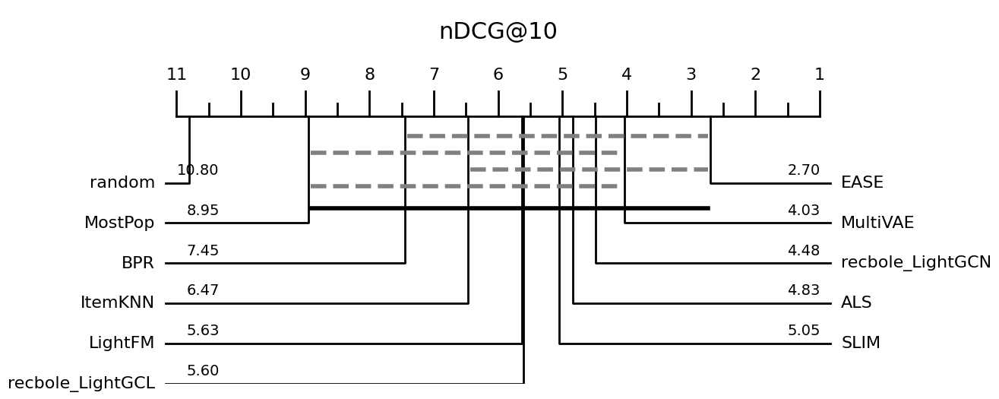

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

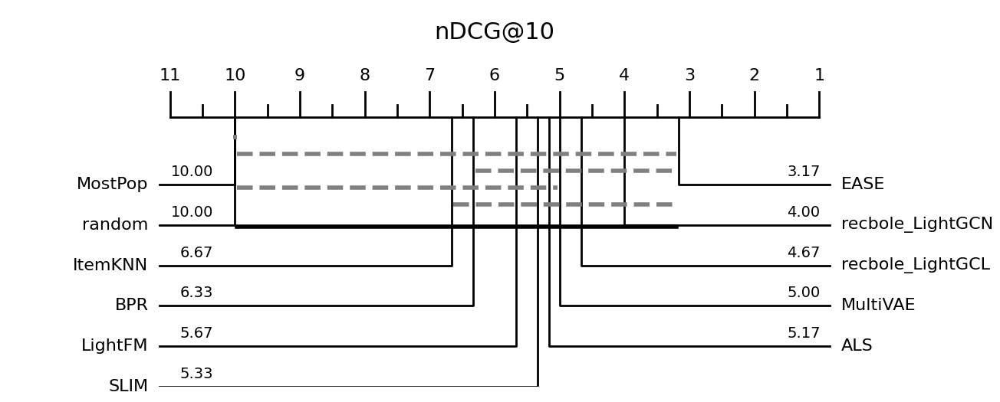

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

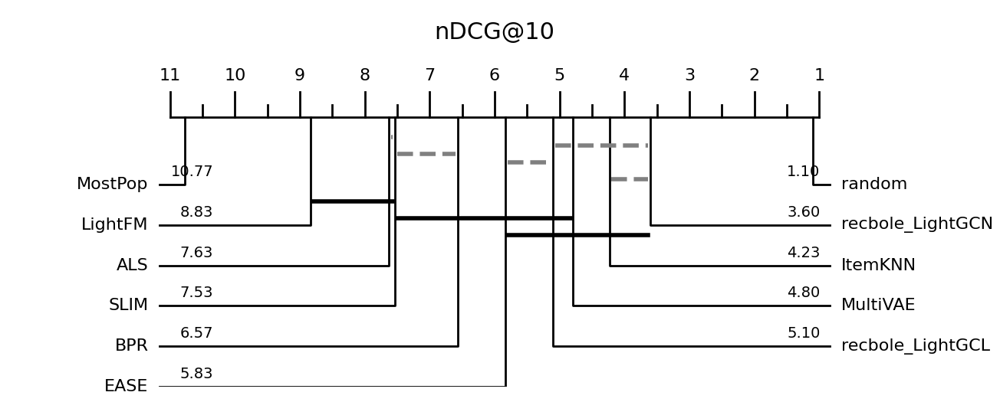

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

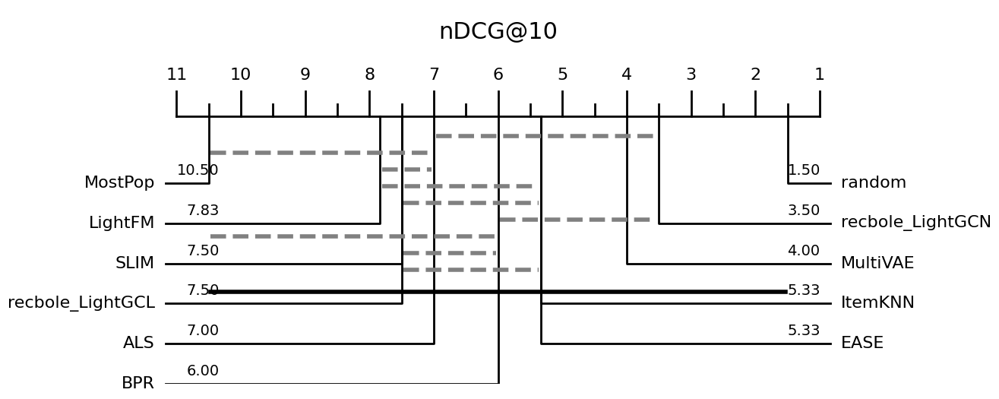

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

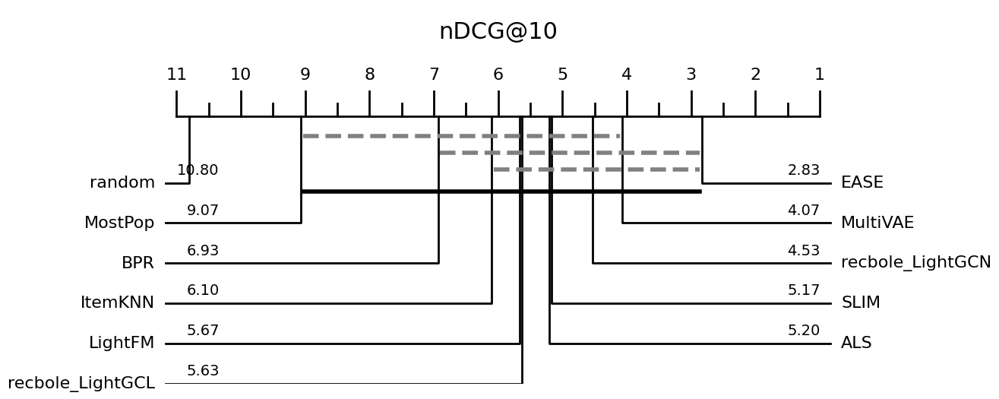

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

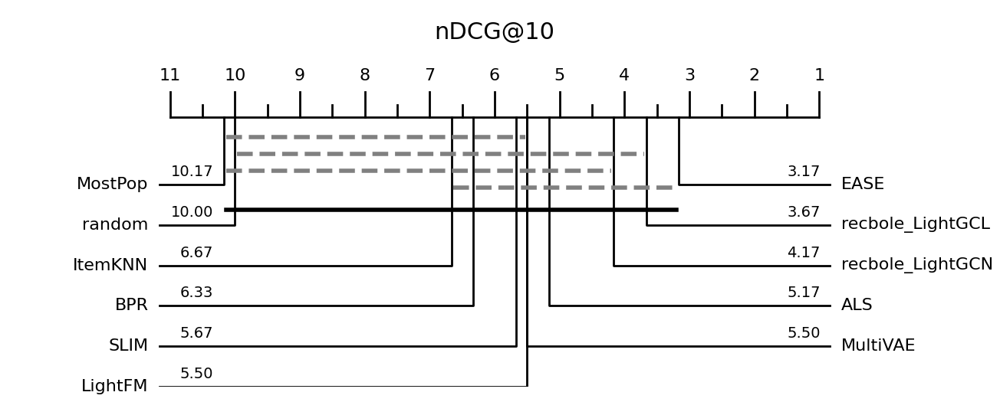

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

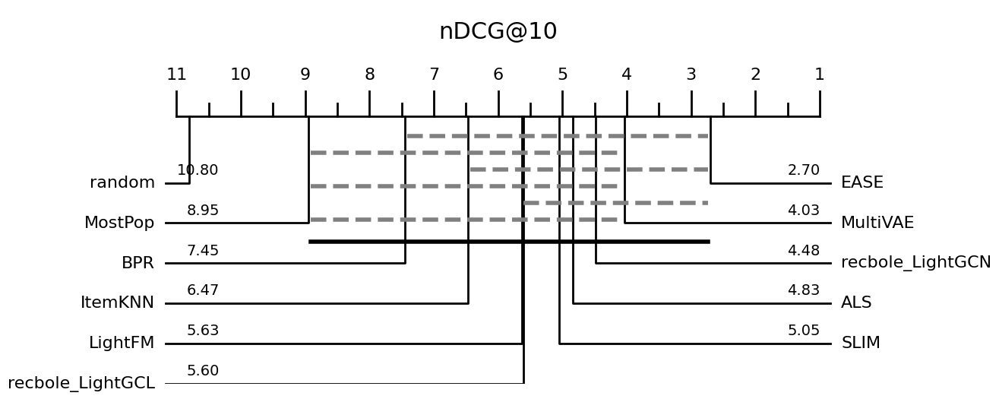

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

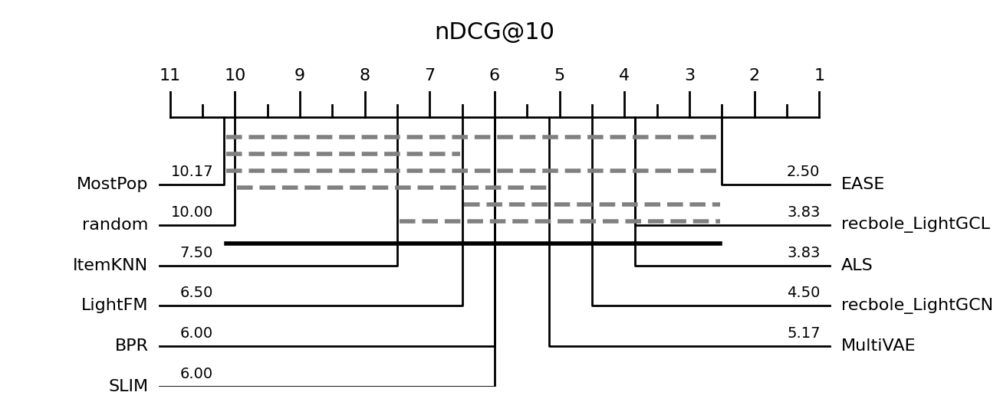

In [ ]:
d_score_list = []
for x in tqdm(range(100)):
    cur_best_indices, _ = run_d_optimal(df_results.values, k_datasets, seed=x, sampling=1, slog=True,)
    d_optimal_datasets = list(df_data.reset_index(names="dataset").iloc[cur_best_indices, :]['dataset'])
    d_score_list.append([*get_all_score(d_optimal_datasets, ndcg_res, hitrate_res, coverage_res, "ndcg", 10, methods)])

## A optimal

  0%|                                                                                                                                     | 0/10 [00:00<?, ?it/s]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 10%|████████████▌                                                                                                                | 1/10 [00:05<00:48,  5.43s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 20%|█████████████████████████                                                                                                    | 2/10 [00:10<00:43,  5.42s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 30%|█████████████████████████████████████▌                                                                                       | 3/10 [00:16<00:37,  5.41s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 40%|██████████████████████████████████████████████████                                                                           | 4/10 [00:21<00:32,  5.42s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 50%|██████████████████████████████████████████████████████████████▌                                                              | 5/10 [00:27<00:27,  5.41s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 60%|███████████████████████████████████████████████████████████████████████████                                                  | 6/10 [00:32<00:21,  5.41s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 70%|███████████████████████████████████████████████████████████████████████████████████████▌                                     | 7/10 [00:38<00:17,  5.67s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 80%|████████████████████████████████████████████████████████████████████████████████████████████████████                         | 8/10 [00:44<00:11,  5.59s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 9/10 [00:49<00:05,  5.54s/it]

the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway
the null hypothesis over the entire classifiers cannot be rejected. Proceeding anyway


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:54<00:00,  5.49s/it]
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Aria

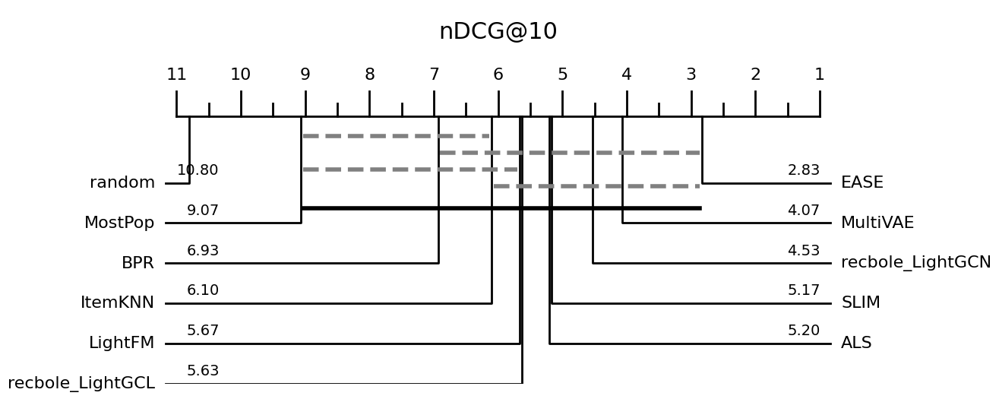

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

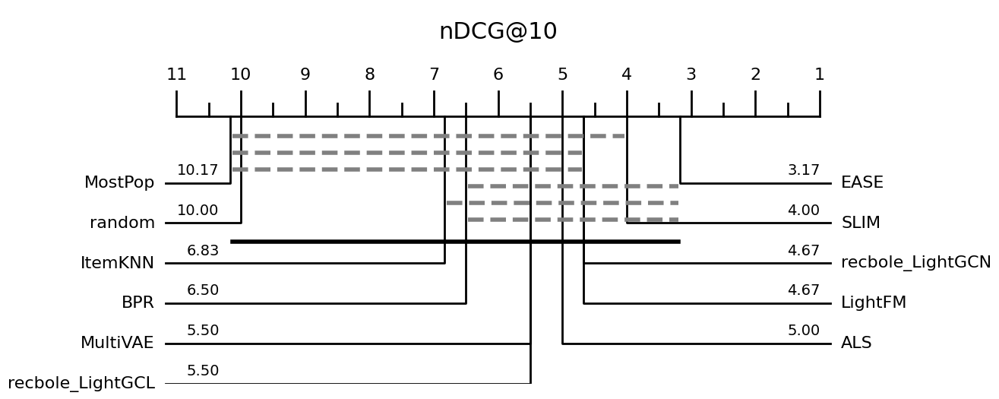

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

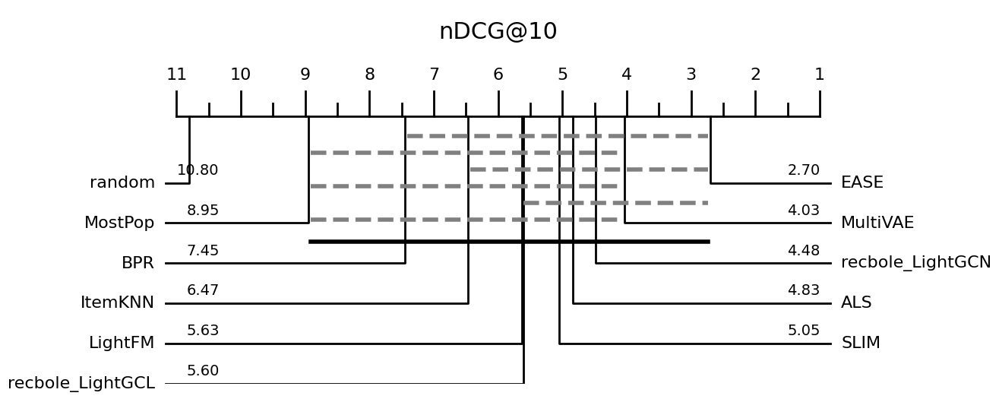

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

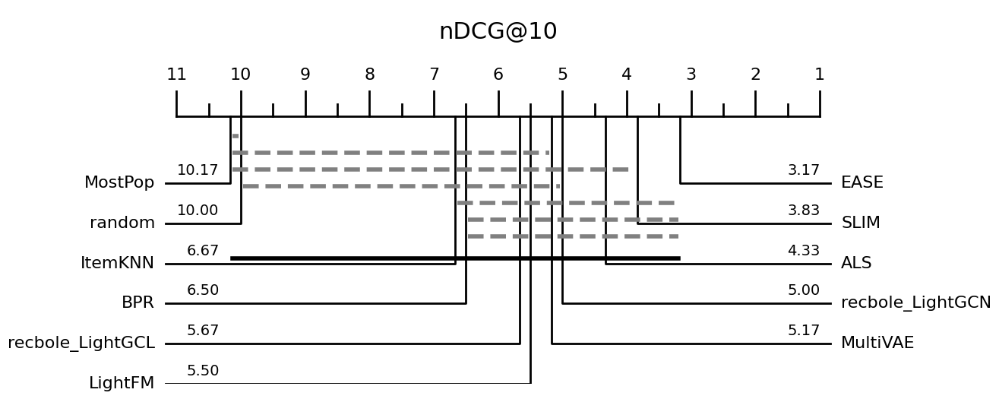

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

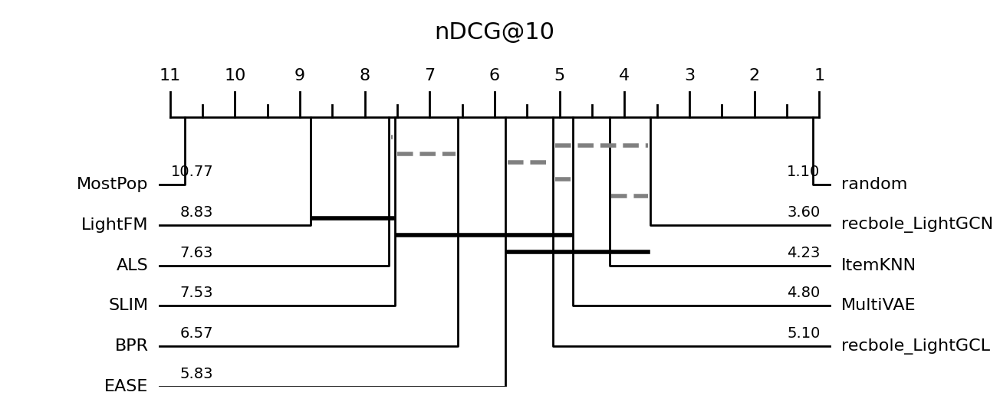

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

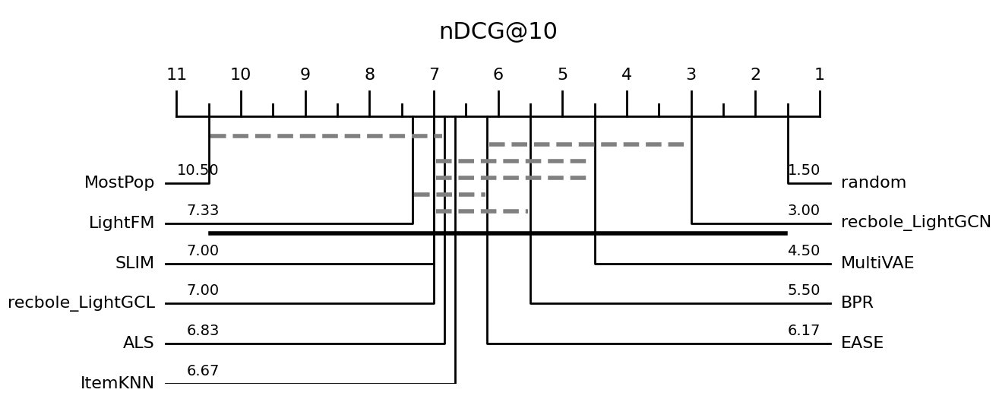

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

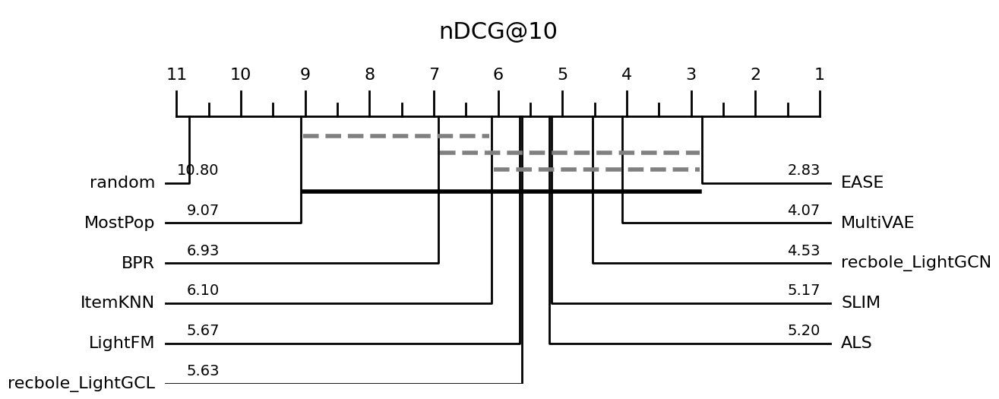

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

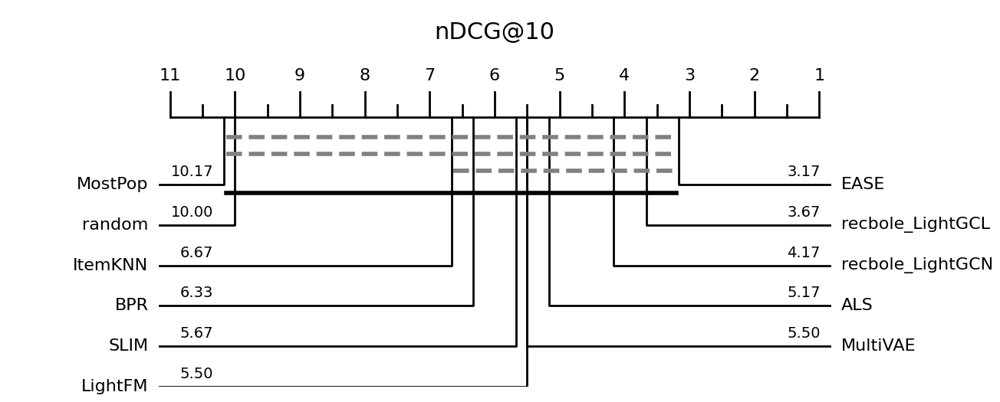

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

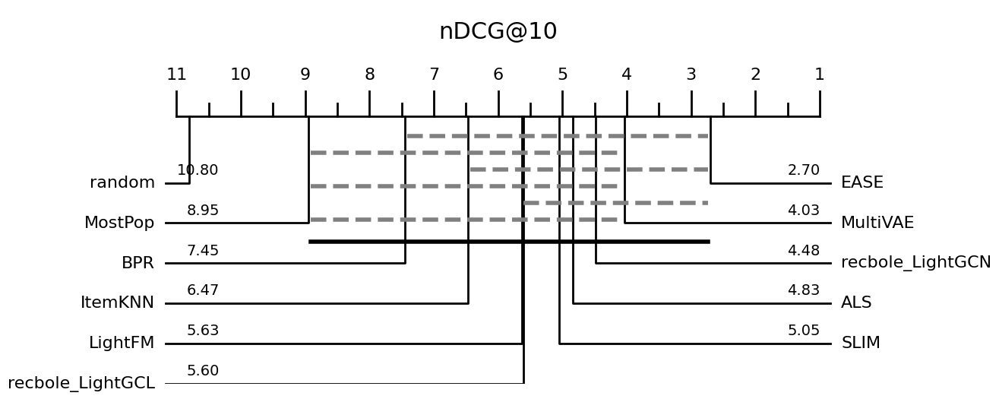

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

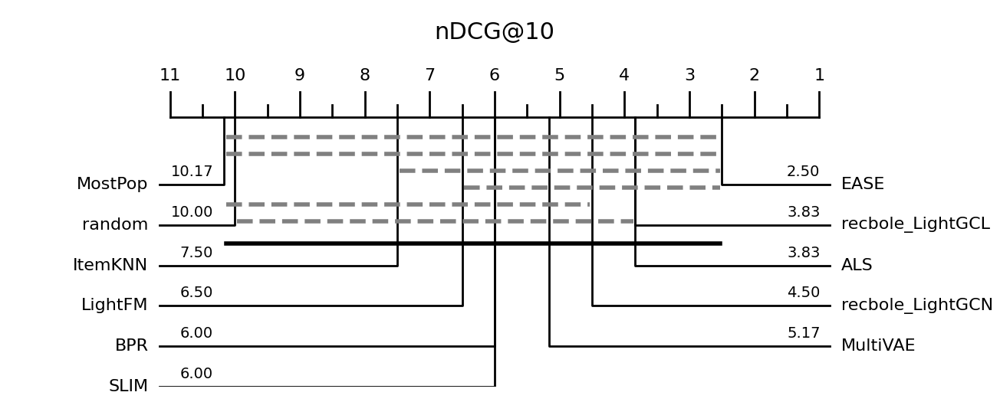

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

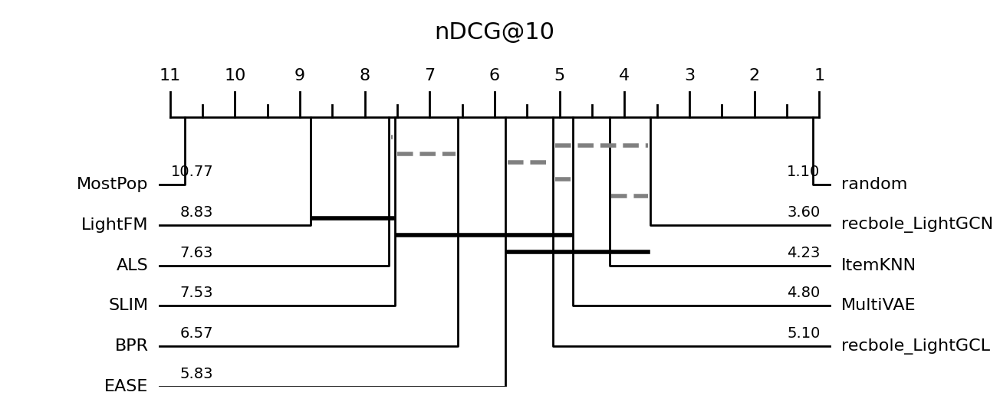

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

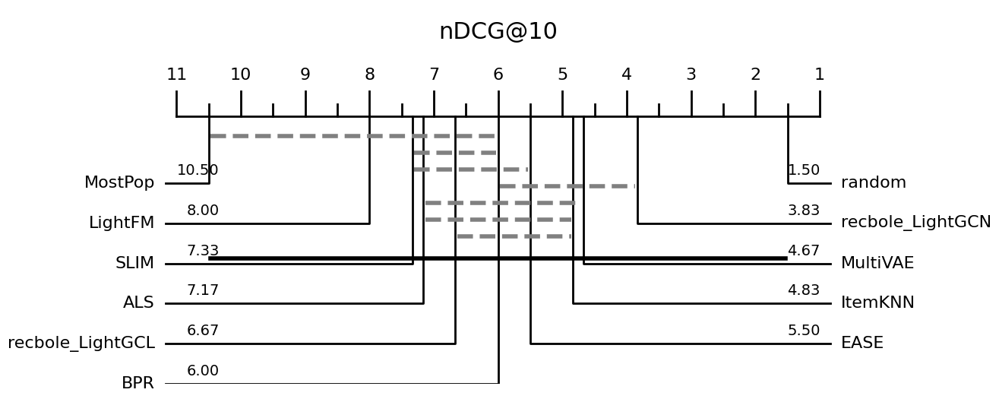

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

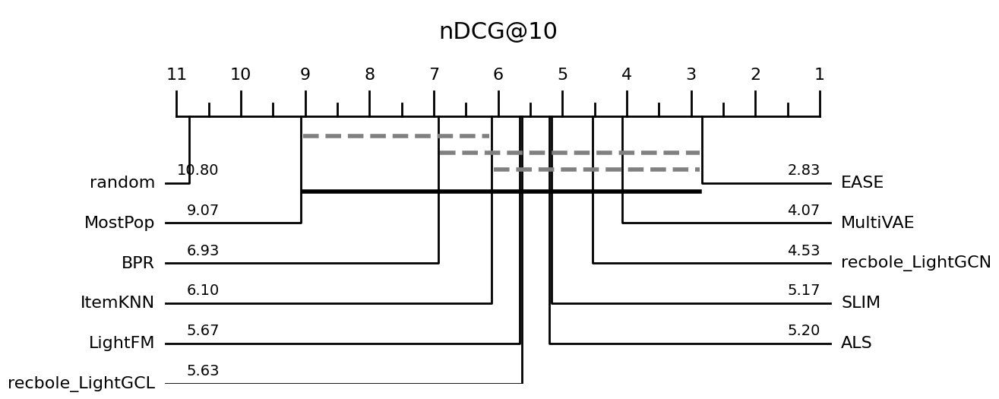

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

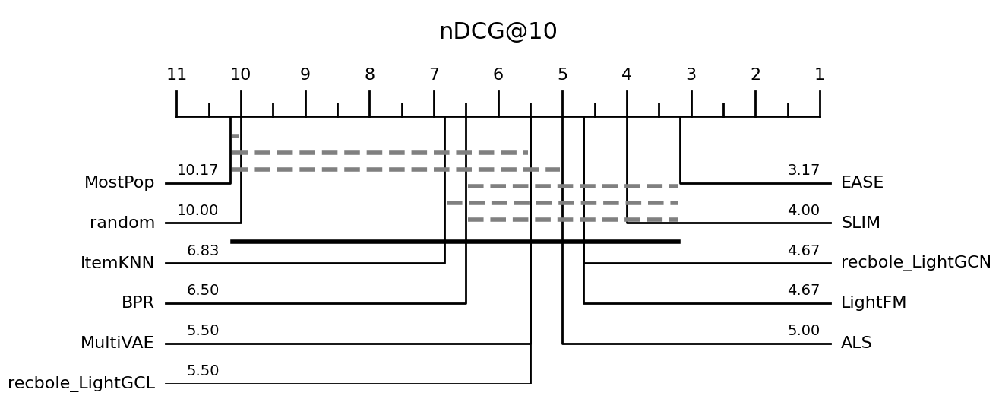

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

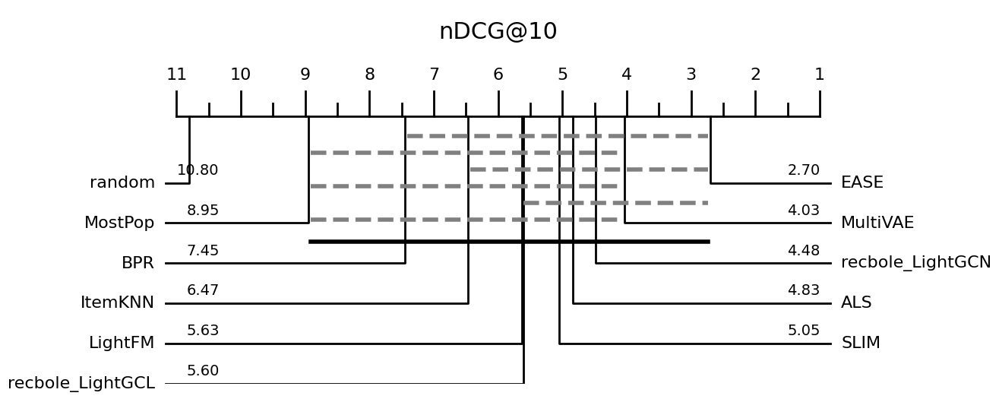

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

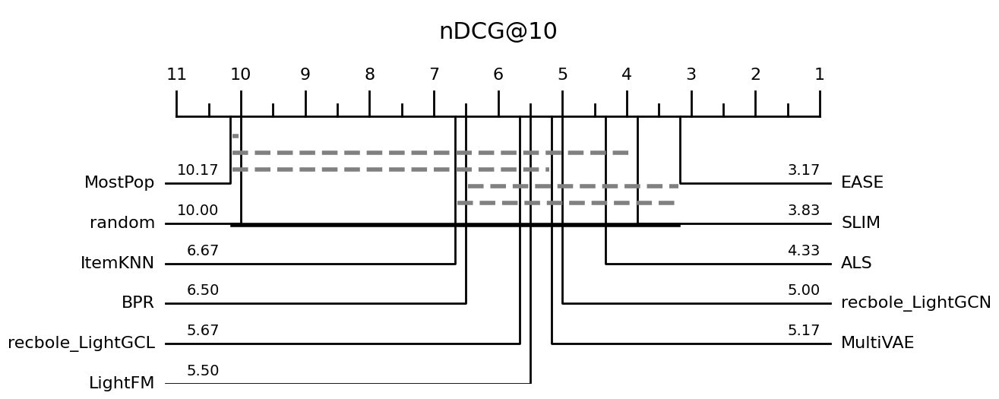

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

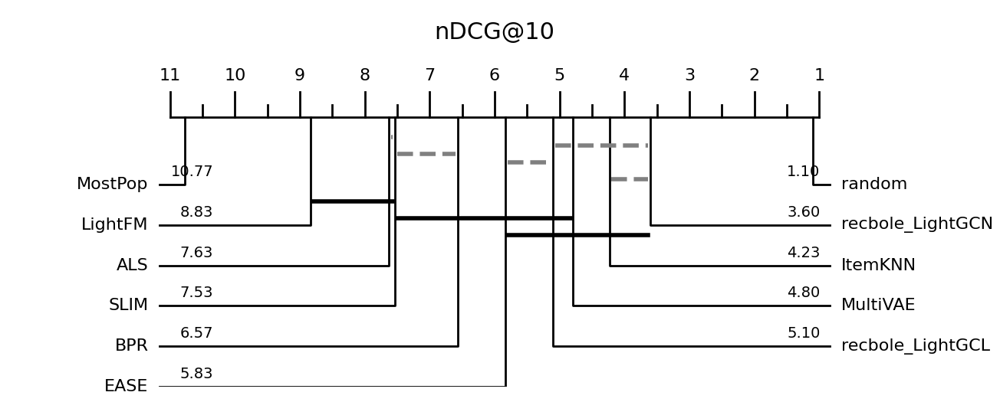

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

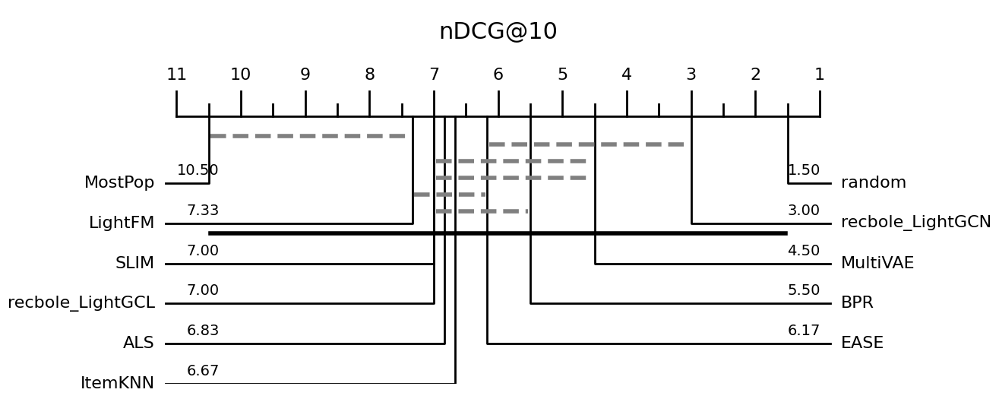

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

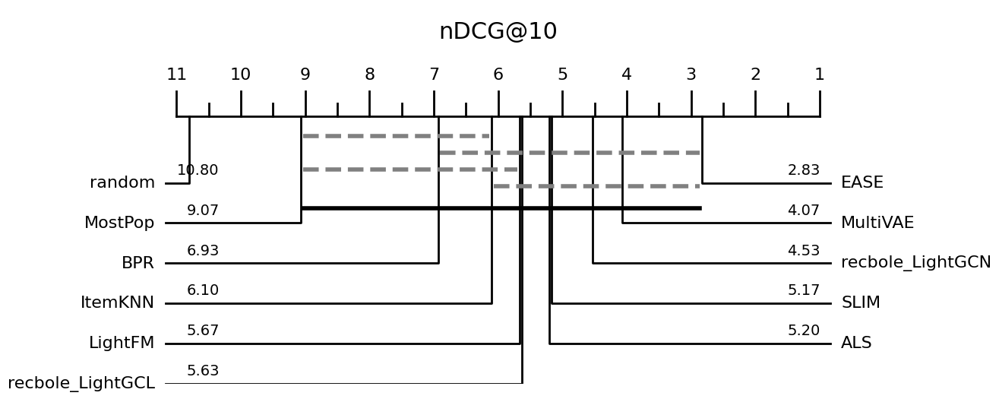

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

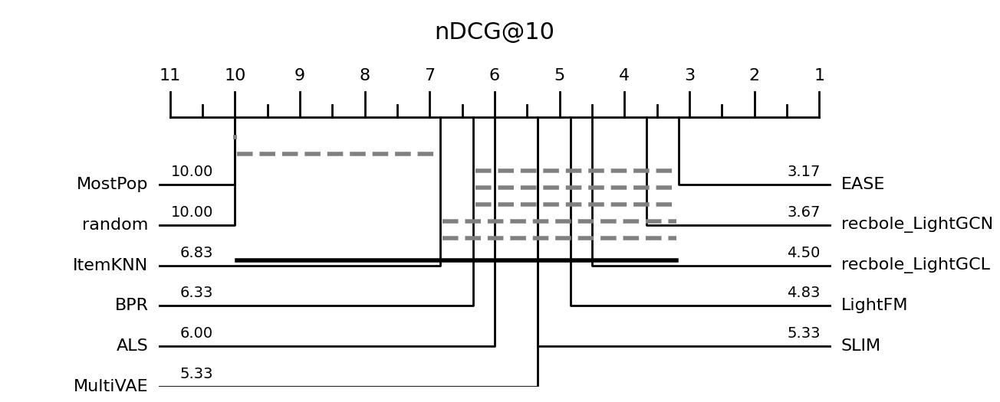

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

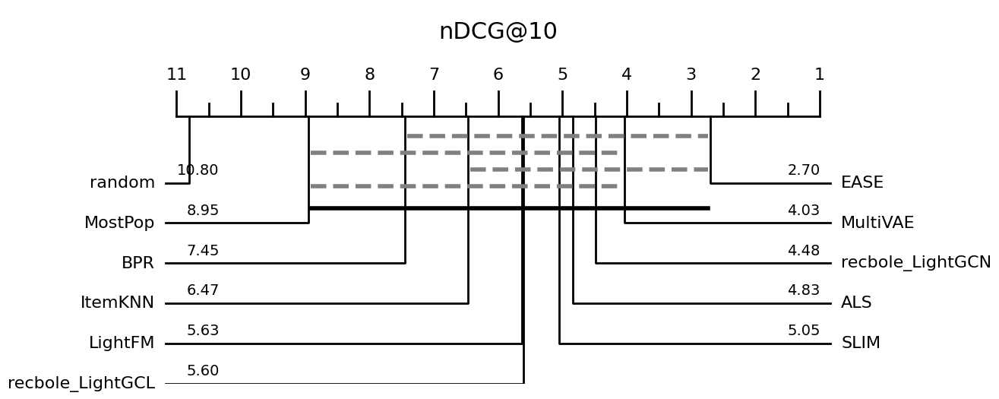

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

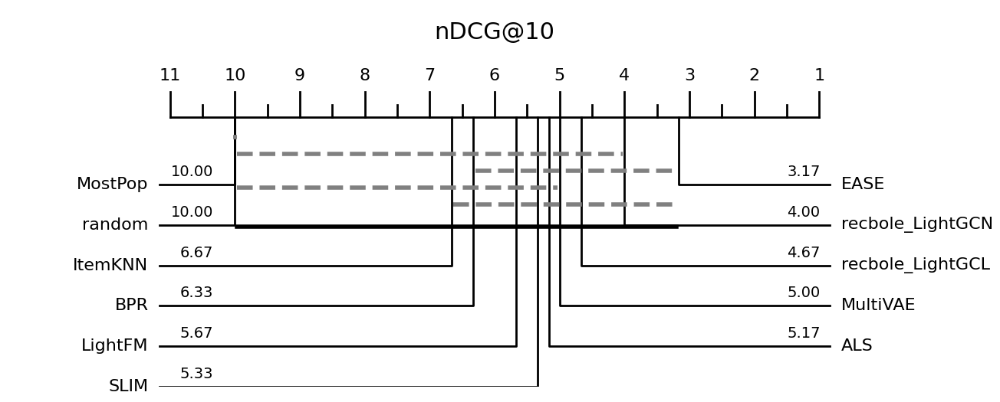

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

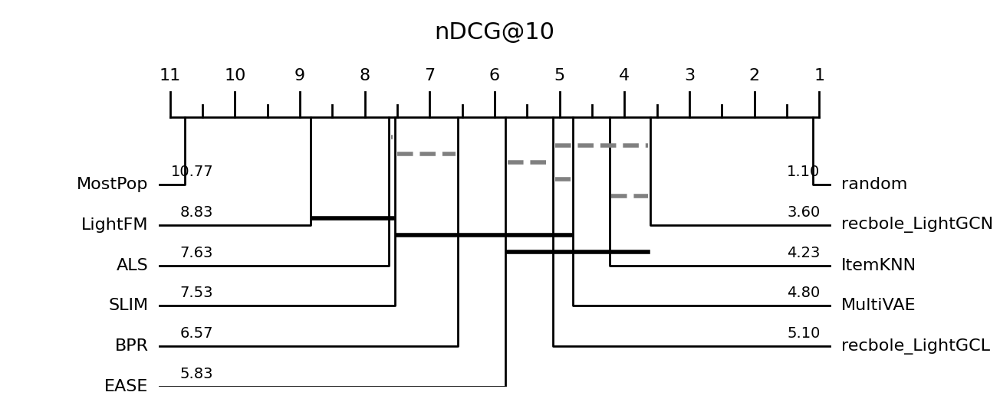

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

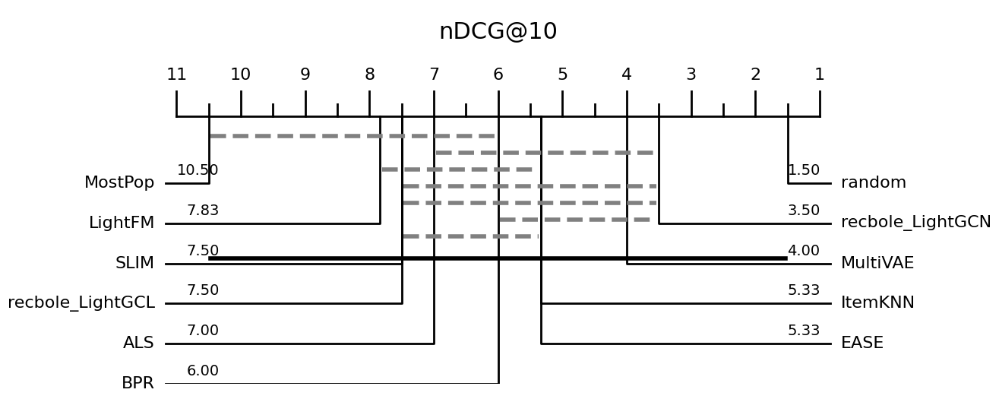

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

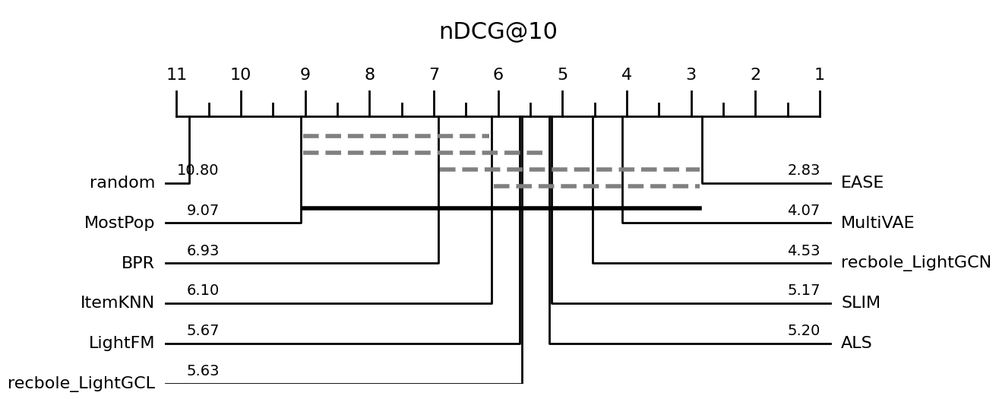

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

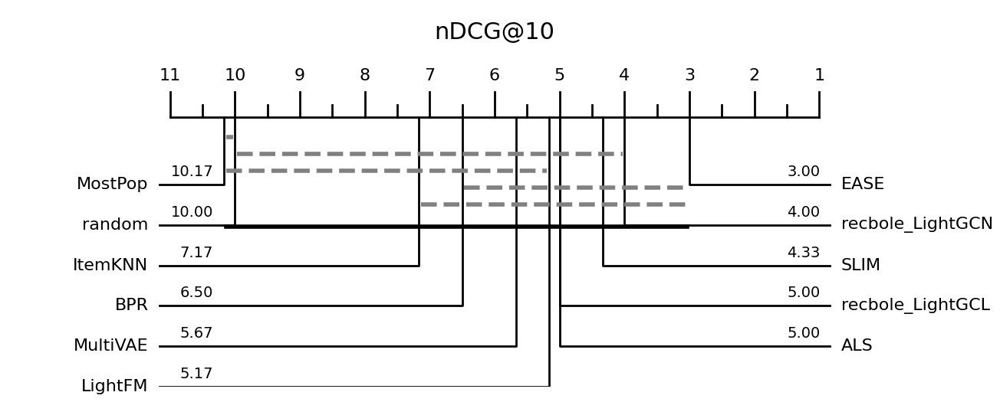

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

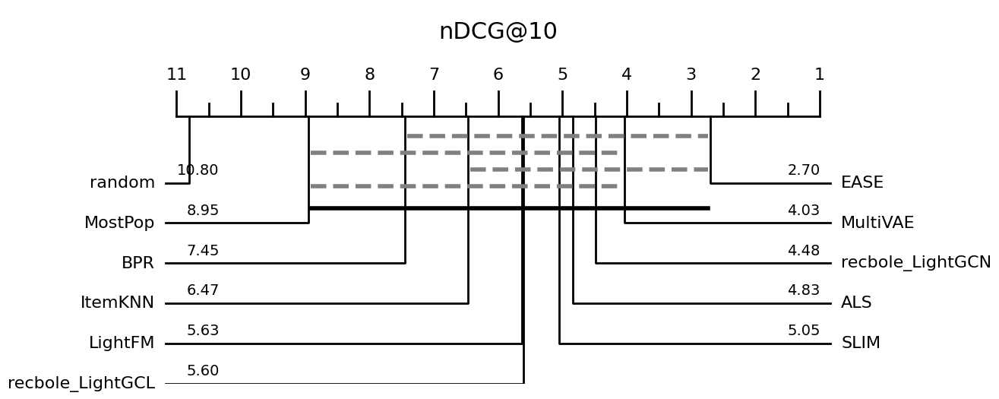

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

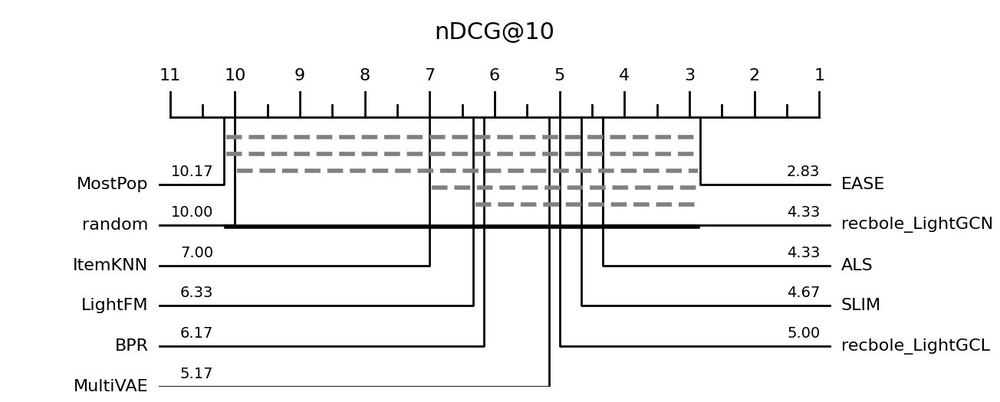

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

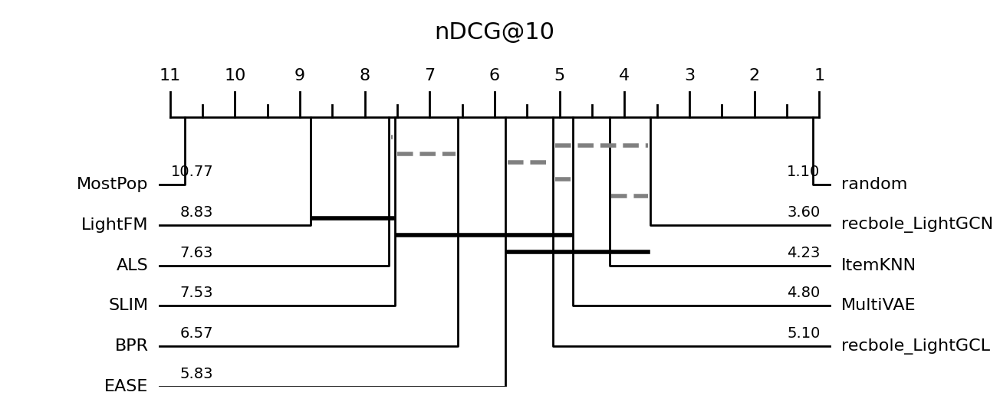

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

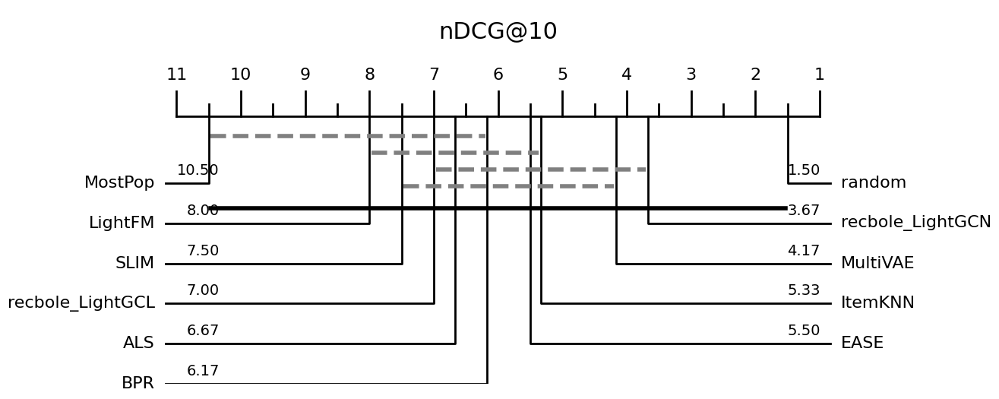

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

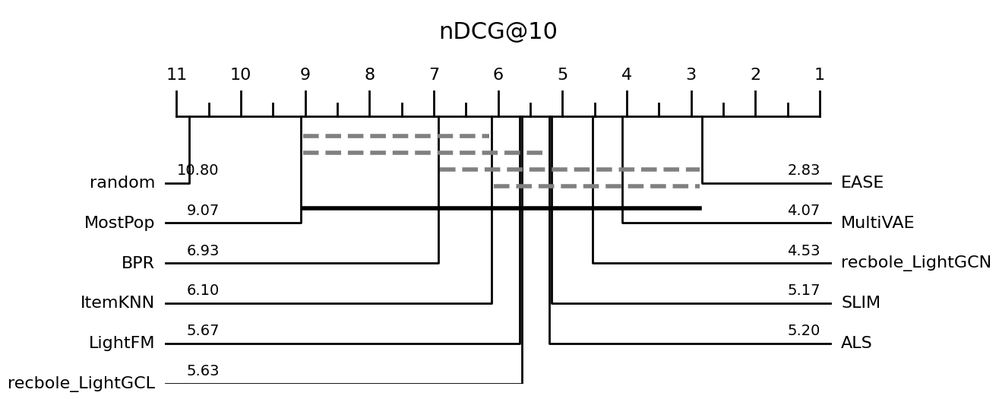

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

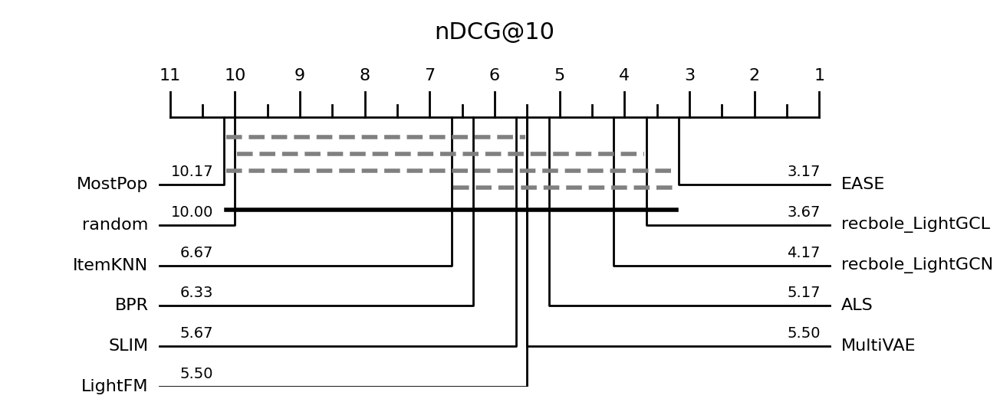

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

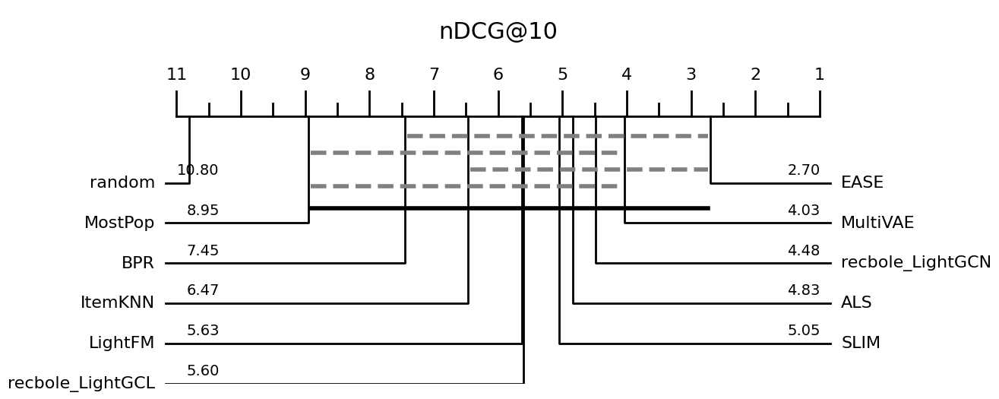

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

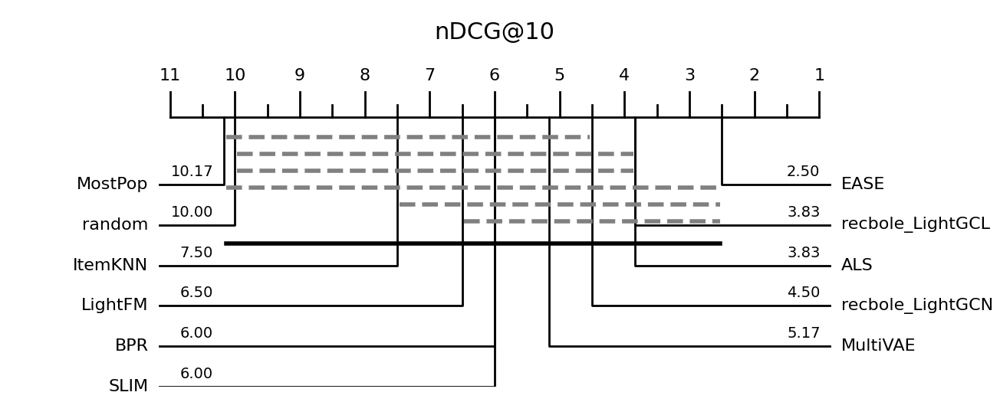

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

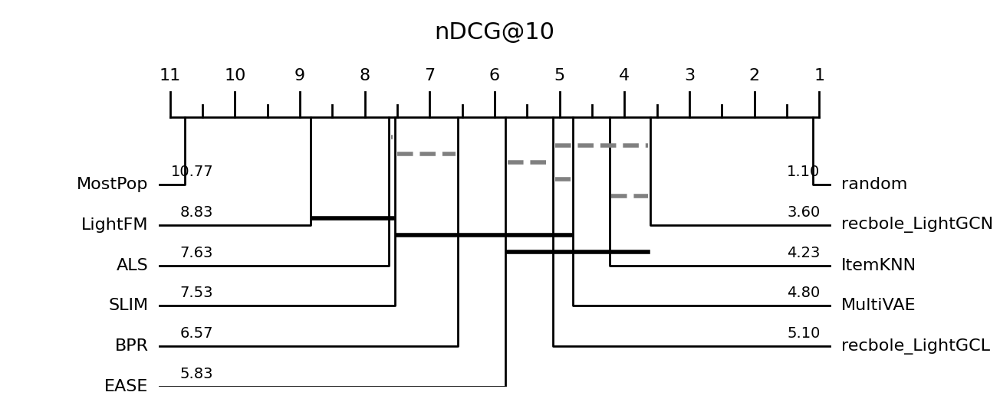

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

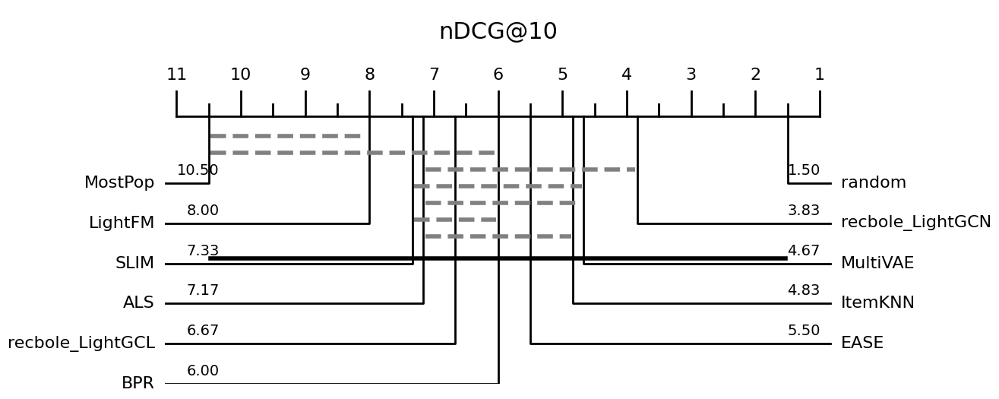

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

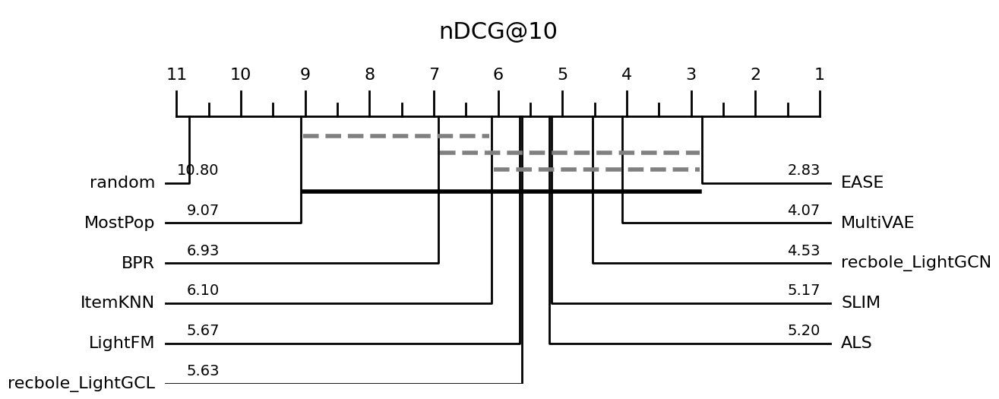

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

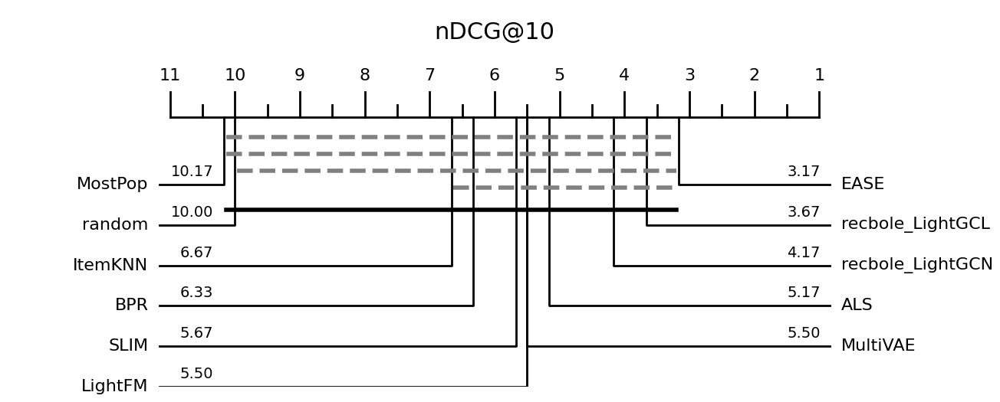

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

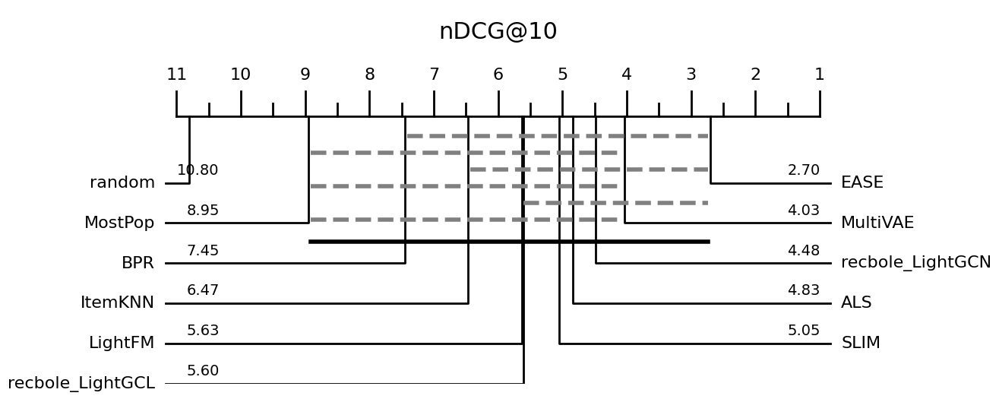

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

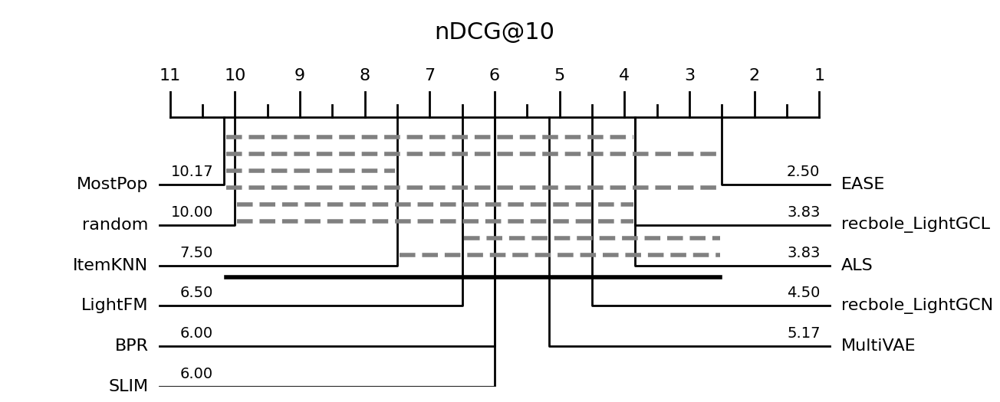

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

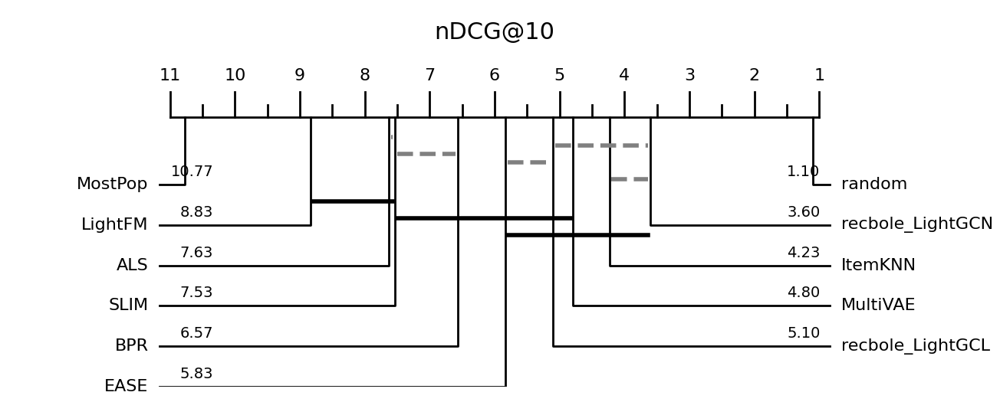

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

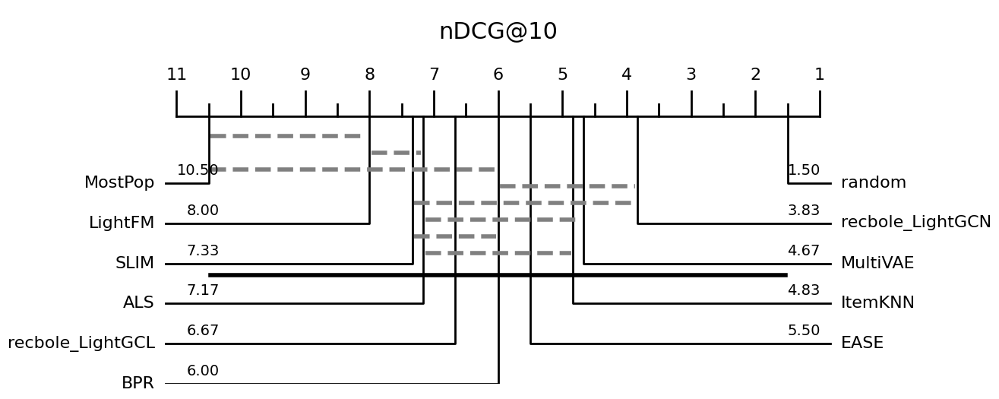

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

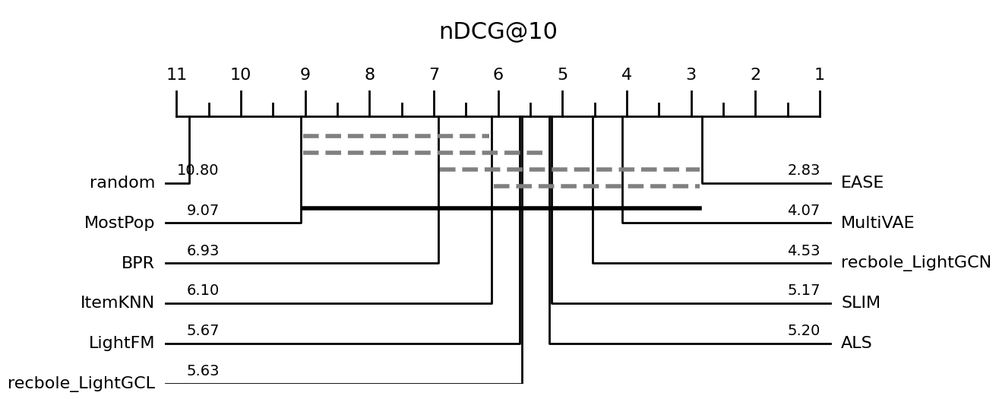

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

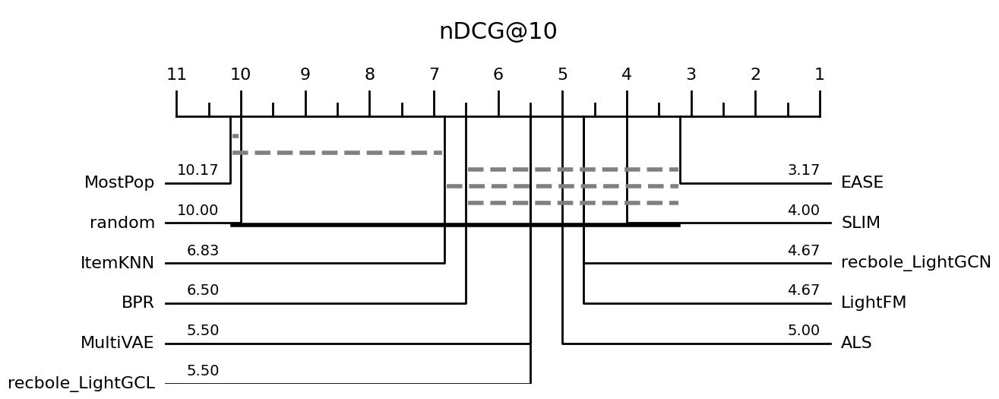

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

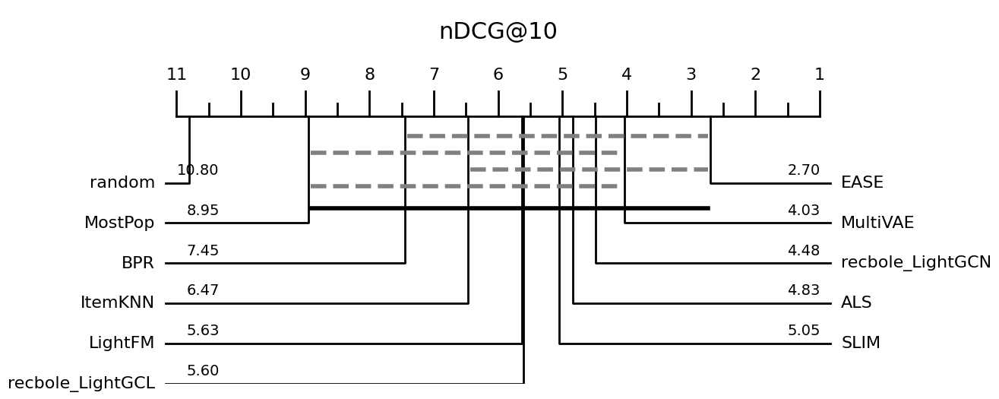

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

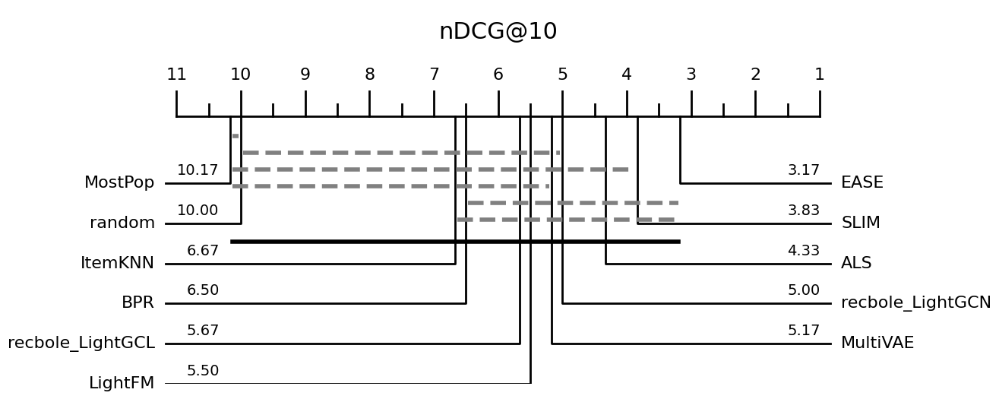

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

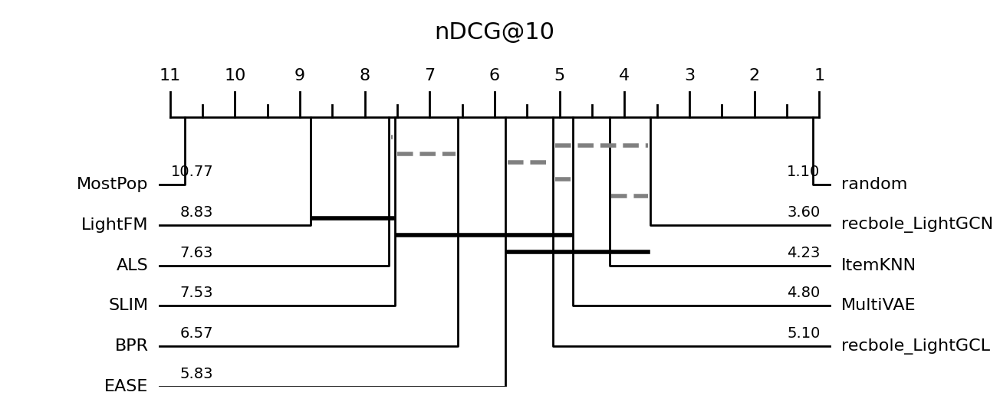

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

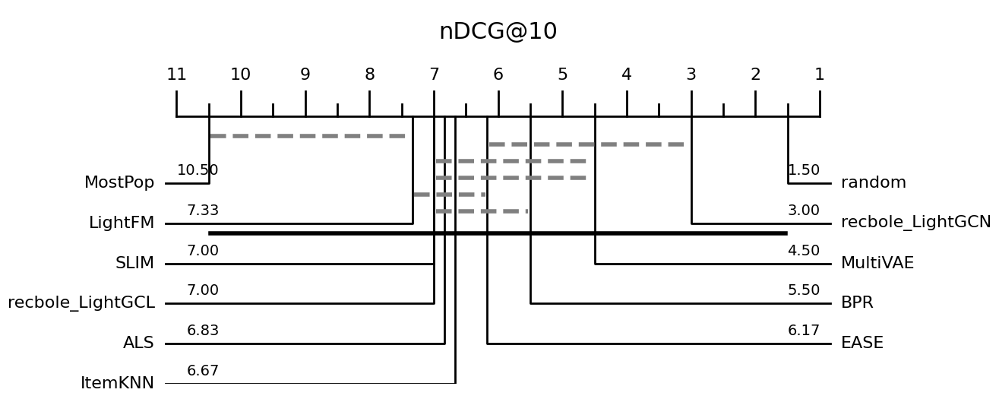

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

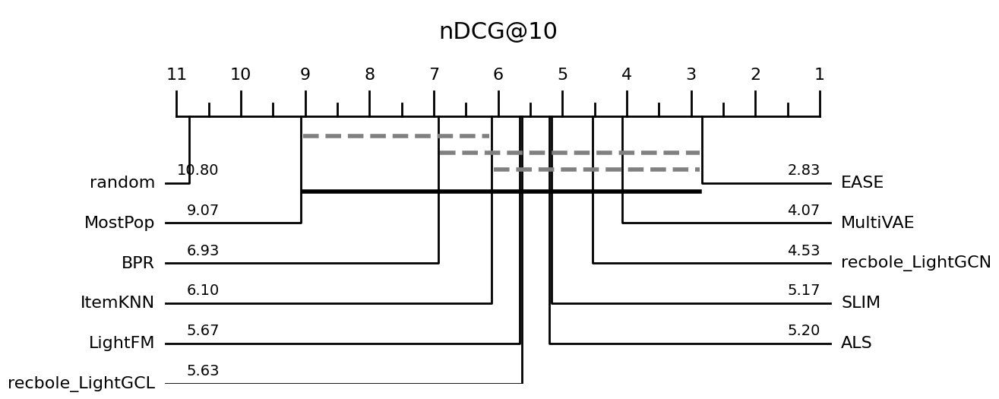

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

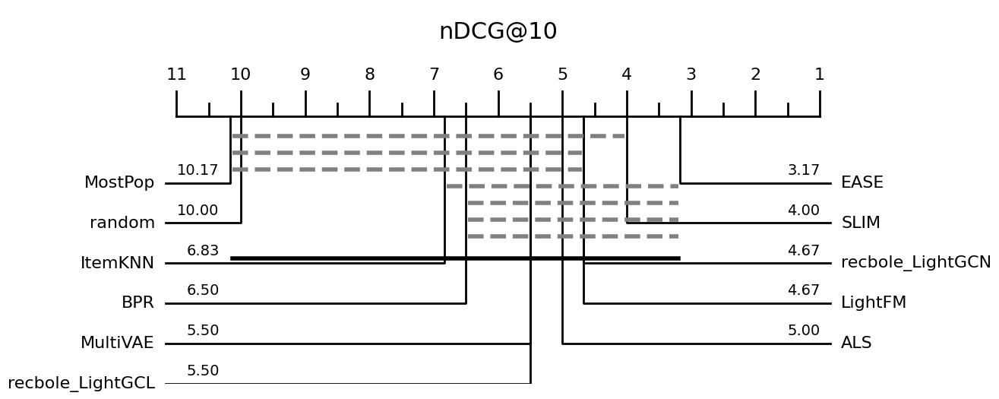

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

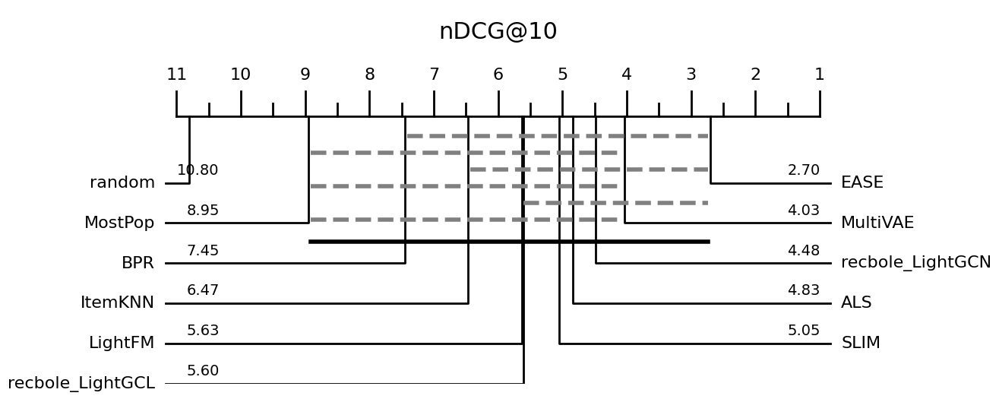

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

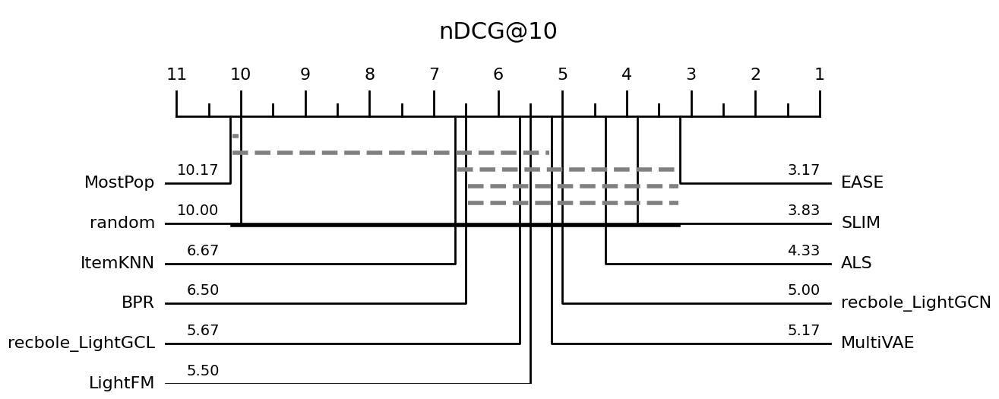

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

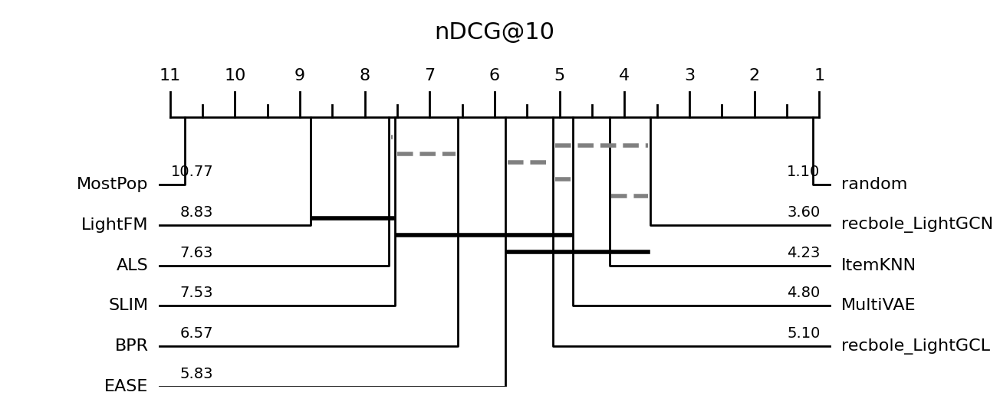

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

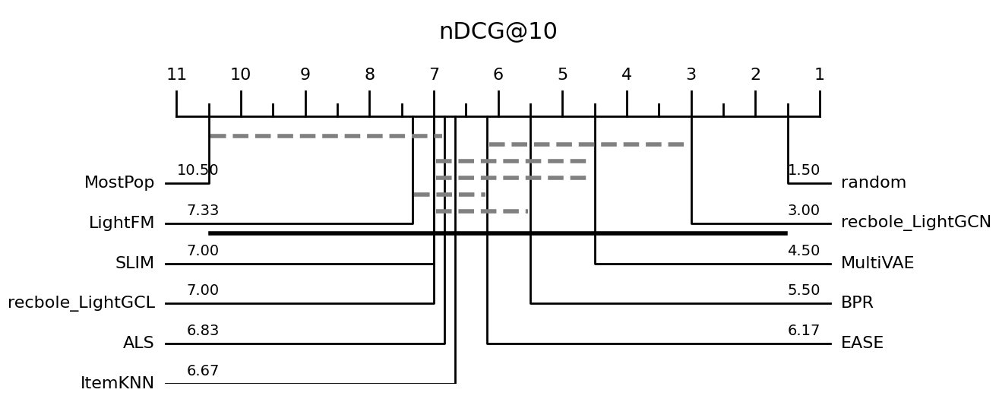

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

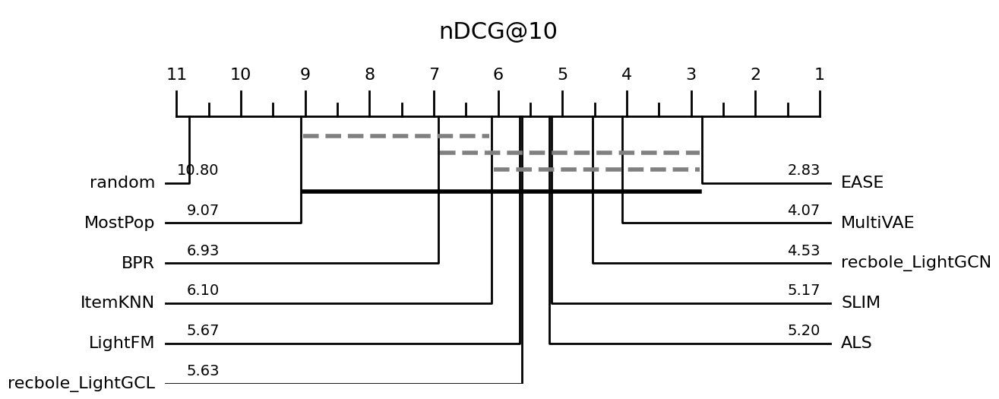

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

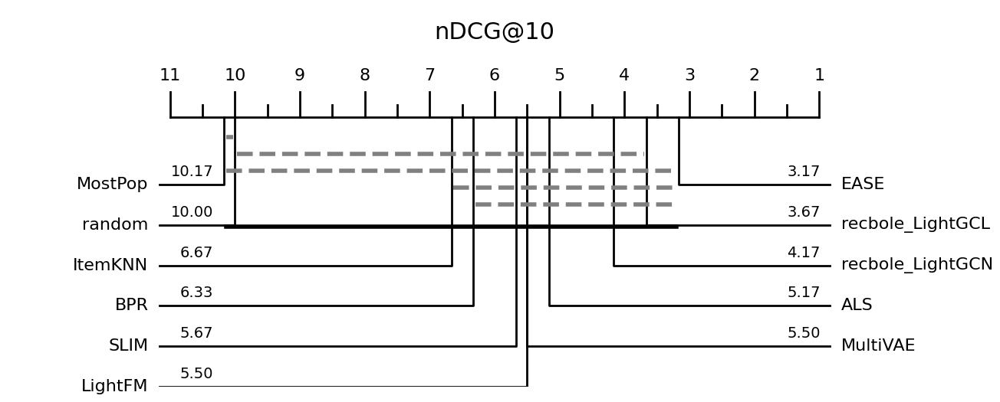

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

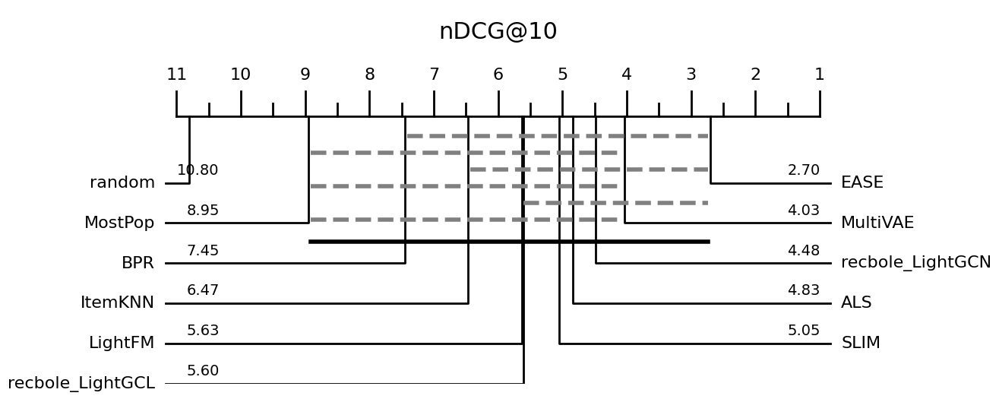

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

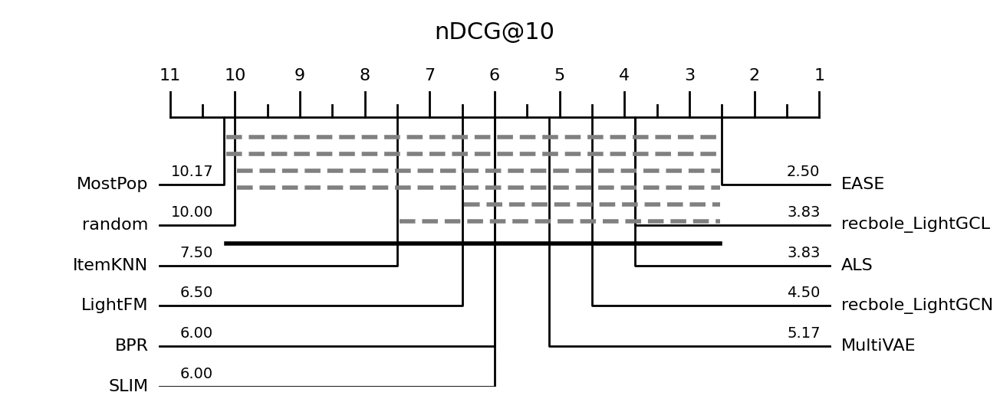

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

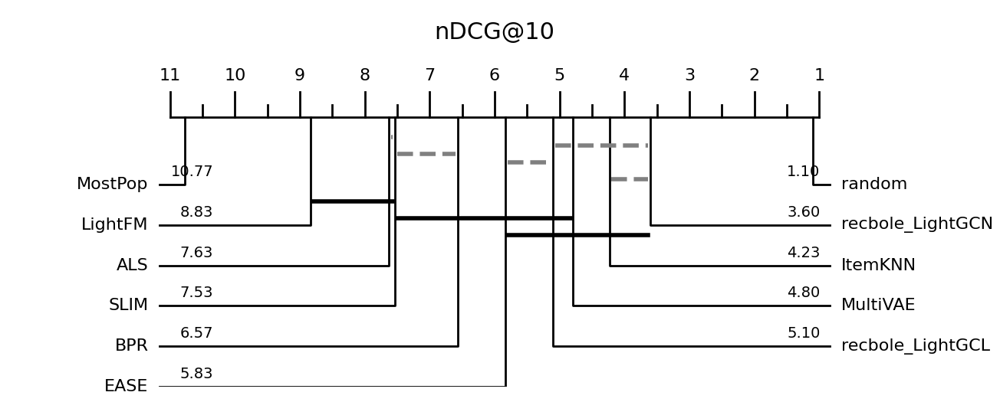

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

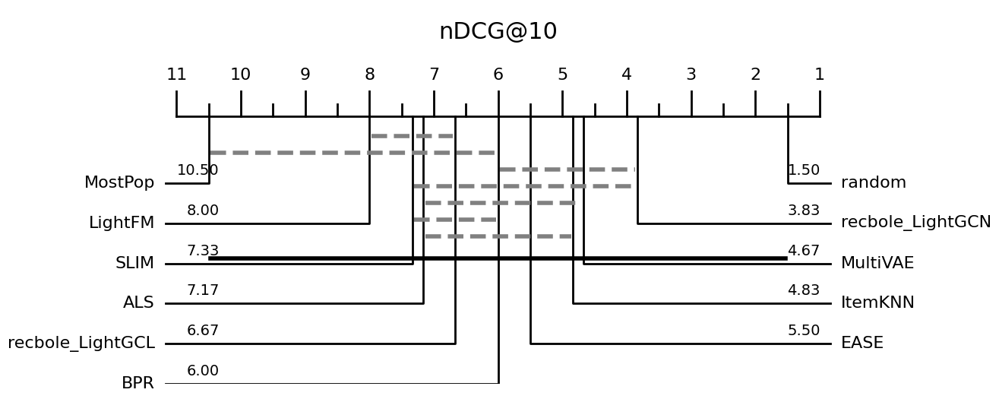

In [57]:
a_score_list = []
methods = ['gm_value']
for x in tqdm(range(100)):
    cur_best_indices, _ = run_a_optimal(df_results.values, k_datasets, seed=x)
    a_optimal_datasets = list(df_data.reset_index(names="dataset").iloc[cur_best_indices, :]['dataset'])
    a_score_list.append([*get_all_score(a_optimal_datasets, ndcg_res, hitrate_res, coverage_res, "ndcg", 10, methods)])

## Collect results

In [58]:
random_score = np.mean([x[0] for x in random_score_list])
random_score_hitrate = np.mean([x[1] for x in random_score_list])
random_score_coverage = np.mean([x[2] for x in random_score_list])

k_score = np.mean([x[0] for x in kmeans_score_list])
k_score_hitrate = np.mean([x[1] for x in kmeans_score_list])
k_score_coverage = np.mean([x[2] for x in kmeans_score_list])

d_optimal_score = np.mean([x[0] for x in d_score_list])
d_optimal_score_hitrate = np.mean([x[1] for x in d_score_list])
d_optimal_score_coverage = np.mean([x[2] for x in d_score_list])

a_optimal_score = np.mean([x[0] for x in a_score_list])
a_optimal_score_hitrate = np.mean([x[1] for x in a_score_list])
a_optimal_score_coverage = np.mean([x[2] for x in a_score_list])

In [59]:
results = pd.DataFrame([['KMeans', k_score], ['Random', random_score], ["D optimal", d_optimal_score], ["A optimal", a_optimal_score]],\
                       columns=['Method', 'Spearmanr_nDCG@10'])

In [60]:
results_hitrate = pd.DataFrame([['KMeans', k_score_hitrate], ['Random', random_score_hitrate], ["D optimal", d_optimal_score_hitrate], ["A optimal", a_optimal_score_hitrate]],\
                       columns=['Method', 'Spearmanr_HitRate@10'])

results = pd.merge(results, results_hitrate, left_on="Method", right_on="Method")

In [61]:
results_coverage = pd.DataFrame([['KMeans', k_score_coverage], ['Random', random_score_coverage], ["D optimal", d_optimal_score_coverage], ["A optimal", a_optimal_score_coverage]],\
                       columns=['Method', 'Spearmanr_Coverage'])

results = pd.merge(results, results_coverage, left_on="Method", right_on="Method")

In [62]:
# all features + 6 datasets
results

,Method,Spearmanr_nDCG@10,Spearmanr_HitRate@10,Spearmanr_Coverage
0,KMeans,0.845455,0.900000,0.981818
1,Random,0.945455,0.981818,0.936364
2,D optimal,0.805182,0.819182,0.913818
3,A optimal,0.683636,0.696364,0.893636


In [63]:
results.to_latex()

'\\begin{tabular}{llrrr}\n\\toprule\n{} &     Method &  Spearmanr\\_nDCG@10 &  Spearmanr\\_HitRate@10 &  Spearmanr\\_Coverage \\\\\n\\midrule\n0 &  KMeans &  0.845455 &  0.900000 &  0.981818 \\\\\n1 &  Random &  0.945455 &  0.981818 &  0.936364 \\\\\n2 &  D optimal &  0.805182 &  0.819182 &  0.913818 \\\\\n3 &  A optimal &  0.683636 &  0.696364 &  0.893636 \\\\\n\\bottomrule\n\\end{tabular}\n'